In [18]:
import sys
sys.path.insert(0, '..')

import torch
import os
import wandb
import random
import numpy as np
import torch
from torch import nn
from torch.optim import Adam
from ignite.handlers.param_scheduler import create_lr_scheduler_with_warmup
from torch.utils.data import DataLoader
from datetime import datetime
import matplotlib
import matplotlib.pyplot as plt
import pandas as pd
from scipy import stats

from core.final.dataset import PSMDataset
from core.final.model import GalSpecNet, MetaModel, Informer, AstroModel
from core.final.trainer import Trainer

In [19]:
matplotlib.use('Agg')

In [4]:
def get_model(config):
    if config['mode'] == 'photo':
        model = Informer(config)
    elif config['mode'] == 'spectra':
        model = GalSpecNet(config)
    elif config['mode'] == 'meta':
        model = MetaModel(config)
    else:
        model = AstroModel(config)

    return model

In [5]:
def calc_results(run_id, last_epoch):
    api = wandb.Api()
    run = api.run(run_id)
    config = run.config
    config['use_wandb'] = False

    test_dataset = PSMDataset(config, split='test')
    test_dataloader = DataLoader(test_dataset, batch_size=config['batch_size'], shuffle=False)
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    
    model = get_model(config)
    model = model.to(device)
    
    weights_path = os.path.join(config['weights_path'] + '-' + run_id.split('/')[-1], f'weights-{last_epoch}.pth')
    model.load_state_dict(torch.load(weights_path, weights_only=False))

    trainer = Trainer(model=model, optimizer=None, scheduler=None, warmup_scheduler=None, criterion=None, device=device, config=config)
    conf_matrix = trainer.evaluate(test_dataloader, test_dataset.id2target)
    acc = np.trace(conf_matrix) / np.sum(conf_matrix)
    
    return acc

In [17]:
meta_acc = []
meta_runs = ['gx79cwy1', 'mxhp83k6', 'pohdj41b', '8lwt2oyw', 'vdkr6541']

for i in range(5):
    acc = calc_results('MeriDK/AstroCLIPResults3/' + meta_runs[i], 'best')
    meta_acc.append(acc)

100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:01<00:00,  3.75it/s]


In [18]:
meta_clip_acc = []
meta_clip_runs = ['0mhn7yyn', 'i3nmcnpa', 'tawy8din', '7gmyyp92', '4w8p5svu']

for i in range(5):
    acc = calc_results('MeriDK/AstroCLIPResults3/' + meta_clip_runs[i], 'best')
    meta_clip_acc.append(acc)

100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:01<00:00,  3.24it/s]


In [23]:
photo_acc = []
photo_runs = ['m0w1hknn', '0garrgiy', '4cq4jjc9', 'c5luo6d5', 'f7yhr8dl']

for i in range(5):
    acc = calc_results('MeriDK/AstroCLIPResults3/' + photo_runs[i], 'best')
    photo_acc.append(acc)

100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:10<00:00,  2.03s/it]


In [24]:
photo_clip_acc = []
photo_clip_runs = ['xnybvuhw', 'wai5e2ke', '908122l4', 'f86a9tym', 'qyk7jg0k']

for i in range(5):
    acc = calc_results('MeriDK/AstroCLIPResults3/' + photo_clip_runs[i], 'best')
    photo_clip_acc.append(acc)

100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:09<00:00,  1.86s/it]


In [25]:
spectra_acc = []
spectra_runs = ['gd0dg12h', '83n7edwo', 'vsj2tuzv', '4qxbejzj', 'i0a0658h']

for i in range(5):
    acc = calc_results('MeriDK/AstroCLIPResults3/' + spectra_runs[i], 'best')
    spectra_acc.append(acc)

100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:30<00:00,  6.11s/it]


In [27]:
spectra_clip_acc = []
spectra_clip_runs = ['rgkviuci', 'r6x5jhjb', 'uizsb0lw', '3u6tn1j4', '3jtsx0yf']

for i in range(5):
    acc = calc_results('MeriDK/AstroCLIPResults3/' + spectra_clip_runs[i], 'best')
    spectra_clip_acc.append(acc)

100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:41<00:00,  8.24s/it]


In [35]:
all_acc = []
all_runs = ['a2yhz2yc', 'wb84envi', 'jv29p659', 'o6e86f3t', 'ufnddxh4']

for i in range(5):
    acc = calc_results('MeriDK/AstroCLIPResults3/' + all_runs[i], 'best')
    all_acc.append(acc)

100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:45<00:00,  9.17s/it]


In [38]:
all_clip_acc = []
all_clip_runs = ['3c2da15u', '6itjj8ht', 'ijwzzqo4', 'ufzqcka3', '3wsssct8']

for i in range(5):
    acc = calc_results('MeriDK/AstroCLIPResults3/' + all_clip_runs[i], 'best')
    all_clip_acc.append(acc)

100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:34<00:00,  6.88s/it]


In [77]:
mean = np.mean(meta_acc)
std = np.std(meta_acc)

print('mean', round(mean * 100, 3), 'std', round(std * 100, 3), 'min', round((mean - std) * 100, 3), 'max', round((mean + std) * 100, 3))

mean 85.623 std 0.628 min 84.995 max 86.25


In [78]:
mean = np.mean(meta_clip_acc)
std = np.std(meta_clip_acc)

print('mean', round(mean * 100, 3), 'std', round(std * 100, 3), 'min', round((mean - std) * 100, 3), 'max', round((mean + std) * 100, 3))

mean 85.855 std 0.856 min 84.999 max 86.711


In [79]:
mean = np.mean(photo_acc)
std = np.std(photo_acc)

print('mean', round(mean * 100, 3), 'std', round(std * 100, 3), 'min', round((mean - std) * 100, 3), 'max', round((mean + std) * 100, 3))

mean 84.642 std 6.317 min 78.325 max 90.96


In [80]:
mean = np.mean(photo_clip_acc)
std = np.std(photo_clip_acc)

print('mean', round(mean * 100, 3), 'std', round(std * 100, 3), 'min', round((mean - std) * 100, 3), 'max', round((mean + std) * 100, 3))

mean 91.468 std 0.446 min 91.022 max 91.914


In [81]:
mean = np.mean(spectra_acc)
std = np.std(spectra_acc)

print('mean', round(mean * 100, 3), 'std', round(std * 100, 3), 'min', round((mean - std) * 100, 3), 'max', round((mean + std) * 100, 3))

mean 76.278 std 0.931 min 75.346 max 77.209


In [82]:
mean = np.mean(spectra_clip_acc)
std = np.std(spectra_clip_acc)

print('mean', round(mean * 100, 3), 'std', round(std * 100, 3), 'min', round((mean - std) * 100, 3), 'max', round((mean + std) * 100, 3))

mean 77.396 std 0.614 min 76.782 max 78.01


In [83]:
mean = np.mean(all_acc)
std = np.std(all_acc)

print('mean', round(mean * 100, 3), 'std', round(std * 100, 3), 'min', round((mean - std) * 100, 3), 'max', round((mean + std) * 100, 3))

mean 94.065 std 0.39 min 93.674 max 94.455


In [84]:
mean = np.mean(all_clip_acc)
std = np.std(all_clip_acc)

print('mean', round(mean * 100, 3), 'std', round(std * 100, 3), 'min', round((mean - std) * 100, 3), 'max', round((mean + std) * 100, 3))

mean 94.153 std 0.577 min 93.576 max 94.73


In [41]:
mean_acc = [np.mean(spectra_acc), np.mean(spectra_clip_acc), np.mean(photo_acc), np.mean(photo_clip_acc),
            np.mean(meta_acc), np.mean(meta_clip_acc), np.mean(all_acc), np.mean(all_clip_acc)]
std_acc = [np.std(spectra_acc), np.std(spectra_clip_acc), np.std(photo_acc), np.std(photo_clip_acc),
            np.std(meta_acc), np.std(meta_clip_acc), np.std(all_acc), np.std(all_clip_acc)]
mean_acc = [el * 100 for el in mean_acc]
std_acc = [el * 100 for el in std_acc]

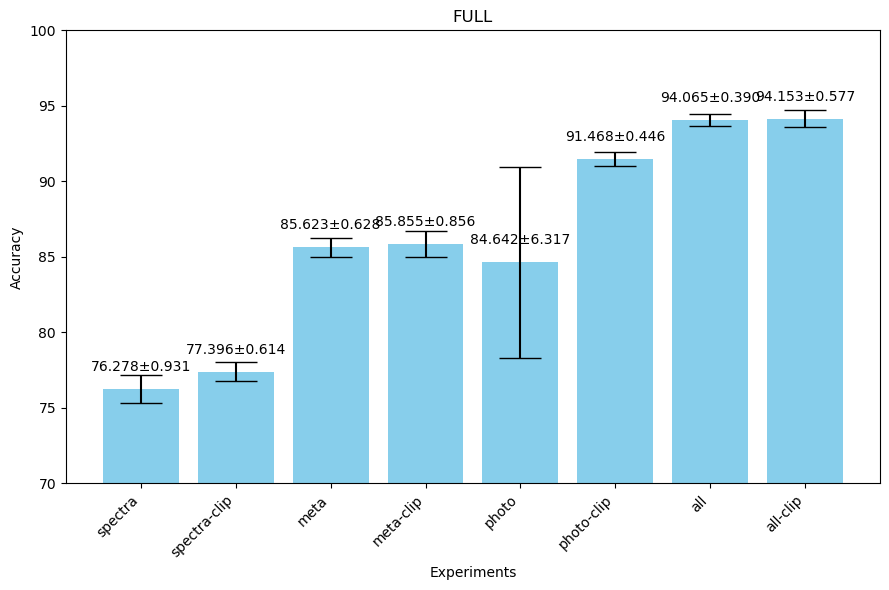

In [51]:
mean_acc = [np.mean(spectra_acc), np.mean(spectra_clip_acc), np.mean(meta_acc), np.mean(meta_clip_acc),
            np.mean(photo_acc), np.mean(photo_clip_acc), np.mean(all_acc), np.mean(all_clip_acc)]
std_acc = [np.std(spectra_acc), np.std(spectra_clip_acc), np.std(meta_acc), np.std(meta_clip_acc),
            np.std(photo_acc), np.std(photo_clip_acc), np.std(all_acc), np.std(all_clip_acc)]
mean_acc = [el * 100 for el in mean_acc]
std_acc = [el * 100 for el in std_acc]

fig, ax = plt.subplots(figsize=(9, 6))
bars = ax.bar(['spectra', 'spectra-clip', 'meta', 'meta-clip', 'photo', 'photo-clip', 'all', 'all-clip'], 
               mean_acc, yerr=std_acc, capsize=15, color='skyblue')

ax.set_xlabel('Experiments')
ax.set_ylabel('Accuracy')
ax.set_title('FULL')
ax.set_ylim(70, 100)

plt.xticks(rotation=45, ha='right')

for bar, mean, std in zip(bars, mean_acc, std_acc):
    yval = bar.get_height()
    ax.text(bar.get_x() + bar.get_width() / 2, yval + 1, f'{mean:.3f}±{std:.3f}', ha='center', va='bottom')

plt.tight_layout()
plt.show()

In [56]:
sub50 = {
    'photo': ['uwi549ko', 'lasio95e', 'ssjgsf4o', '8pjmji36', 'ey93jptd'],
    'spectra': ['9w2iy7if', 'uxdgxzzg', '20jf5fc3', 'apy0hwze', 'l8r1v87z'],
    'meta': ['dnql8zxb', 'w4z8mc7g', '872t6r9u', 'pdk8lhmr', 'tiorlnpa'],
    'all': ['awnlvghm', 'u7lhipcv', 'ibj38qtl', 'v268pfls', '10k7n8f8'],
    'photoclip': ['6cfb67n2', 'u2xrn2es', '7ds9f4j0', 'yoel2uju', 'klhhmrgz'],
    'spectraclip': ['jft4o7ll', '2ys1pu74', '0u83wkoo', 'ubyfjbl6', '6mhe95eb'],
    'metaclip': ['6afyvxnq', 'f4lt4n3m', '1hlifayz', '30m8j9kv', 'a2pps0vg'],
    'allclip': ['52fk0181', 'f4hvk7s9', 'xm2gkm0g', 'sf3f1fn7', '80s6j269']
}

sub25 = {
    'photo': ['i16e091u', 'yq6wrwn8', 'khf2rzs1', '32po6rjv', '3oz9g756'],
    'spectra': ['85x94bpe', 'k4pywvjv', 'dy7uliaw', 's66ifk69', 'rn3x84v9'],
    'meta': ['5n21zp2m', 'e2jkak5c', '02zpe2gy', 'dado4tth', 'etn9tbcy'],
    'all': ['wit0n3w3', 'w3d0xbe2', '96fwt2gx', 'du5zsfz6', '0k73x5qd'],
    'photoclip': ['1xgyaljv', '35idhf4w', 'o8n5dti7', 'fhpmo60y', '4at8i8ji'],
    'spectraclip': ['x1ec0yff', 'd5c3rhwz', 'kggejkom', '52xgy4wt', 'r5ctmuri'],
    'metaclip': ['osxq73a0', 'p2ozjutp', 'sce7zk10', 'bw5lzst5', '8hhqrs6d'],
    'allclip': ['a5peiq96', '05o27w72', 'xnbiygd1', '71qz3y5q', 'j8bnyk18']
}

sub10 = {
    'photo': ['nq1bhy0w', 'ogd2l28v', 'yagx8pk7', 'eh9qmriw', 'mk9ckjb4'],
    'spectra': ['vvljqb9o', 'bjnix390', 'wwrv3nut', 'pagk0jo5', '2dx7j4sy'],
    'meta': ['qqjg8qk3', 'n38nru7q', 'xftkn3gw', 'dtcx3xqk', 'r5mqe2rp'],
    'all': ['8hl6cpj7', 'h01wkom5', '5ivkbdrq', '5l9h32ak', 'thf3hzty'],
    'photoclip': ['v9hs5mvj', 'vc0tj3ee', '451pr1oc', 'lit1jza0', 'xp3lxwkn'],
    'spectraclip': ['x27wg2o5', 'gbp5cbc4', '0t8y55t8', 'hu285ze4', '3xe7g7ac'],
    'metaclip': ['0sjxdzrr', 'fm8wkcdn', 'vsku583d', '68n5fsm7', 'plpa1d4x'],
    'allclip': ['h4bq7juh', '7l1h5ak1', '6apkn9rt', 'hqwxn9df', 'eeur7zbf']
}

In [31]:
meta_sub_acc = {
    'meta': {
        'sub50': [],
        'sub25': [],
        'sub10': []
    },
    'metaclip': {
        'sub50': [],
        'sub25': [],
        'sub10': []
    }
}

for mode in meta_sub_acc:
    for s in meta_sub_acc[mode]:
        print(mode, s)
        
        if s == 'sub50':
            runs = sub50[mode]
        elif s == 'sub25':
            runs = sub25[mode]
        elif s == 'sub10':
            runs = sub10[mode]

        for r in runs:
            acc = calc_results('MeriDK/AstroCLIPResults3/' + r, 'best')
            meta_sub_acc[mode][s].append(acc)

meta sub50


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00,  4.28it/s]


meta sub25


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:00<00:00,  5.82it/s]


meta sub10


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  9.29it/s]


metaclip sub50


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00,  5.40it/s]


metaclip sub25


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:00<00:00,  4.95it/s]


metaclip sub10


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.50it/s]


In [32]:
photo_sub_acc = {
    'photo': {
        'sub50': [],
        'sub25': [],
        'sub10': []
    },
    'photoclip': {
        'sub50': [],
        'sub25': [],
        'sub10': []
    }
}

for mode in photo_sub_acc:
    for s in photo_sub_acc[mode]:
        print(mode, s)
        
        if s == 'sub50':
            runs = sub50[mode]
        elif s == 'sub25':
            runs = sub25[mode]
        elif s == 'sub10':
            runs = sub10[mode]

        for r in runs:
            acc = calc_results('MeriDK/AstroCLIPResults3/' + r, 'best')
            photo_sub_acc[mode][s].append(acc)

photo sub50


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:03<00:00,  1.28s/it]


photo sub25


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:02<00:00,  1.19s/it]


photo sub10


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:01<00:00,  1.10s/it]


photoclip sub50


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:03<00:00,  1.18s/it]


photoclip sub25


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:02<00:00,  1.03s/it]


photoclip sub10


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:01<00:00,  1.01s/it]


In [53]:
spectra_sub_acc = {
    'spectra': {
        'sub50': [],
        'sub25': [],
        'sub10': []
    },
    'spectraclip': {
        'sub50': [],
        'sub25': [],
        'sub10': []
    }
}

for mode in spectra_sub_acc:
    for s in spectra_sub_acc[mode]:
        print(mode, s)
        
        if s == 'sub50':
            runs = sub50[mode]
        elif s == 'sub25':
            runs = sub25[mode]
        elif s == 'sub10':
            runs = sub10[mode]

        for r in runs:
            acc = calc_results('MeriDK/AstroCLIPResults3/' + r, 'best')
            spectra_sub_acc[mode][s].append(acc)

spectra sub50


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:20<00:00,  6.90s/it]


spectra sub25


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:08<00:00,  4.31s/it]


spectra sub10


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.32s/it]


spectraclip sub50


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:18<00:00,  6.02s/it]


spectraclip sub25


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:07<00:00,  3.67s/it]
/global/home/users/mariia/AstroML/notebooks/../core/final/trainer.py:245: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(20, 7))
100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:09<00:00,  4.59s/it]


spectraclip sub10


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.81s/it]


In [57]:
all_sub_acc = {
    'all': {
        'sub50': [],
        'sub25': [],
        'sub10': []
    },
    'allclip': {
        'sub50': [],
        'sub25': [],
        'sub10': []
    }
}

for mode in all_sub_acc:
    for s in all_sub_acc[mode]:
        print(mode, s)
        
        if s == 'sub50':
            runs = sub50[mode]
        elif s == 'sub25':
            runs = sub25[mode]
        elif s == 'sub10':
            runs = sub10[mode]

        for r in runs:
            acc = calc_results('MeriDK/AstroCLIPResults3/' + r, 'best')
            all_sub_acc[mode][s].append(acc)

all sub50


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:18<00:00,  6.30s/it]


all sub25


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:08<00:00,  4.42s/it]


all sub10


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.29s/it]


allclip sub50


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:16<00:00,  5.65s/it]


allclip sub25


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:08<00:00,  4.50s/it]


allclip sub10


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  4.00s/it]


In [73]:
for mode in meta_sub_acc:
    for s in meta_sub_acc[mode]:        
        mean = np.mean(meta_sub_acc[mode][s])
        std = np.std(meta_sub_acc[mode][s])
        print(mode, s, 'mean', round(mean * 100, 3), 'std', round(std * 100, 3), 'min', round((mean - std) * 100, 3), 'max', round((mean + std) * 100, 3))

meta sub50 mean 82.501 std 1.476 min 81.026 max 83.977
meta sub25 mean 80.408 std 1.631 min 78.777 max 82.04
meta sub10 mean 75.889 std 1.952 min 73.936 max 77.841
metaclip sub50 mean 83.776 std 1.19 min 82.586 max 84.966
metaclip sub25 mean 82.279 std 1.13 min 81.148 max 83.409
metaclip sub10 mean 78.981 std 0.726 min 78.255 max 79.707


In [74]:
for mode in photo_sub_acc:
    for s in photo_sub_acc[mode]:
        mean = np.mean(photo_sub_acc[mode][s])
        std = np.std(photo_sub_acc[mode][s])
        print(mode, s, 'mean', round(mean * 100, 3), 'std', round(std * 100, 3), 'min', round((mean - std) * 100, 3), 'max', round((mean + std) * 100, 3))

photo sub50 mean 85.821 std 3.493 min 82.328 max 89.313
photo sub25 mean 73.855 std 6.133 min 67.722 max 79.987
photo sub10 mean 64.138 std 9.132 min 55.006 max 73.27
photoclip sub50 mean 89.501 std 1.022 min 88.478 max 90.523
photoclip sub25 mean 89.047 std 0.702 min 88.346 max 89.749
photoclip sub10 mean 90.901 std 1.379 min 89.522 max 92.28


In [75]:
for mode in spectra_sub_acc:
    for s in spectra_sub_acc[mode]:
        mean = np.mean(spectra_sub_acc[mode][s])
        std = np.std(spectra_sub_acc[mode][s])
        print(mode, s, 'mean', round(mean * 100, 3), 'std', round(std * 100, 3), 'min', round((mean - std) * 100, 3), 'max', round((mean + std) * 100, 3))

spectra sub50 mean 69.044 std 1.359 min 67.685 max 70.402
spectra sub25 mean 64.374 std 1.766 min 62.608 max 66.14
spectra sub10 mean 45.222 std 5.363 min 39.859 max 50.586
spectraclip sub50 mean 71.843 std 1.526 min 70.317 max 73.368
spectraclip sub25 mean 68.081 std 1.535 min 66.546 max 69.616
spectraclip sub10 mean 60.238 std 1.803 min 58.434 max 62.041


In [76]:
for mode in all_sub_acc:
    for s in all_sub_acc[mode]:
        mean = np.mean(all_sub_acc[mode][s])
        std = np.std(all_sub_acc[mode][s])
        print(mode, s, 'mean', round(mean * 100, 3), 'std', round(std * 100, 3), 'min', round((mean - std) * 100, 3), 'max', round((mean + std) * 100, 3))

all sub50 mean 92.301 std 0.298 min 92.002 max 92.599
all sub25 mean 91.604 std 0.752 min 90.852 max 92.356
all sub10 mean 88.99 std 0.325 min 88.665 max 89.315
allclip sub50 mean 91.457 std 0.56 min 90.897 max 92.017
allclip sub25 mean 90.956 std 1.222 min 89.734 max 92.178
allclip sub10 mean 89.629 std 1.971 min 87.658 max 91.6


# Tuned splits

In [12]:
sub50 = {
    'photo': ['q9b8ph5p', '943xjhnk', 'vow905ww', '0opfm2a6', '6o1v7g04'],
    'spectra': ['oc14nxmu', '5p6wmxdt', 'onnhqye5', 'tze5f5kx', 'fiw96lnx'],
    'meta': ['4ljr6n0e', '3riejgs7', '9n4lkipq', 'mblruyw0', 'j4mxwf9d'],
    'all': ['g5etsdo8', 'qfuh2kvq', '5pffa9t4', 'fzrb6gp6', 'pw0qekom'],
    'photoclip': ['4sin6pqu', 'r9plugln', 'w0qbnmvk', 'ibwe1q1h', 'f4qv8kut'],
    'spectraclip': ['9m2mfi4m', '8ev9ijya', 'y0z0ftb6', 'q2p5uq5m', 'byeaorwf'],
    'metaclip': ['r632no5g', '6qe0ko6k', 'to5nq082', 'o3ezegp3', 'sa1ltyon'],
    'allclip': ['9g9qqyas', 'zeg3qaiq', '3si0bhbm', '996zv35y', 'dw71clqy']
}

sub25 = {
    'photo': ['1aq9oyxb', '3xuobwrh', 'a6f12yzn', '26dwb2k8', '2csetv6z'],
    'spectra': ['iu20xzfq', '9nvwty1y', 'uplf90sn', 't1z6r0ko', 'i8tnit7g'],
    'meta': ['clpbxbi9', 'nk0lxw8d', 'ho0qn5x2', 'p6t7umn4', '5n04nlml'],
    'all': ['8xxw6hct', 'jdcqtpbo', 'zthscz11', 'ikw4zyv9', 'rrbya5uu'],
    'photoclip': ['ldlytny2', 'k7m2fhdk', 'nxtlqcbs', 'tndp9fgs', 'webpwpf1'],
    'spectraclip': ['9wfsjxw5', 'vytjo0q5', 'od0oaso0', 'jbnz3hlk', 'kho9yw8h'],
    'metaclip': ['z2slwgil', '9u54jnvm', 'jgqmpx33', 'ldvwqqbs', '9irun577'],
    'allclip': ['mhz4bgd2', 'ubk9ba1i', 'bvetcw4j', 'rpruioo7', 'u9gvuld7']
}

sub10 = {
    'photo': ['ihar8oto', 'a5ffkqcq', '84jk53cm', 'm9enev4j', '8vcyw06t'],
    'spectra': ['i75lj7sn', '3g4jc20y', 'w43z083b', 'ohxt72m2', 'amfm6esw'],
    'meta': ['z17a3xgd', 'qn3ct8fh', 'cotmxifl', '6o8k1y23', '64ya96bg'],
    'all': ['6vgzrj5f', 'tspeqvv5', '2kwb0ct0', '0tn6336u', '381vi6i8'],
    'photoclip': ['127jmwc3', 'q2czvw21', 'gxmj7v7r', 'jv6y4miv', 'dgtenbvj'],
    'spectraclip': ['mqr90he8', 'bli9lrt7', 'sb7y6ep2', 'zaaq5f9i', 'nq00pq31'],
    'metaclip': ['gpoosnpg', 'jhmguqz0', 'xa0ncpy4', 'bkcnie6s', 'v2m0h6u4'],
    'allclip': ['ucl8kabg', 'es0usw40', '181wx217', 'v1j281r2', 'mgj36hxv']
}

In [ ]:
meta_sub_acc = {
    'meta': {
        'sub50': [],
        'sub25': [],
        'sub10': []
    },
    'metaclip': {
        'sub50': [],
        'sub25': [],
        'sub10': []
    }
}

for mode in meta_sub_acc:
    for s in meta_sub_acc[mode]:
        print(mode, s)
        
        if s == 'sub50':
            runs = sub50[mode]
        elif s == 'sub25':
            runs = sub25[mode]
        elif s == 'sub10':
            runs = sub10[mode]

        for r in runs:
            acc = calc_results('MeriDK/AstroCLIPResults3/' + r, 'best')
            meta_sub_acc[mode][s].append(acc)

In [20]:
photo_sub_acc = {
    'photo': {
        'sub50': [],
        'sub25': [],
        'sub10': []
    },
    'photoclip': {
        'sub50': [],
        'sub25': [],
        'sub10': []
    }
}

for mode in photo_sub_acc:
    for s in photo_sub_acc[mode]:
        print(mode, s)
        
        if s == 'sub50':
            runs = sub50[mode]
        elif s == 'sub25':
            runs = sub25[mode]
        elif s == 'sub10':
            runs = sub10[mode]

        for r in runs:
            acc = calc_results('MeriDK/AstroCLIPResults3/' + r, 'best')
            photo_sub_acc[mode][s].append(acc)

photo sub50


100%|██████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:03<00:00,  1.32s/it]


photo sub25


100%|██████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:01<00:00,  1.16it/s]


photo sub10


100%|██████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  1.58it/s]


photoclip sub50


100%|██████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:03<00:00,  1.32s/it]


photoclip sub25


100%|██████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:01<00:00,  1.20it/s]
/global/home/users/mariia/AstroML/notebooks/../core/final/trainer.py:245: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(20, 7))
100%|██████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:01<00:00,  1.17it/s]


photoclip sub10


100%|██████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  1.53it/s]


In [22]:
spectra_sub_acc = {
    'spectra': {
        'sub50': [],
        'sub25': [],
        'sub10': []
    },
    'spectraclip': {
        'sub50': [],
        'sub25': [],
        'sub10': []
    }
}

for mode in spectra_sub_acc:
    for s in spectra_sub_acc[mode]:
        print(mode, s)
        
        if s == 'sub50':
            runs = sub50[mode]
        elif s == 'sub25':
            runs = sub25[mode]
        elif s == 'sub10':
            runs = sub10[mode]

        for r in runs:
            acc = calc_results('MeriDK/AstroCLIPResults3/' + r, 'best')
            spectra_sub_acc[mode][s].append(acc)

spectra sub50


100%|██████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:13<00:00,  4.49s/it]


spectra sub25


100%|██████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:06<00:00,  3.16s/it]


spectra sub10


100%|██████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.54s/it]


spectraclip sub50


100%|██████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:13<00:00,  4.50s/it]


spectraclip sub25


100%|██████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:06<00:00,  3.19s/it]


spectraclip sub10


100%|██████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.49s/it]


In [24]:
all_sub_acc = {
    'all': {
        'sub50': [],
        'sub25': [],
        'sub10': []
    },
    'allclip': {
        'sub50': [],
        'sub25': [],
        'sub10': []
    }
}

for mode in all_sub_acc:
    for s in all_sub_acc[mode]:
        print(mode, s)
        
        if s == 'sub50':
            runs = sub50[mode]
        elif s == 'sub25':
            runs = sub25[mode]
        elif s == 'sub10':
            runs = sub10[mode]

        for r in runs:
            acc = calc_results('MeriDK/AstroCLIPResults3/' + r, 'best')
            all_sub_acc[mode][s].append(acc)

all sub50


100%|██████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:17<00:00,  5.91s/it]


all sub25


100%|██████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:08<00:00,  4.27s/it]


all sub10


100%|██████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.98s/it]


allclip sub50


100%|██████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:18<00:00,  6.15s/it]


allclip sub25


100%|██████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:08<00:00,  4.22s/it]


allclip sub10


100%|██████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.22s/it]


In [15]:
for mode in meta_sub_acc:
    for s in meta_sub_acc[mode]:        
        mean = np.mean(meta_sub_acc[mode][s])
        std = np.std(meta_sub_acc[mode][s])
        print(mode, s, 'mean', round(mean * 100, 3), 'std', round(std * 100, 3), 'min', round((mean - std) * 100, 3), 'max', round((mean + std) * 100, 3))

meta sub50 mean 82.035 std 1.452 min 80.583 max 83.487
meta sub25 mean 79.649 std 1.148 min 78.501 max 80.797
meta sub10 mean 76.524 std 1.309 min 75.215 max 77.832
metaclip sub50 mean 83.83 std 1.083 min 82.747 max 84.913
metaclip sub25 mean 81.953 std 1.492 min 80.461 max 83.445
metaclip sub10 mean 79.073 std 1.711 min 77.362 max 80.784


In [21]:
for mode in photo_sub_acc:
    for s in photo_sub_acc[mode]:
        mean = np.mean(photo_sub_acc[mode][s])
        std = np.std(photo_sub_acc[mode][s])
        print(mode, s, 'mean', round(mean * 100, 3), 'std', round(std * 100, 3), 'min', round((mean - std) * 100, 3), 'max', round((mean + std) * 100, 3))

photo sub50 mean 89.177 std 0.518 min 88.659 max 89.696
photo sub25 mean 83.218 std 2.709 min 80.509 max 85.928
photo sub10 mean 83.073 std 1.762 min 81.311 max 84.835
photoclip sub50 mean 90.272 std 0.695 min 89.577 max 90.967
photoclip sub25 mean 88.434 std 0.781 min 87.654 max 89.215
photoclip sub10 mean 90.72 std 1.359 min 89.361 max 92.079


In [23]:
for mode in spectra_sub_acc:
    for s in spectra_sub_acc[mode]:
        mean = np.mean(spectra_sub_acc[mode][s])
        std = np.std(spectra_sub_acc[mode][s])
        print(mode, s, 'mean', round(mean * 100, 3), 'std', round(std * 100, 3), 'min', round((mean - std) * 100, 3), 'max', round((mean + std) * 100, 3))

spectra sub50 mean 68.072 std 1.759 min 66.313 max 69.83
spectra sub25 mean 63.729 std 1.637 min 62.093 max 65.366
spectra sub10 mean 46.677 std 3.486 min 43.191 max 50.164
spectraclip sub50 mean 71.609 std 1.814 min 69.795 max 73.424
spectraclip sub25 mean 67.869 std 1.303 min 66.566 max 69.172
spectraclip sub10 mean 59.235 std 1.399 min 57.836 max 60.633


In [25]:
for mode in all_sub_acc:
    for s in all_sub_acc[mode]:
        mean = np.mean(all_sub_acc[mode][s])
        std = np.std(all_sub_acc[mode][s])
        print(mode, s, 'mean', round(mean * 100, 3), 'std', round(std * 100, 3), 'min', round((mean - std) * 100, 3), 'max', round((mean + std) * 100, 3))

all sub50 mean 91.87 std 0.47 min 91.4 max 92.34
all sub25 mean 90.741 std 1.053 min 89.688 max 91.795
all sub10 mean 88.264 std 2.188 min 86.076 max 90.452
allclip sub50 mean 91.978 std 0.746 min 91.232 max 92.724
allclip sub25 mean 92.073 std 1.066 min 91.007 max 93.14
allclip sub10 mean 90.628 std 1.509 min 89.119 max 92.137


In [27]:
67.869 - 63.729

4.140000000000001

In [28]:
59.235 - 46.677

12.558

In [30]:
90.72 - 83.07

7.650000000000006

In [10]:
spectra_acc = []
spectra_runs = ['MeriDK/AstroCLIPOptuna/jsrtmjun', 'MeriDK/AstroCLIPResults/bt0t9fx4', 'MeriDK/AstroCLIPResults/kjnmt3lm', 
                'MeriDK/AstroCLIPResults/nl9o214g', 'MeriDK/AstroCLIPResults/rc4392ng']
spectra_epochs = [39, 42, 34, 29, 28]

100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:55<00:00, 11.18s/it]


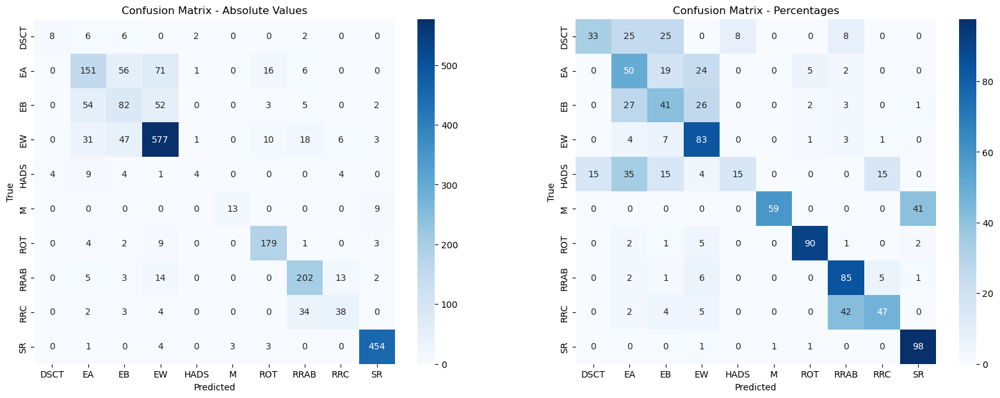

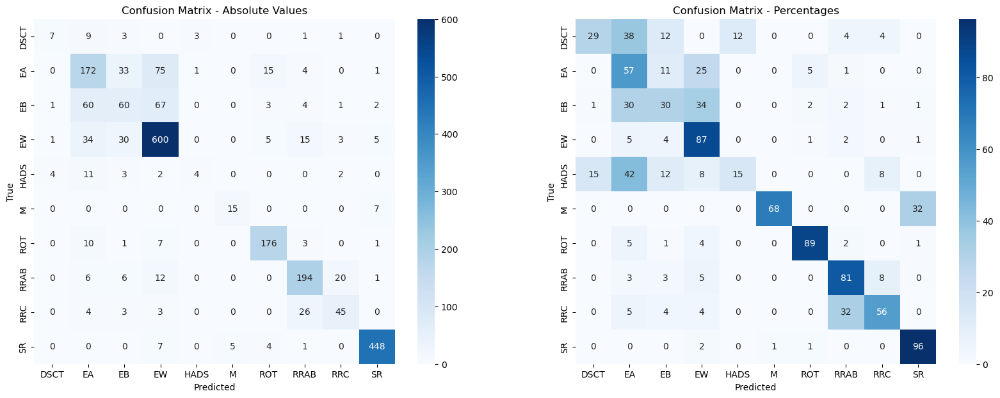

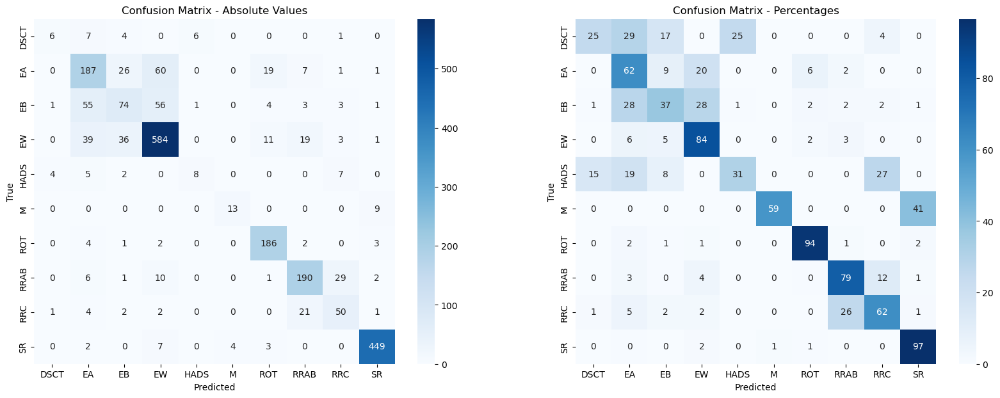

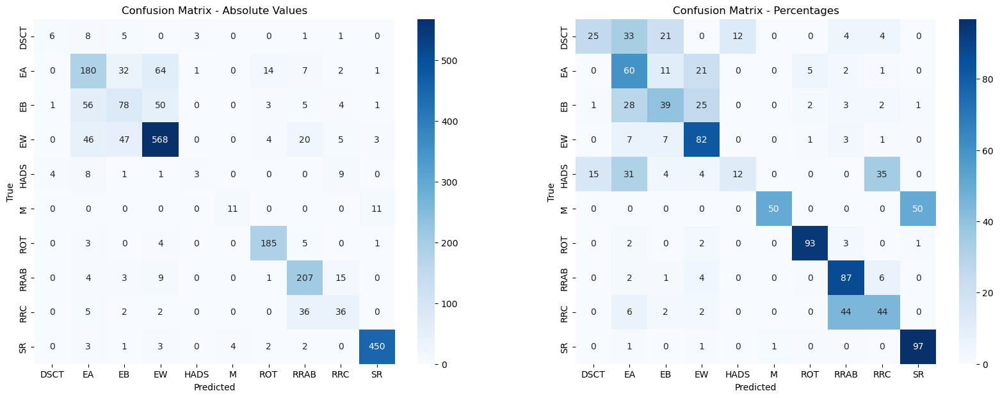

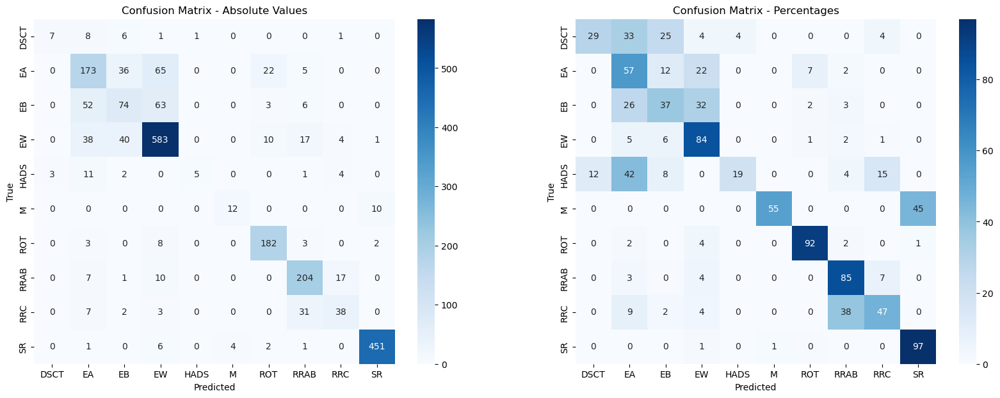

In [11]:
for i in range(5):
    acc = calc_results(spectra_runs[i], spectra_epochs[i])
    spectra_acc.append(acc)

100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:44<00:00,  8.94s/it]


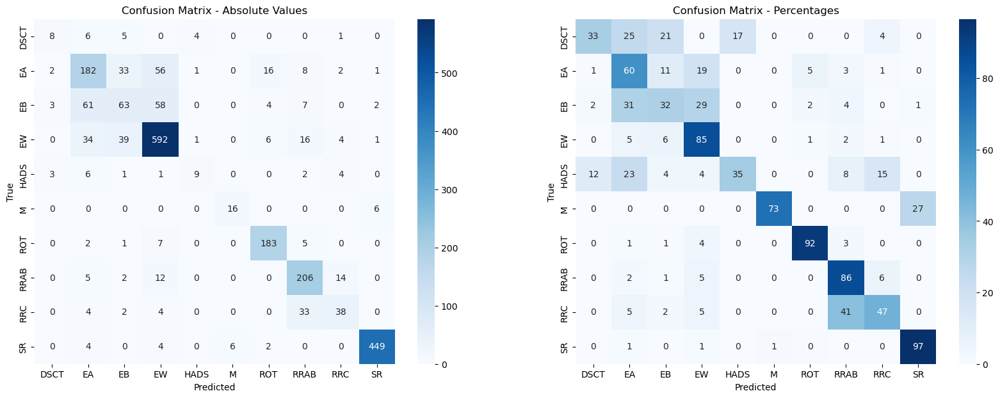

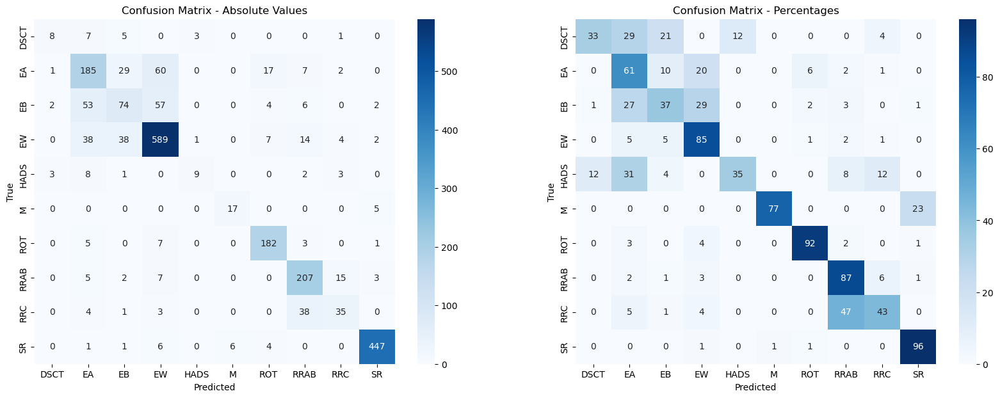

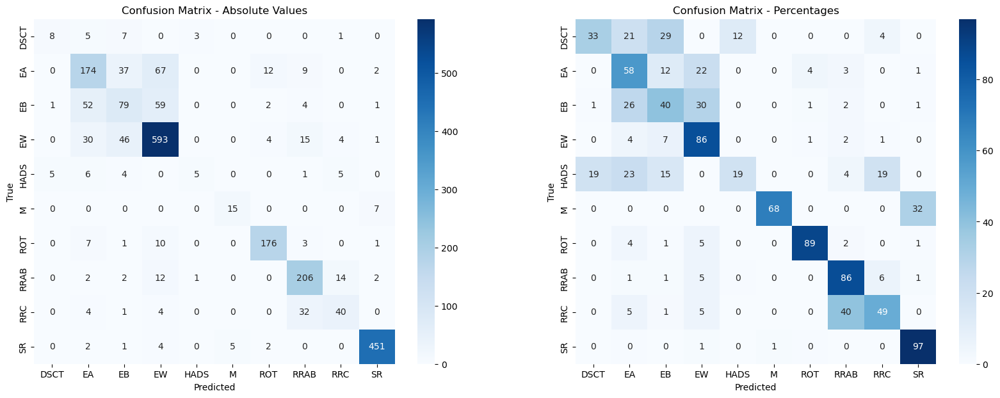

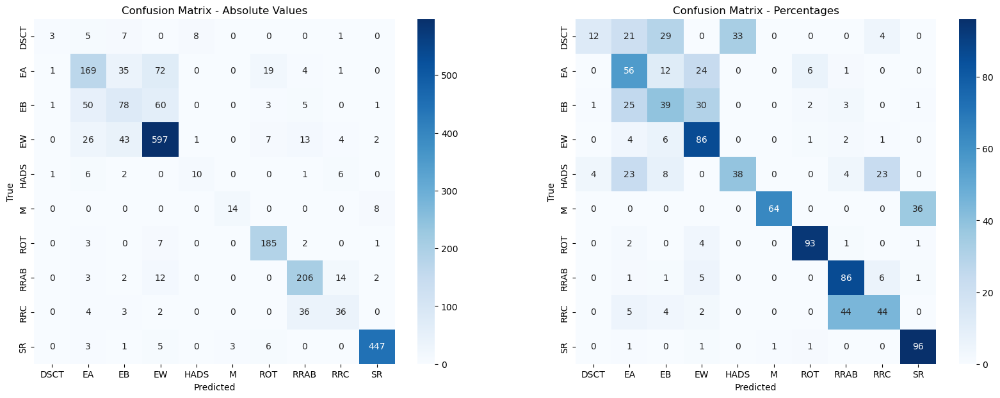

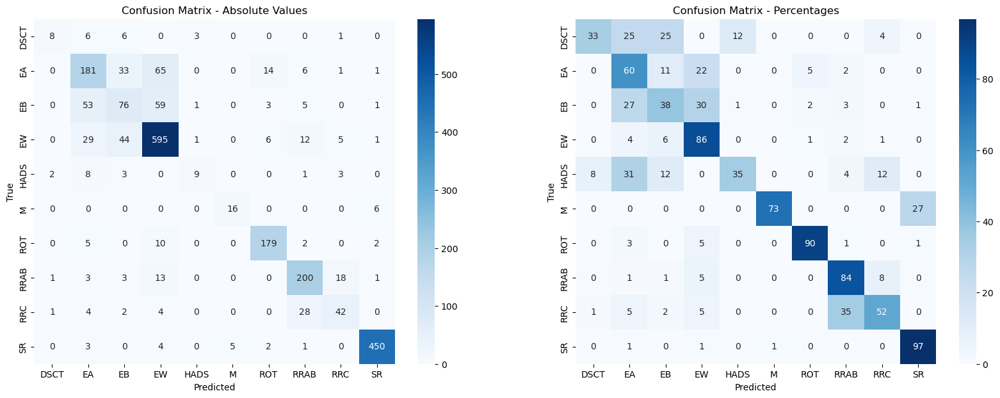

In [13]:
spectra_clip_acc = []
spectra_clip_runs = ['MeriDK/AstroCLIPResults/ejlc1es2', 'MeriDK/AstroCLIPResults/vpdzrvfr', 'MeriDK/AstroCLIPResults/wtqkj9lf', 
                'MeriDK/AstroCLIPResults/aub09non', 'MeriDK/AstroCLIPResults/u5mkb87t']
spectra_clip_epochs = [42, 43, 42, 30, 37]

for i in range(5):
    acc = calc_results(spectra_clip_runs[i], spectra_clip_epochs[i])
    spectra_clip_acc.append(acc)

100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:38<00:00,  7.74s/it]


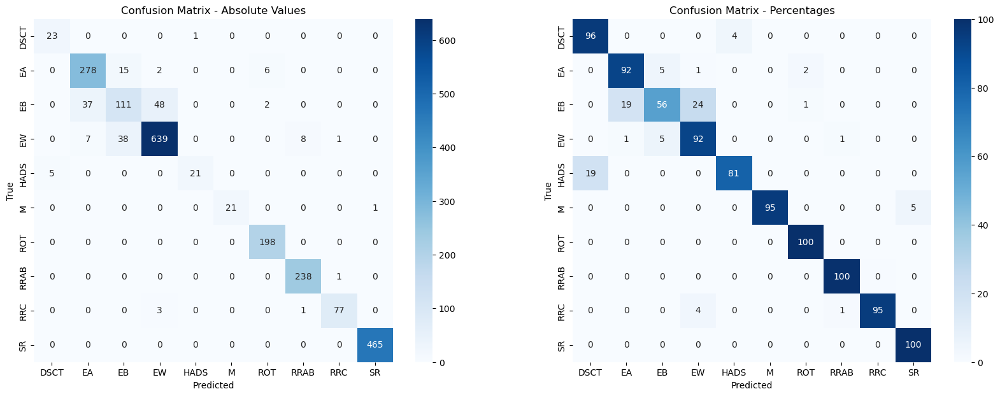

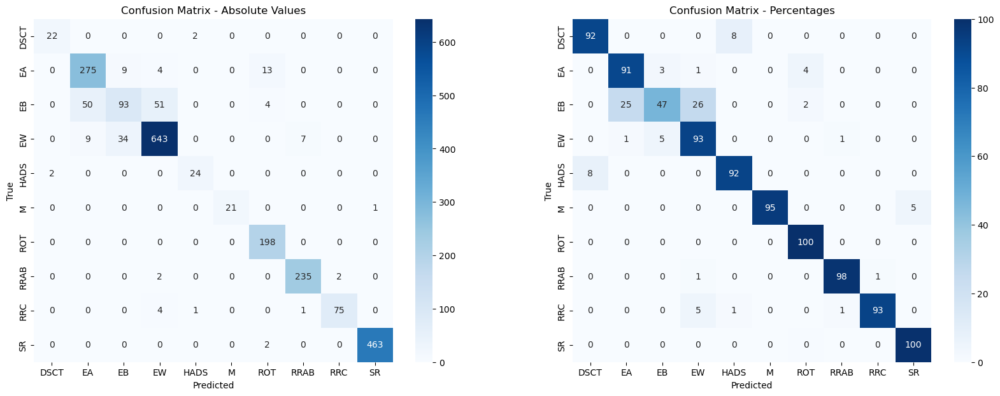

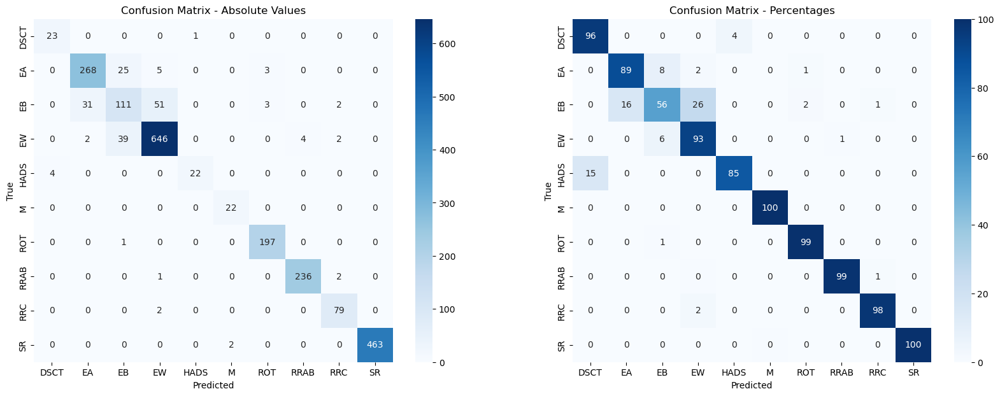

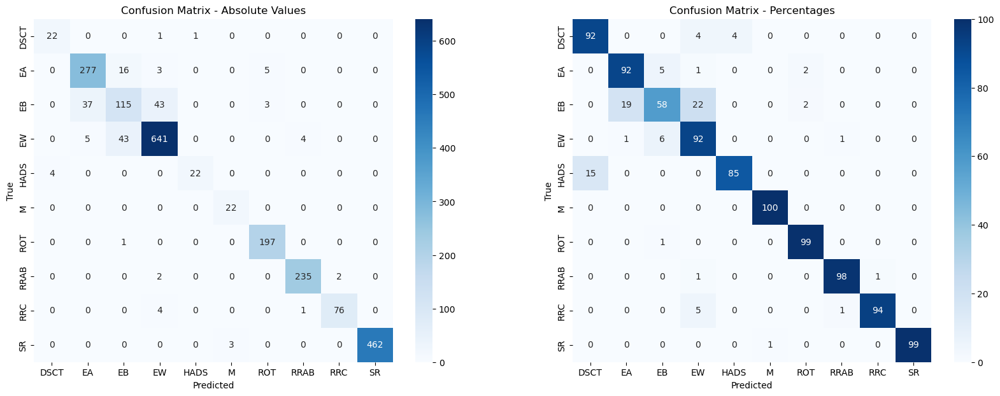

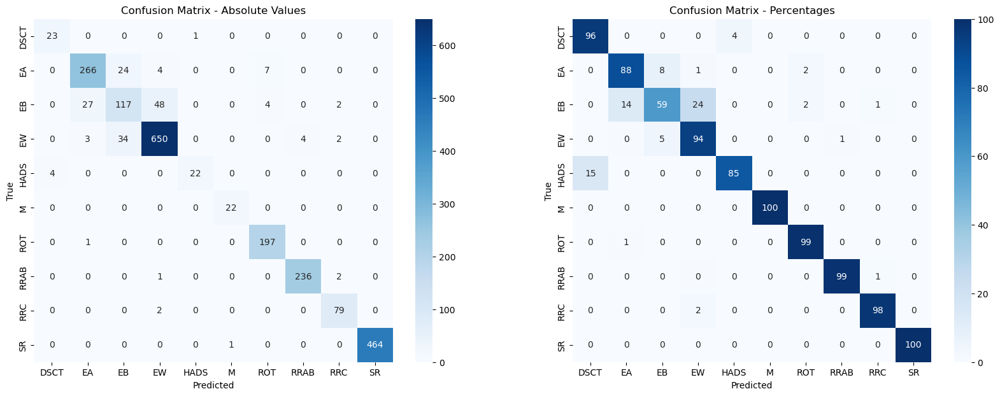

100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:52<00:00, 10.53s/it]


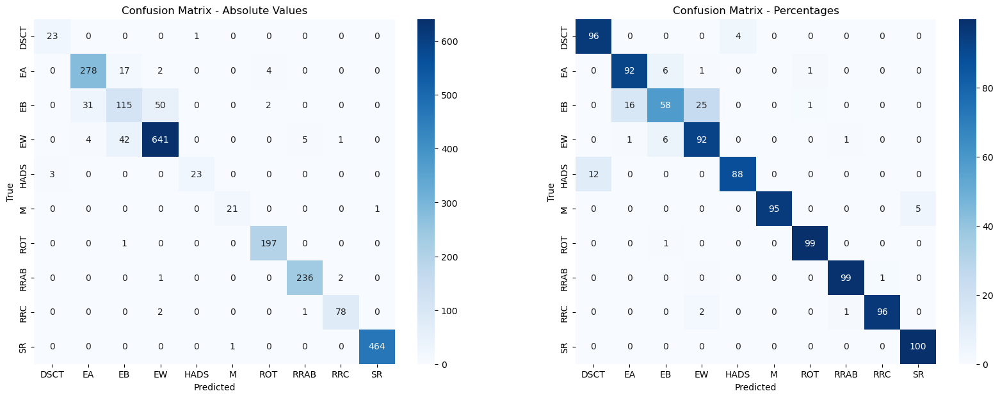

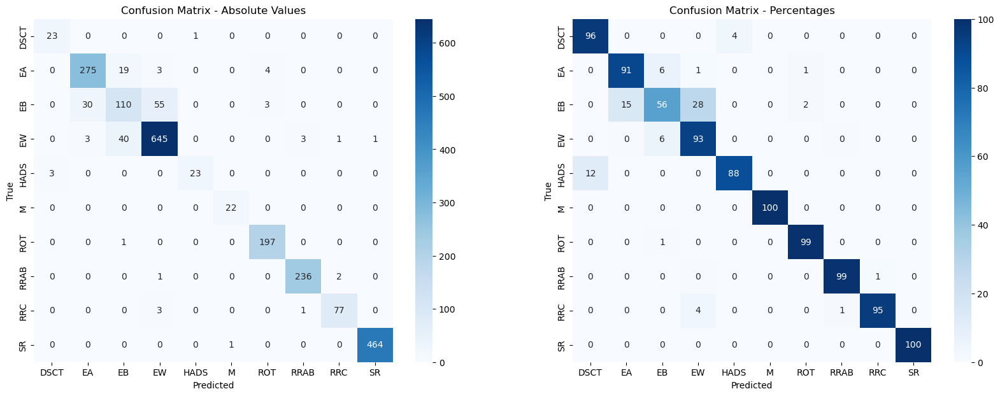

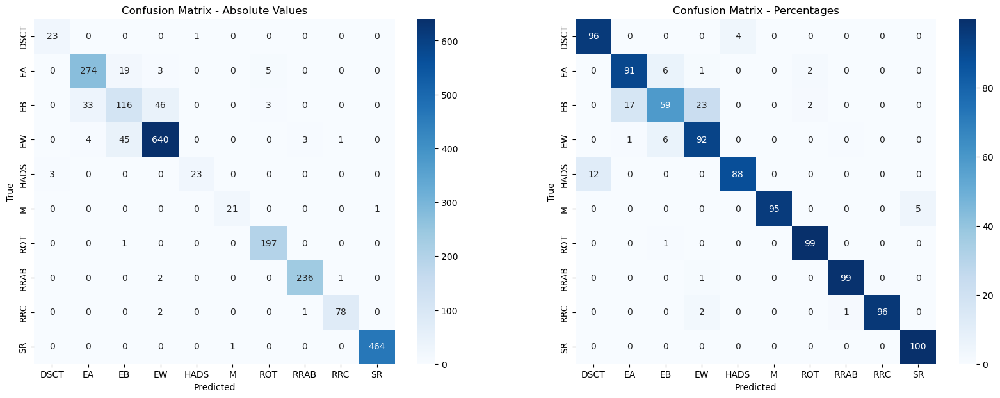

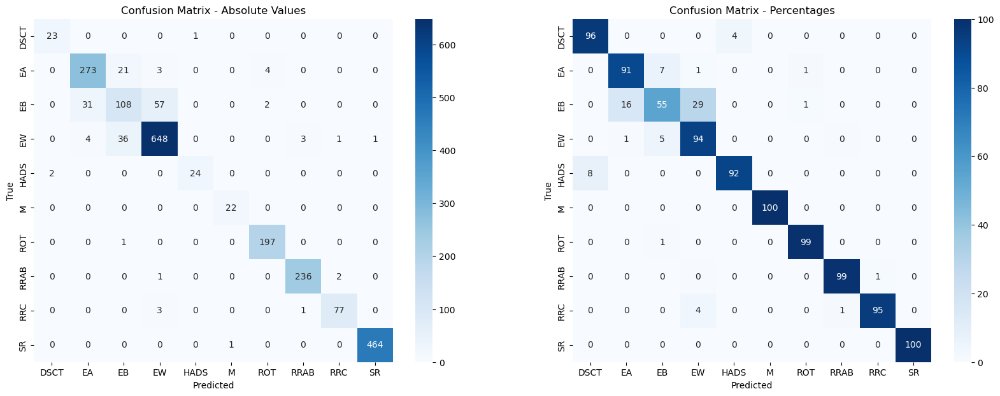

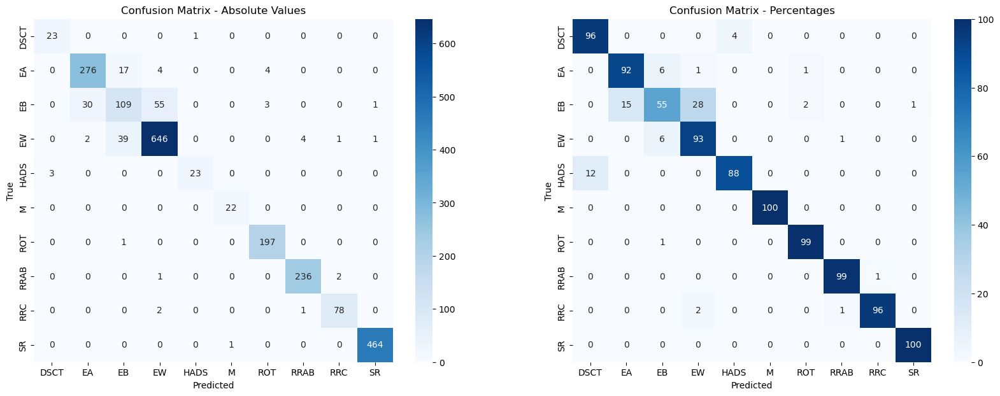

In [17]:
meta_clip_acc = []
meta_clip_runs = ['MeriDK/AstroCLIPResults/fv6by4nd', 'MeriDK/AstroCLIPResults/umgd6648', 'MeriDK/AstroCLIPResults/cdtfkqol', 
                  'MeriDK/AstroCLIPResults/06ihkowv', 'MeriDK/AstroCLIPResults/mjgck44s']
meta_clip_epochs = [42, 44, 31, 35, 32]

for i in range(5):
    acc = calc_results(meta_clip_runs[i], meta_clip_epochs[i])
    meta_clip_acc.append(acc)

100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:45<00:00,  9.05s/it]


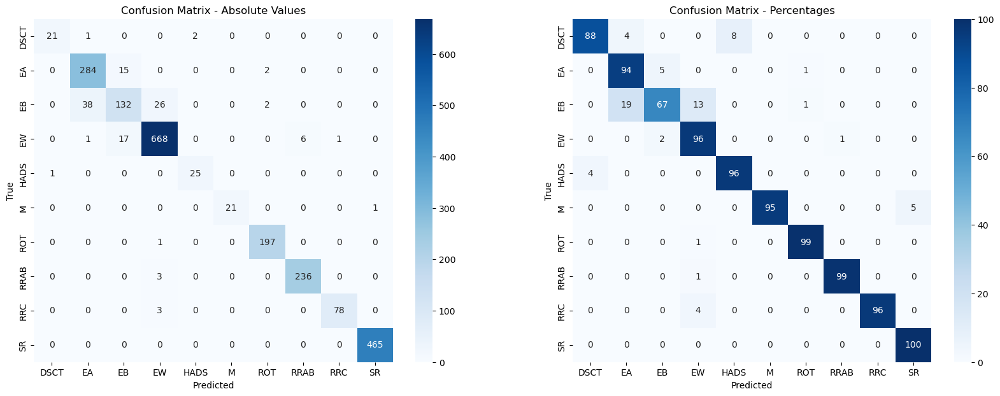

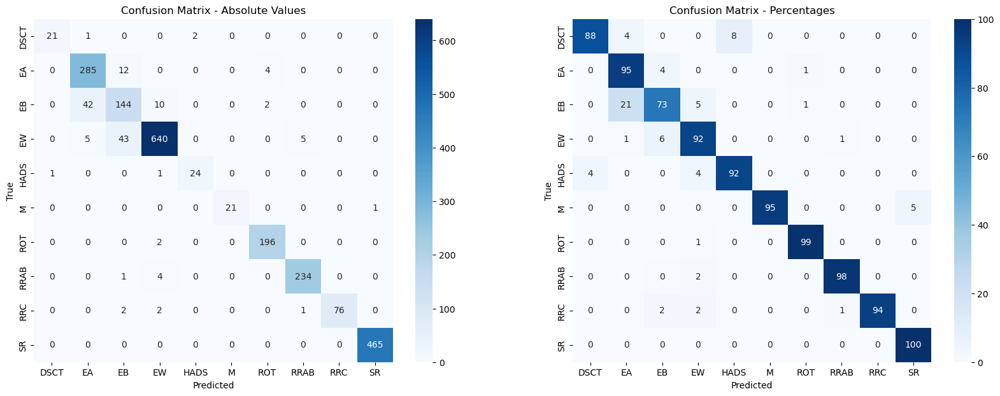

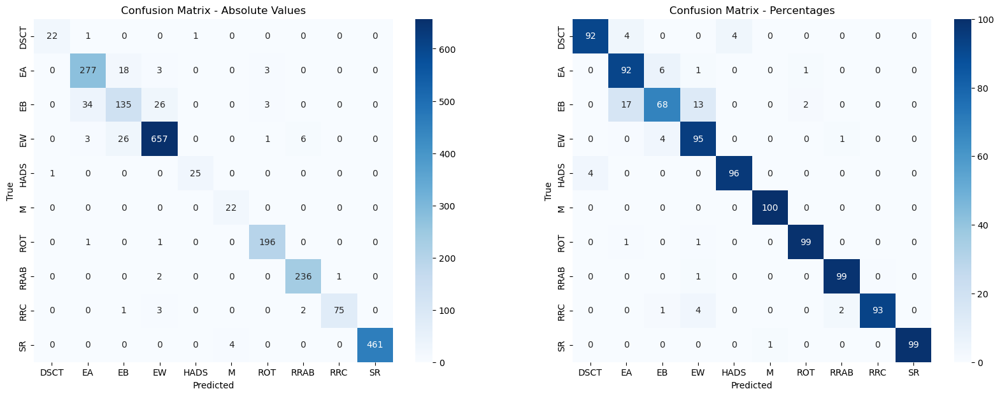

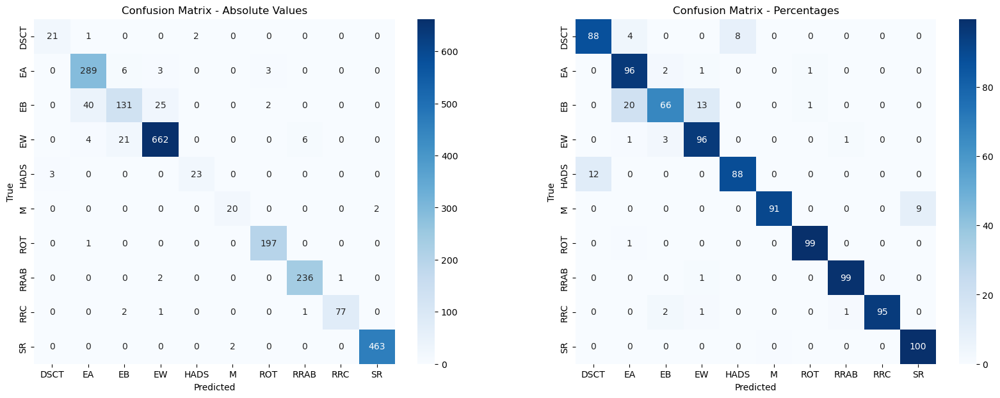

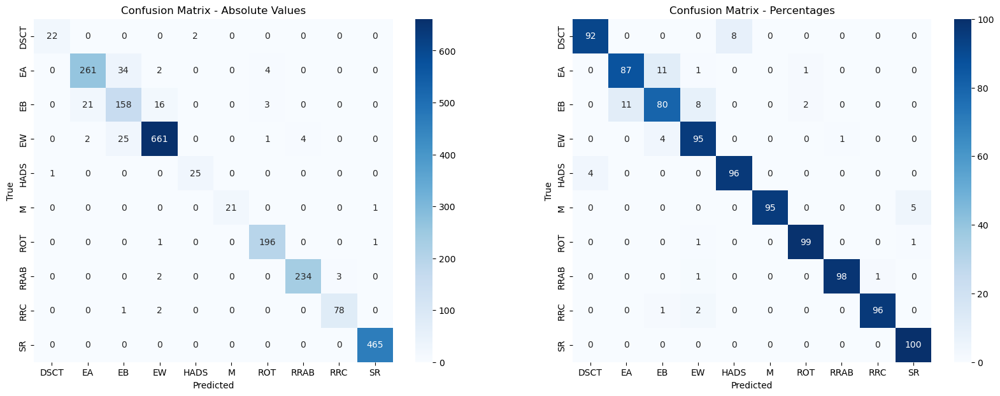

In [21]:
all_acc = []
all_runs = ['MeriDK/AstroCLIPOptuna/1am7szjj', 'MeriDK/AstroCLIPResults/rq53hehz', 'MeriDK/AstroCLIPResults/bfbjgh8h', 
            'MeriDK/AstroCLIPResults/xpwmenx1', 'MeriDK/AstroCLIPResults/2871uc9t']
all_epochs = [49, 39, 39, 23, 29]

for i in range(5):
    acc = calc_results(all_runs[i], all_epochs[i])
    all_acc.append(acc)

100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:43<00:00,  8.64s/it]


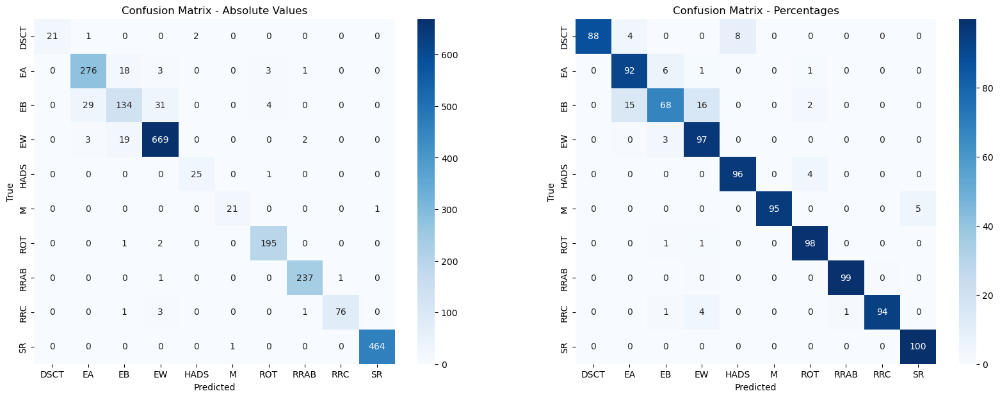

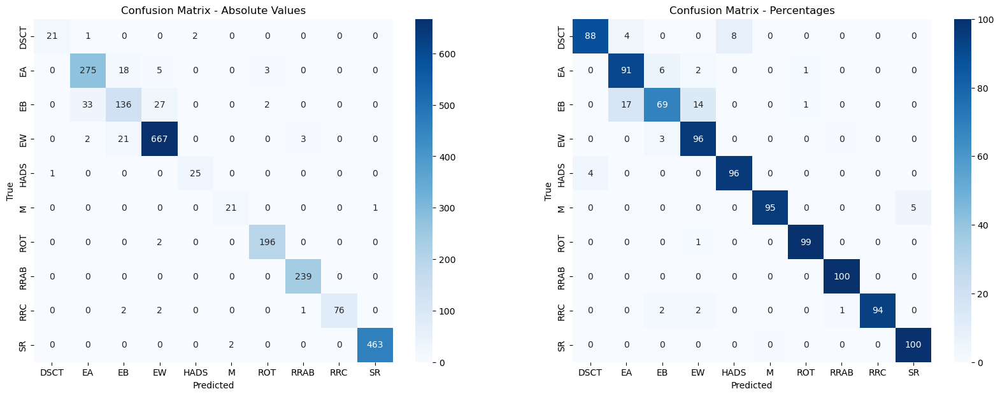

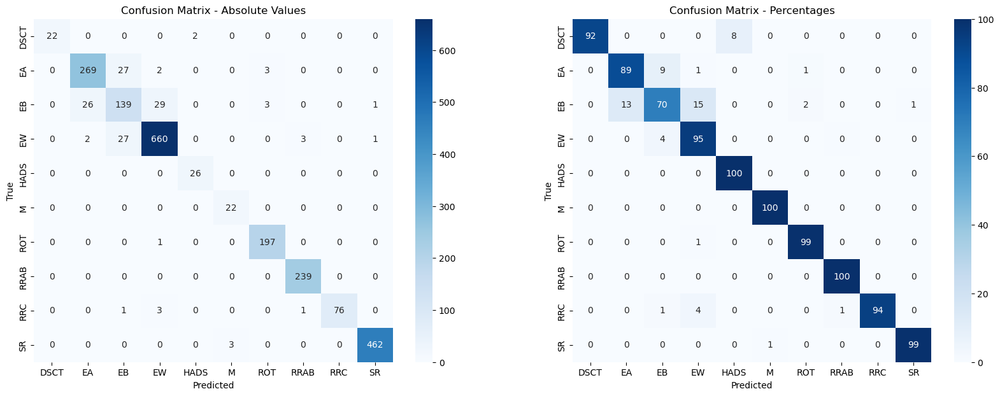

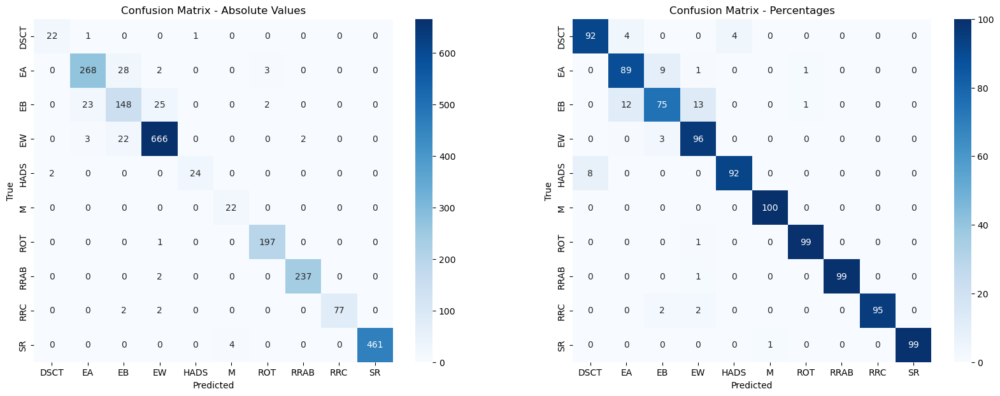

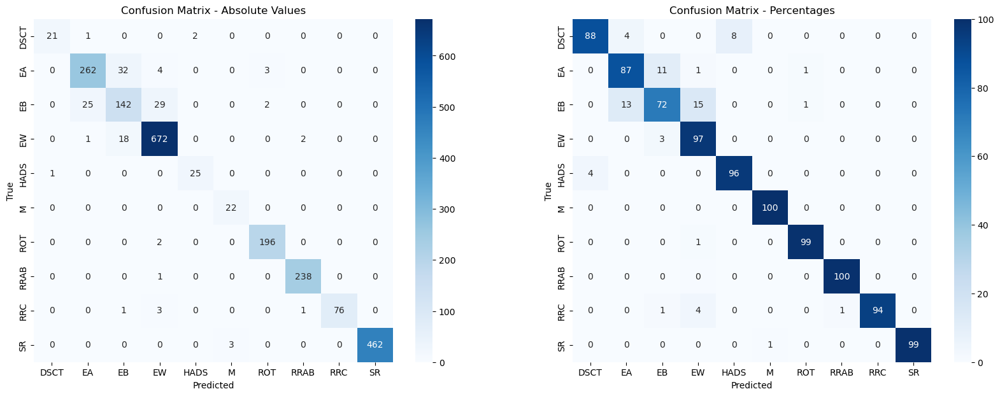

In [23]:
all_clip_acc = []
all_clip_runs = ['MeriDK/AstroCLIPResults/zgfcm56p', 'MeriDK/AstroCLIPResults/vwxd4rlq', 'MeriDK/AstroCLIPResults/i24q7zrb', 
                 'MeriDK/AstroCLIPResults/0ajdkoqd', 'MeriDK/AstroCLIPResults/wzx8g424']
all_clip_epochs = [37, 28, 36, 36, 33]

for i in range(5):
    acc = calc_results(all_clip_runs[i], all_clip_epochs[i])
    all_clip_acc.append(acc)

100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:44<00:00,  8.83s/it]


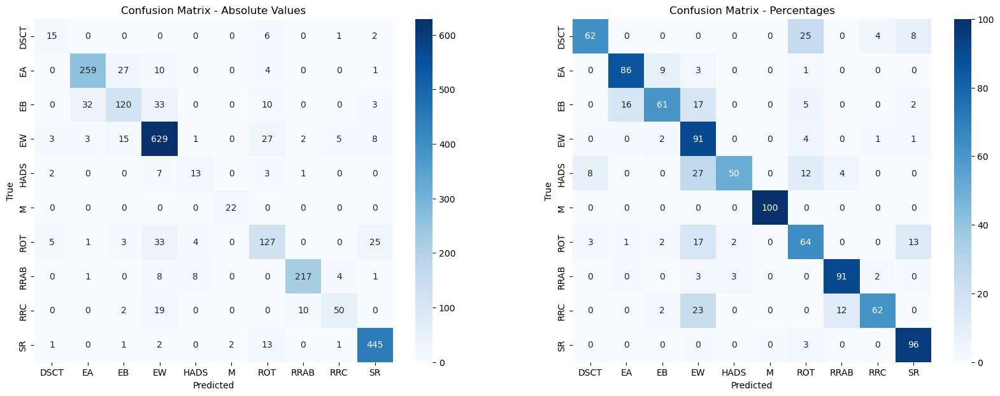

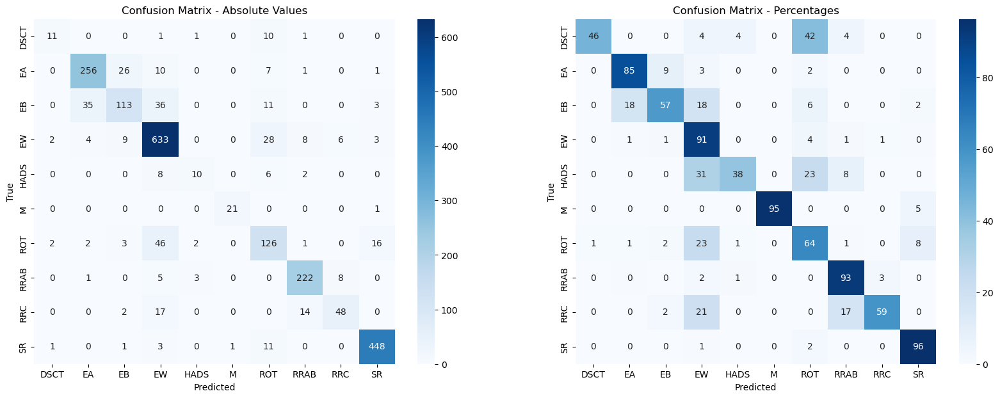

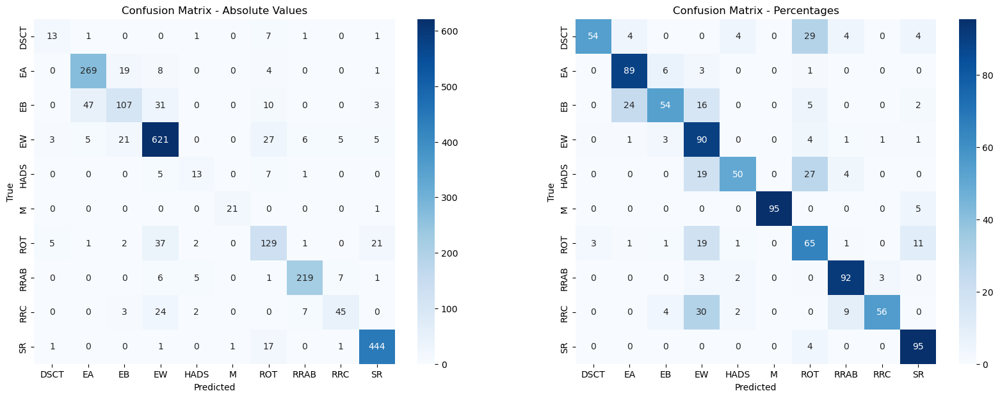

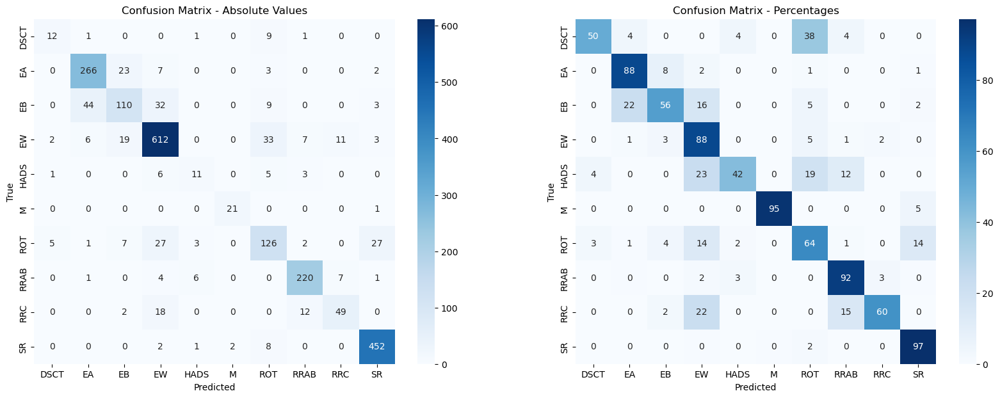

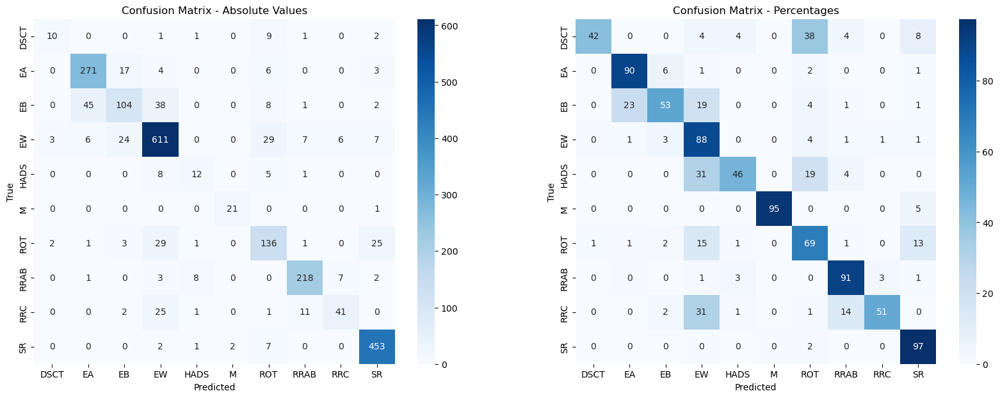

In [26]:
photo_acc = []
photo_runs = ['MeriDK/AstroCLIPResults/d2u52yml', 'MeriDK/AstroCLIPResults/6kq6ireo', 'MeriDK/AstroCLIPResults/0zaveq6a', 
              'MeriDK/AstroCLIPResults/smwud3km', 'MeriDK/AstroCLIPResults/w9fbwuoy']

for i in range(5):
    acc = calc_results(photo_runs[i], 'best')
    photo_acc.append(acc)

100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:44<00:00,  8.90s/it]


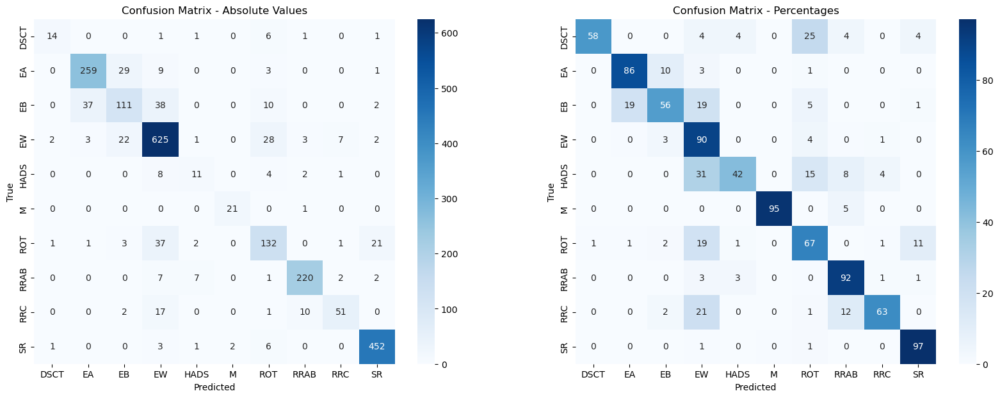

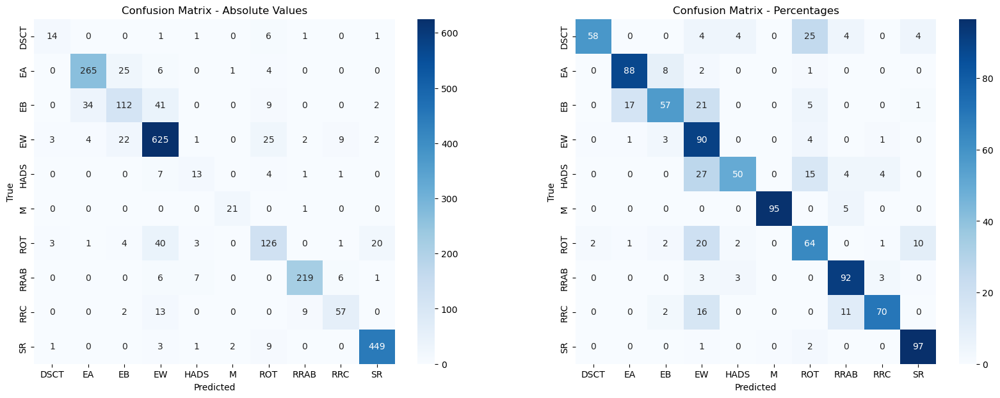

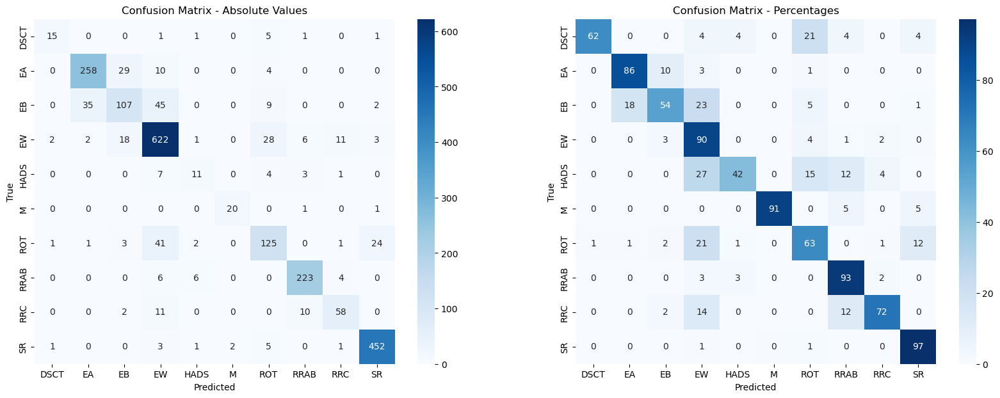

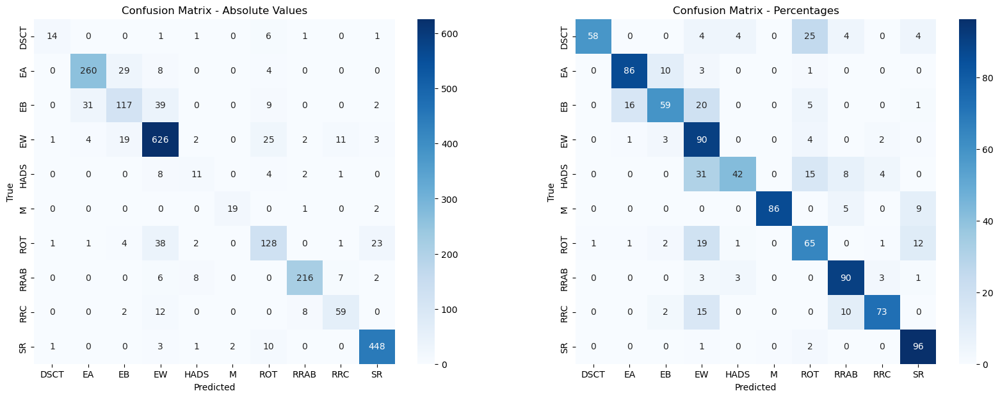

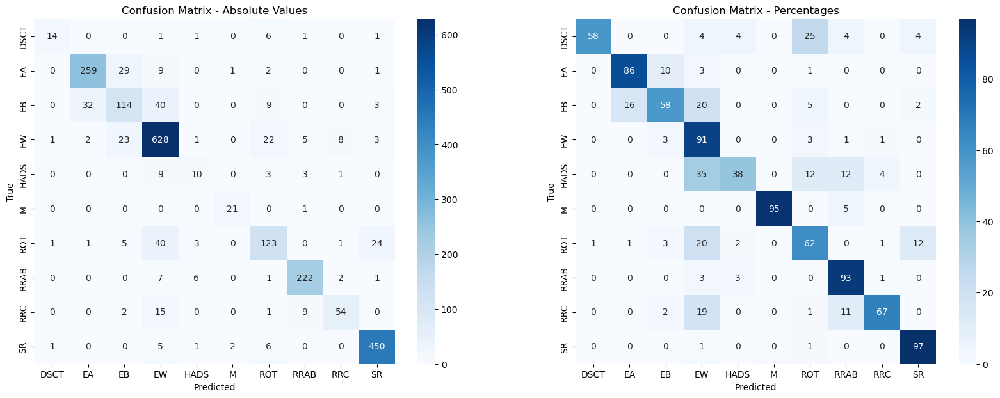

In [27]:
photo_clip_acc = []
photo_clip_runs = ['MeriDK/AstroCLIPResults/53zia0y3', 'MeriDK/AstroCLIPResults/q8inv1sy', 'MeriDK/AstroCLIPResults/13o1m464', 
                   'MeriDK/AstroCLIPResults/ckvz7sxk', 'MeriDK/AstroCLIPResults/5gt5i08j']

for i in range(5):
    acc = calc_results(photo_clip_runs[i], 'best')
    photo_clip_acc.append(acc)

In [28]:
np.mean(photo_acc), np.std(photo_acc)

(0.8386292834890966, 0.003253345239429834)

In [29]:
np.mean(photo_clip_acc), np.std(photo_clip_acc)

(0.8438807298620382, 0.0014733373704714566)

In [12]:
np.mean(spectra_acc), np.std(spectra_acc)

(0.7680462839341343, 0.005639175455792482)

In [14]:
np.mean(spectra_clip_acc), np.std(spectra_clip_acc)

(0.7785491766800178, 0.0019214092696860639)

In [16]:
np.mean(meta_acc), np.std(meta_acc)

(0.9196261682242991, 0.00409434801958164)

In [18]:
np.mean(meta_clip_acc), np.std(meta_clip_acc)

(0.9226524254561639, 0.0007120605251446366)

In [22]:
np.mean(all_acc), np.std(all_acc)

(0.9416110369381399, 0.003748898920988453)

In [24]:
np.mean(all_clip_acc), np.std(all_clip_acc)

(0.9423230974632844, 0.0014787047375021027)

In [47]:
mean_acc = [np.mean(spectra_acc), np.mean(spectra_clip_acc), np.mean(photo_acc), np.mean(photo_clip_acc),
            np.mean(meta_acc), np.mean(meta_clip_acc), np.mean(all_acc), np.mean(all_clip_acc)]
std_acc = [np.std(spectra_acc), np.std(spectra_clip_acc), np.std(photo_acc), np.std(photo_clip_acc),
            np.std(meta_acc), np.std(meta_clip_acc), np.std(all_acc), np.std(all_clip_acc)]
mean_acc = [el * 100 for el in mean_acc]
std_acc = [el * 100 for el in std_acc]

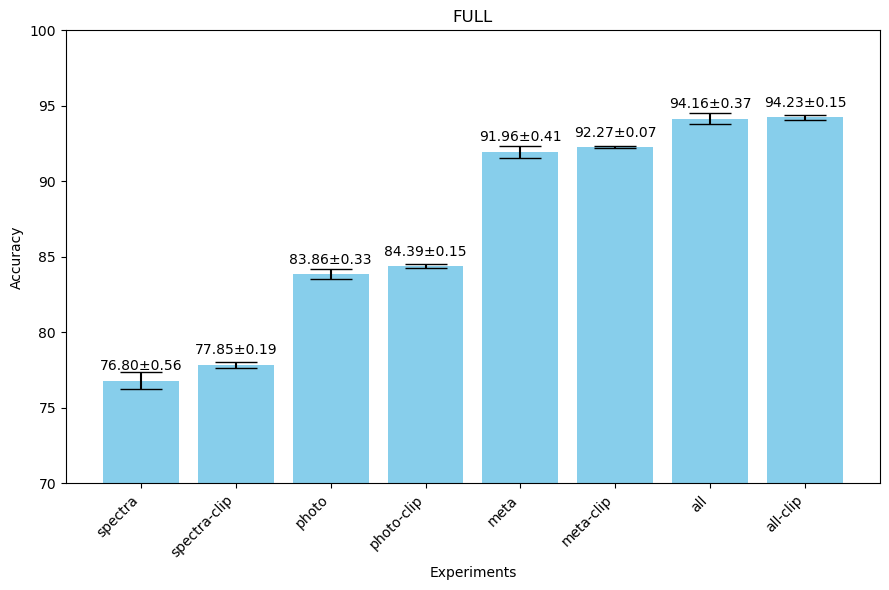

In [65]:
fig, ax = plt.subplots(figsize=(9, 6))
bars = ax.bar(['spectra', 'spectra-clip', 'photo', 'photo-clip', 'meta', 'meta-clip', 'all', 'all-clip'], 
               mean_acc, yerr=std_acc, capsize=15, color='skyblue')

ax.set_xlabel('Experiments')
ax.set_ylabel('Accuracy')
ax.set_title('FULL')
ax.set_ylim(70, 100)

plt.xticks(rotation=45, ha='right')

for bar, mean, std in zip(bars, mean_acc, std_acc):
    yval = bar.get_height()
    ax.text(bar.get_x() + bar.get_width() / 2, yval + 0.5, f'{mean:.2f}±{std:.2f}', ha='center', va='bottom')

plt.tight_layout()
plt.show()

# SUB50

In [68]:
spectra_runs = ['vs7cjdtf', 'g7pf9ggw', 'ujcp8ess', 'jxyzrqvz', '6eeo04zi']
spectra_clip_runs = ['ofn5m178', 'm73a1n2e', 'fwsso30b', 'j3023kzg', 'fdxw40wq']

100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:14<00:00,  4.76s/it]


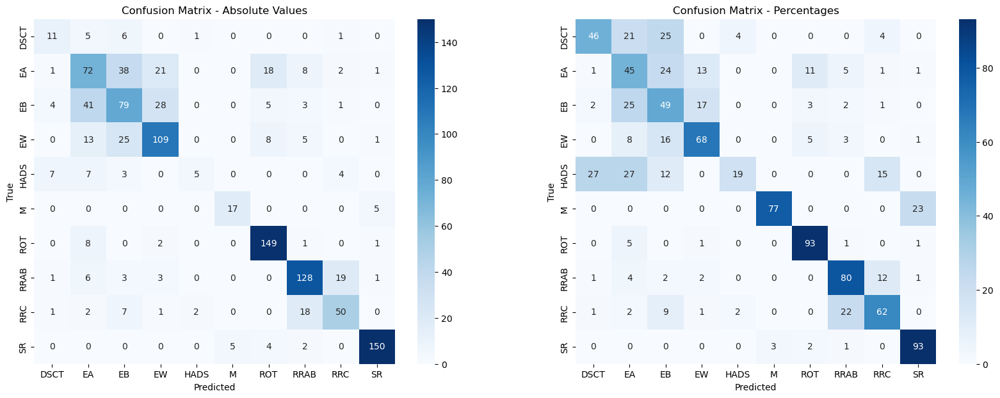

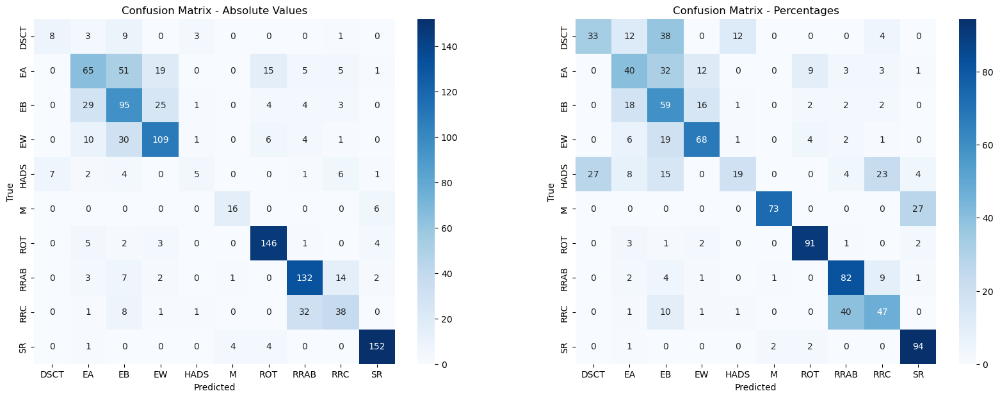

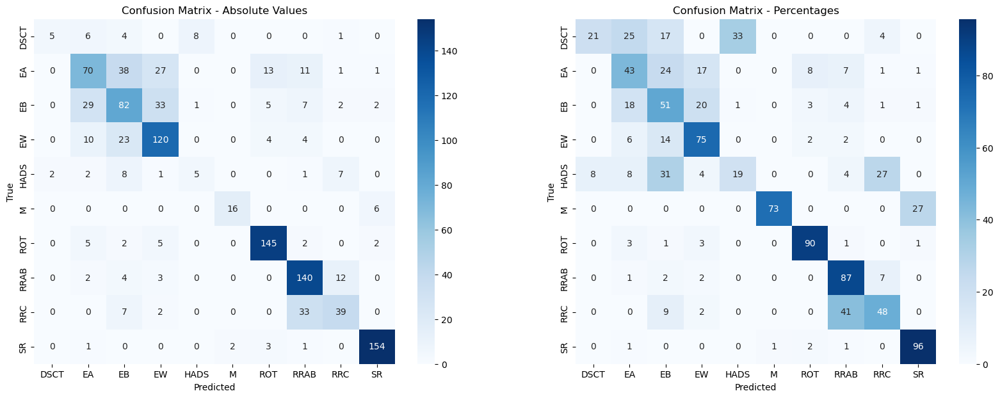

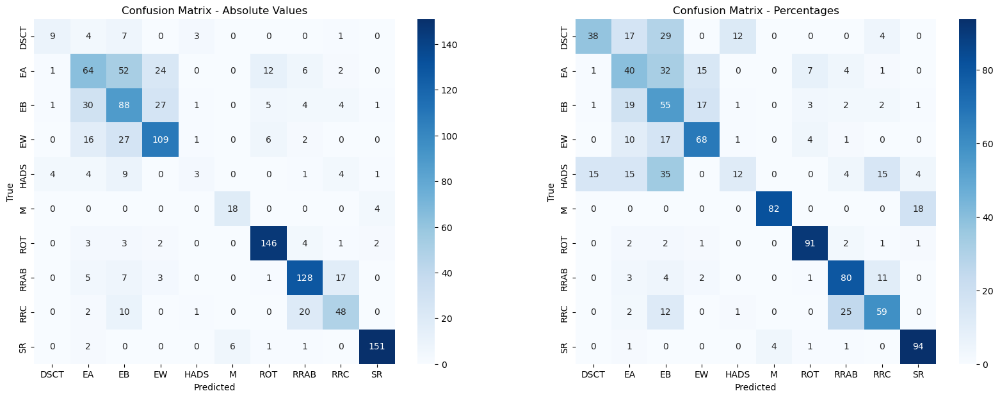

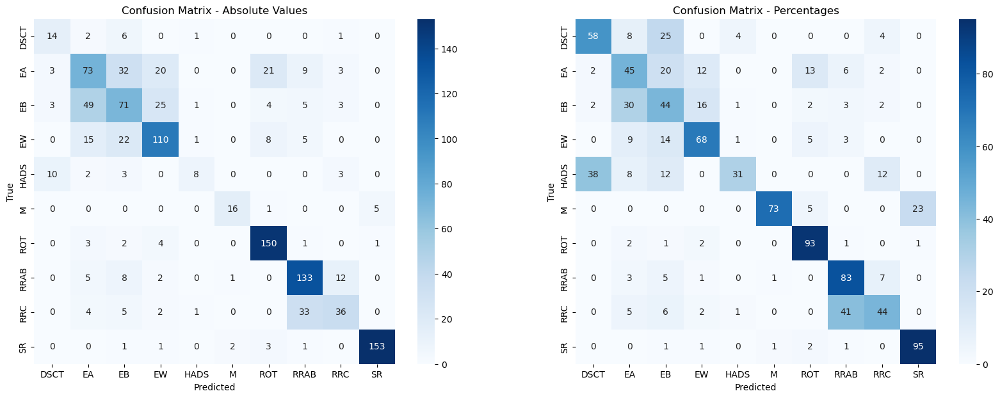

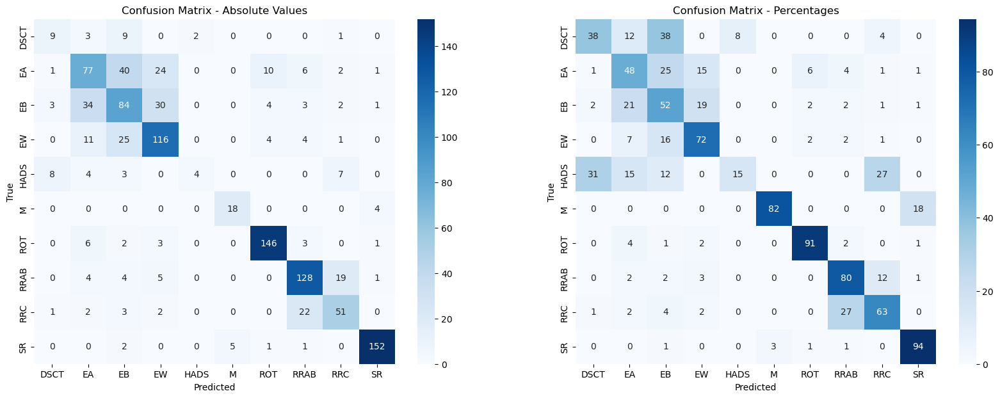

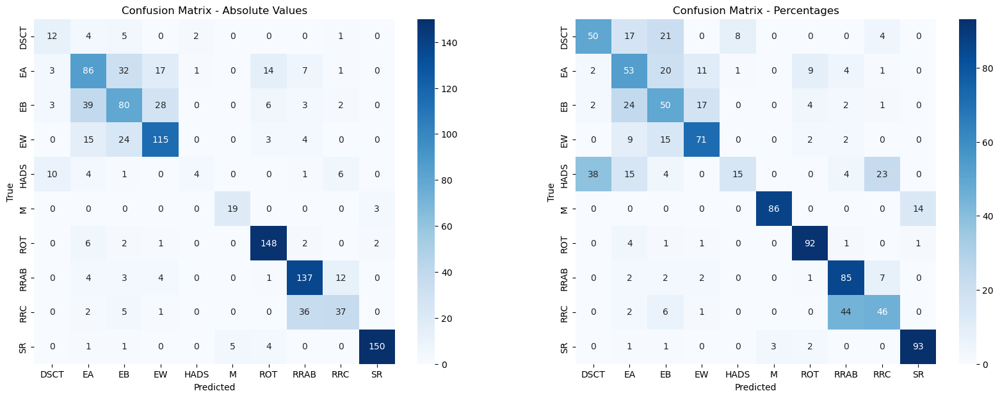

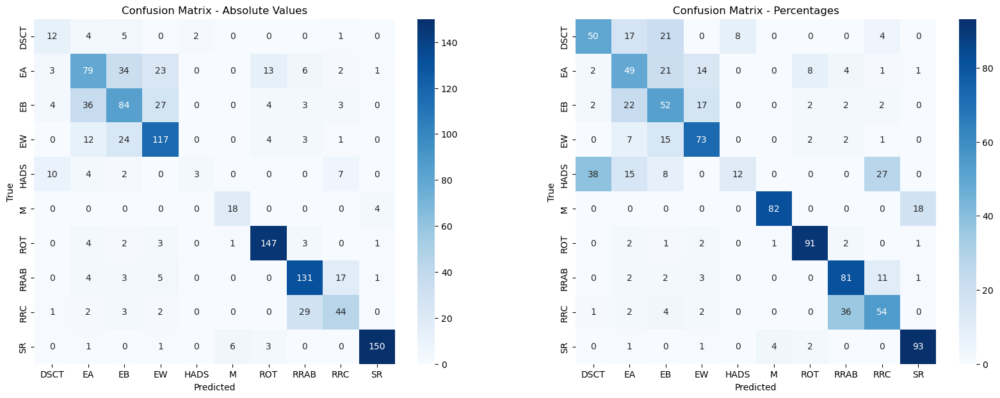

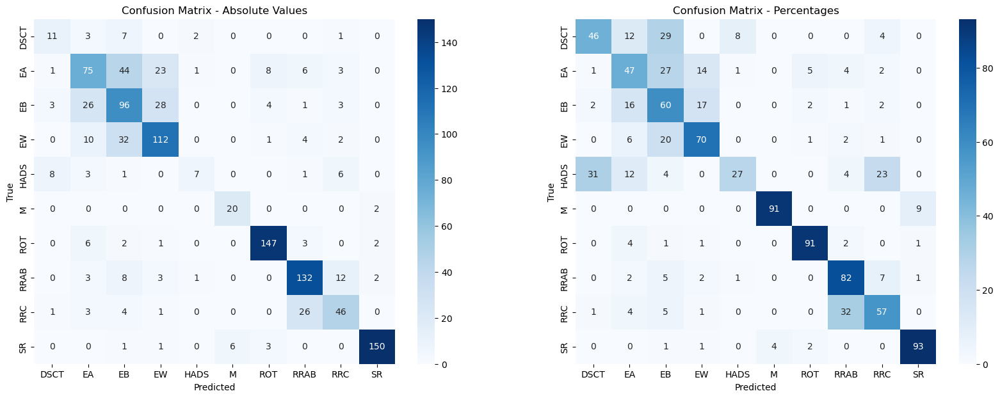

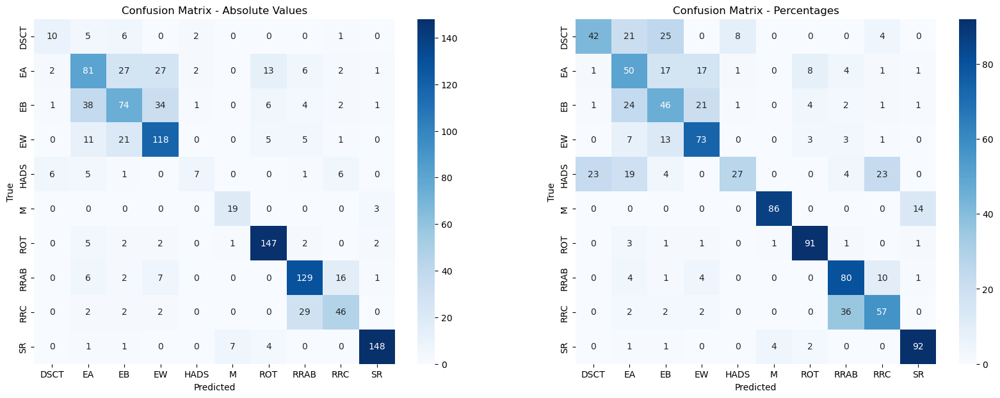

In [70]:
sub50_spectra_acc = []
sub50_spectra_clip_acc = []

for i in range(5):
    acc = calc_results('MeriDK/AstroCLIPResults/' + spectra_runs[i], 'best')
    sub50_spectra_acc.append(acc)

for i in range(5):
    acc = calc_results('MeriDK/AstroCLIPResults/' + spectra_clip_runs[i], 'best')
    sub50_spectra_clip_acc.append(acc)

100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:13<00:00,  4.58s/it]


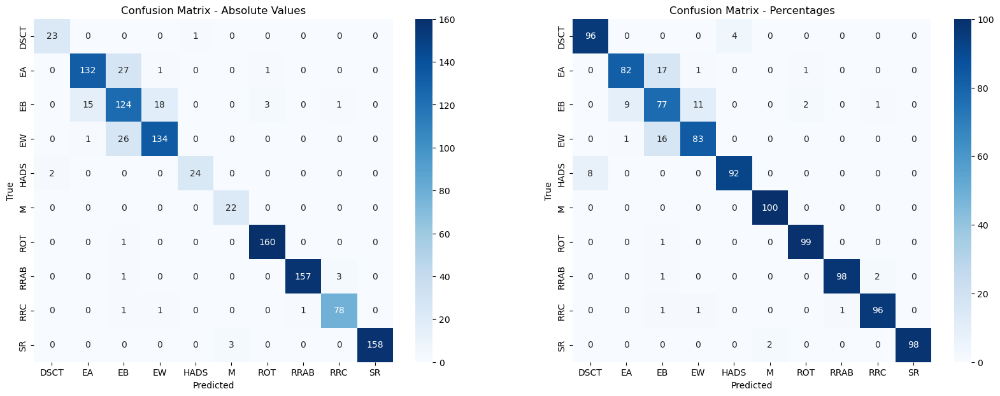

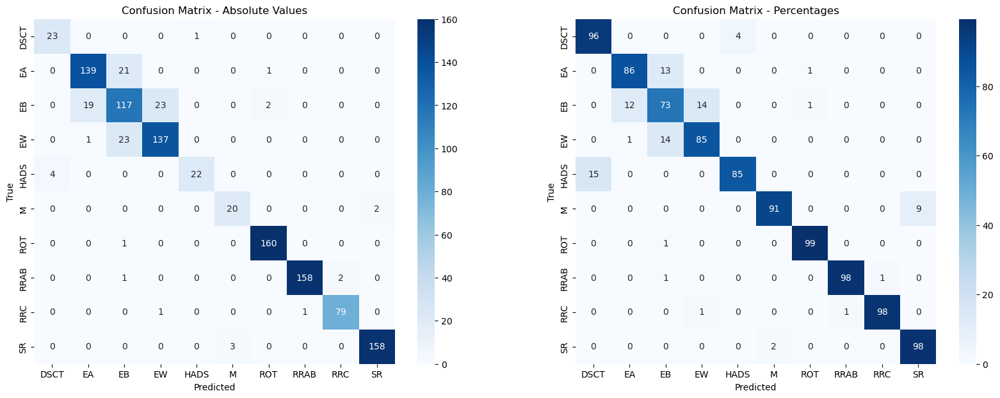

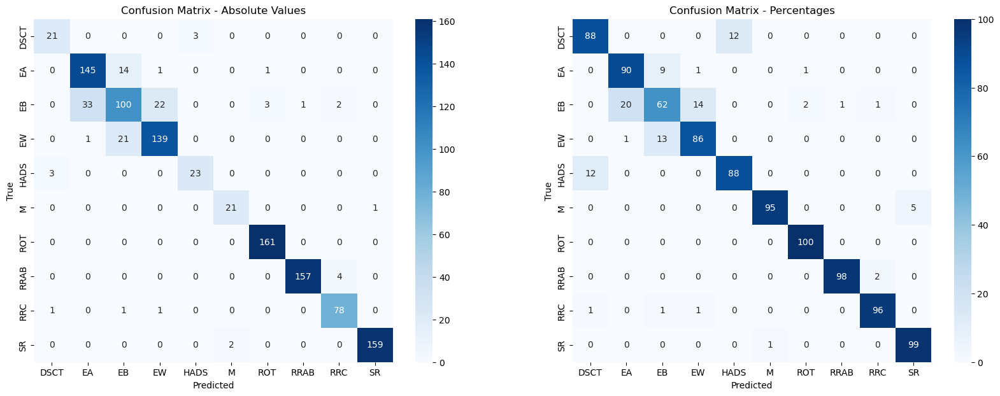

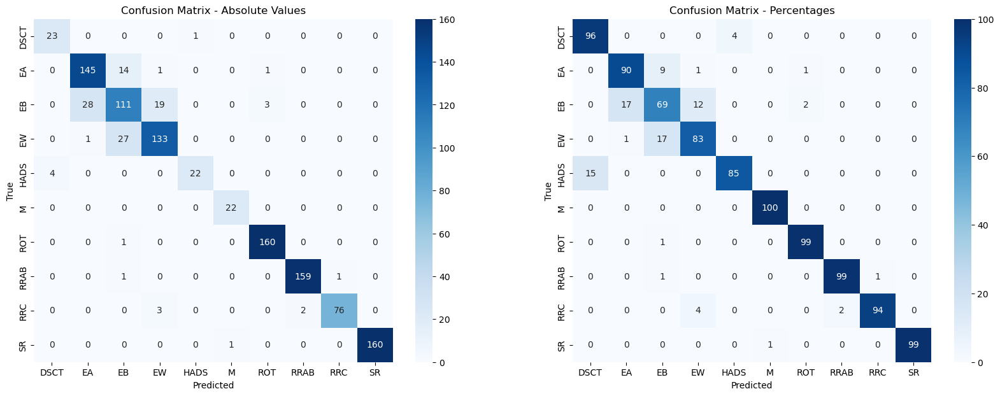

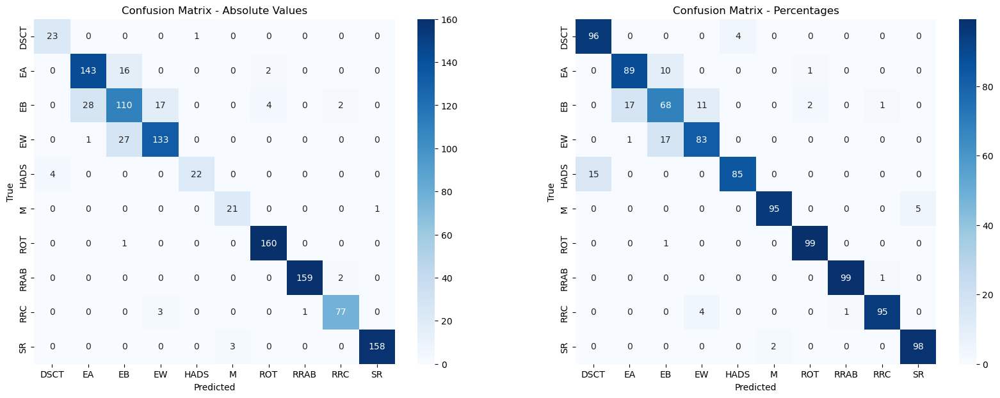

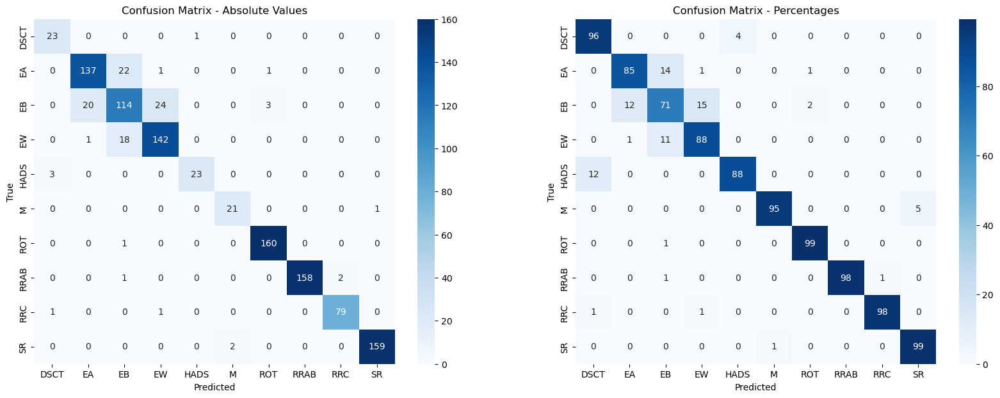

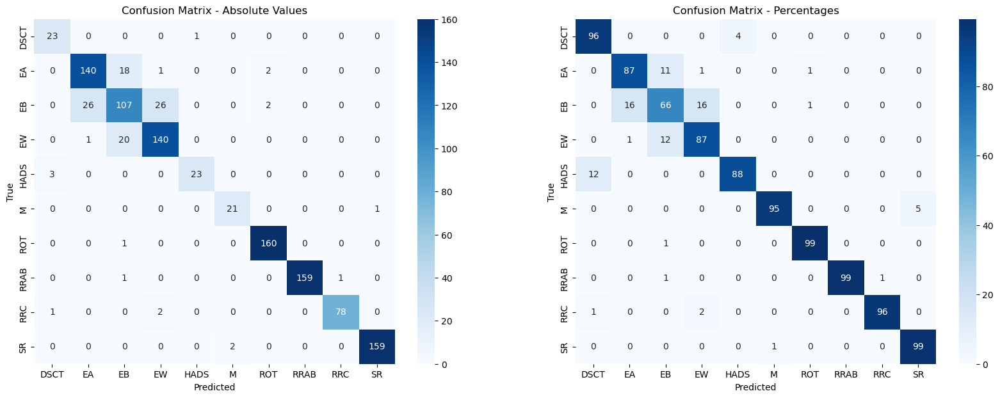

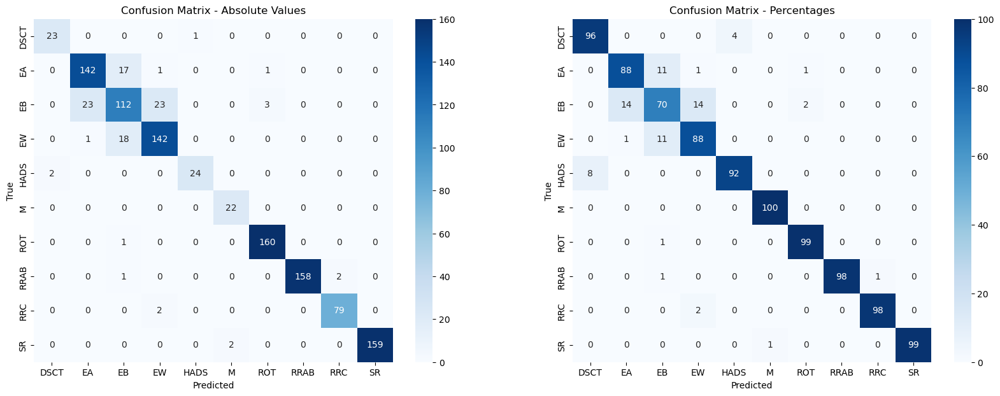

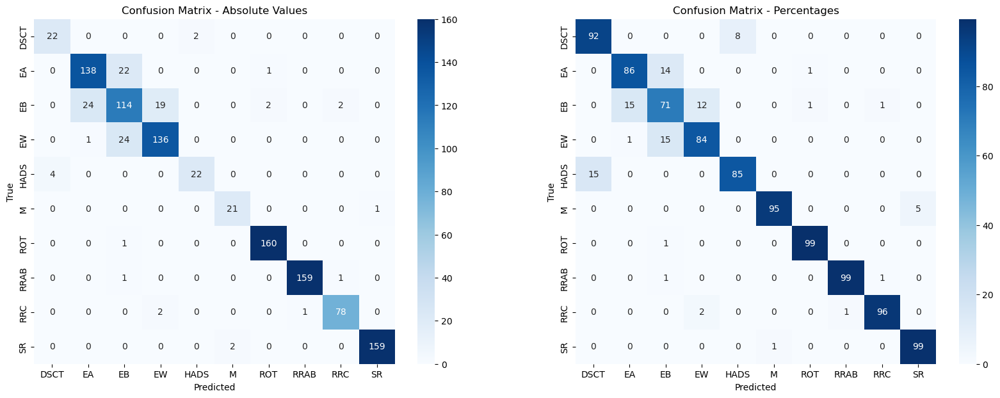

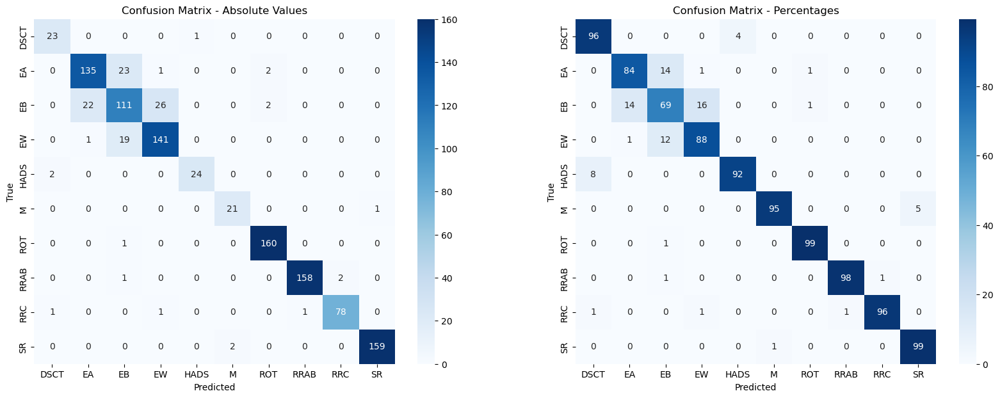

In [71]:
meta_runs = ['8yyilf9d', 'ivbqj878', 'qk0vzth3', 'mbip526c', 'i53y3p1j']
meta_clip_runs = ['pa3plux1', '2cma70vu', 'hq4n6ivb', 'jfumqm7a', '9wmfwsf0']

sub50_meta_acc = []
sub50_meta_clip_acc = []

for i in range(5):
    acc = calc_results('MeriDK/AstroCLIPResults/' + meta_runs[i], 'best')
    sub50_meta_acc.append(acc)

for i in range(5):
    acc = calc_results('MeriDK/AstroCLIPResults/' + meta_clip_runs[i], 'best')
    sub50_meta_clip_acc.append(acc)

100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:15<00:00,  5.06s/it]


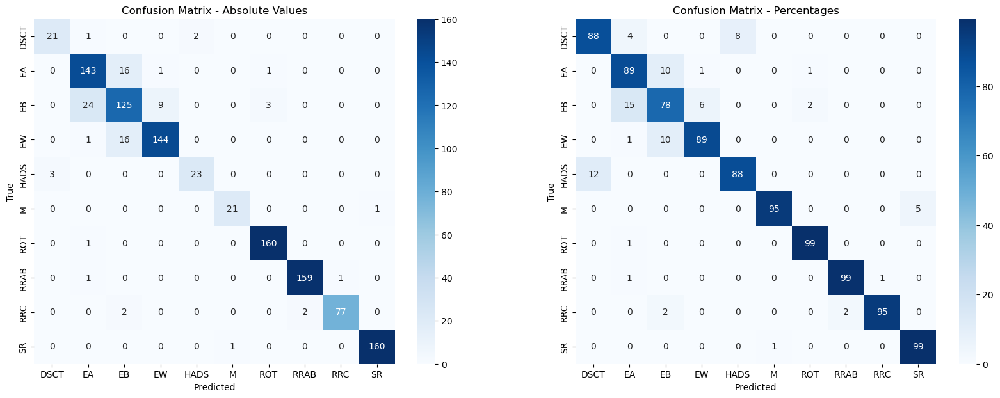

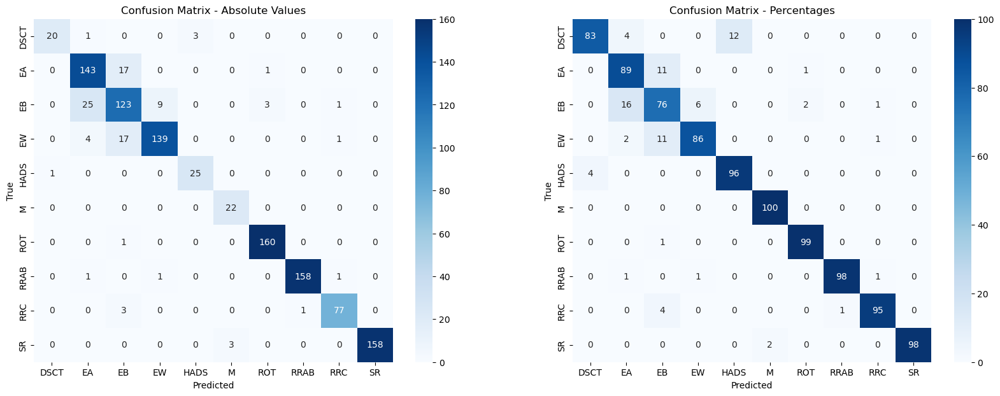

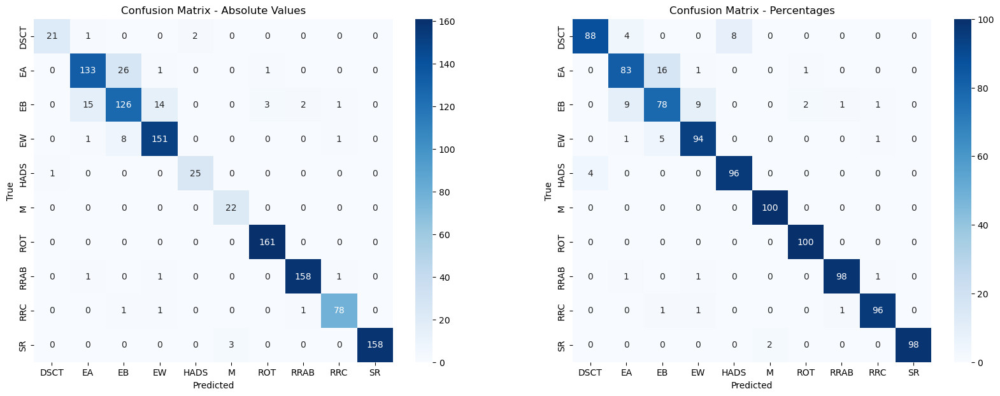

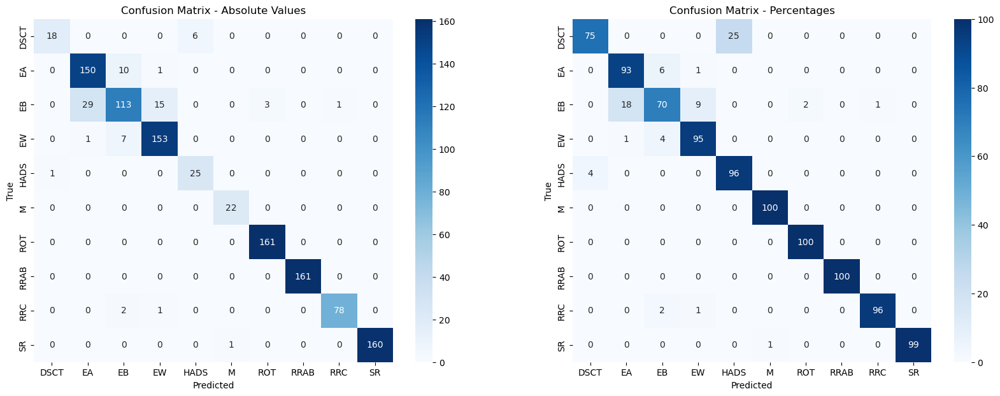

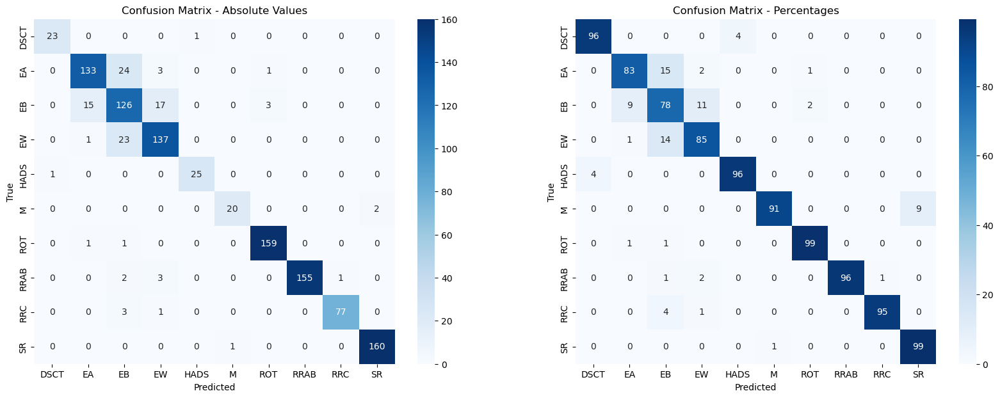

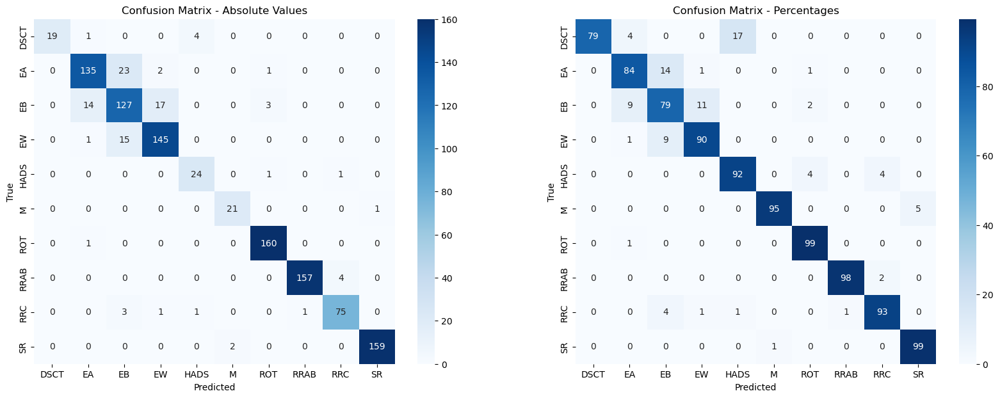

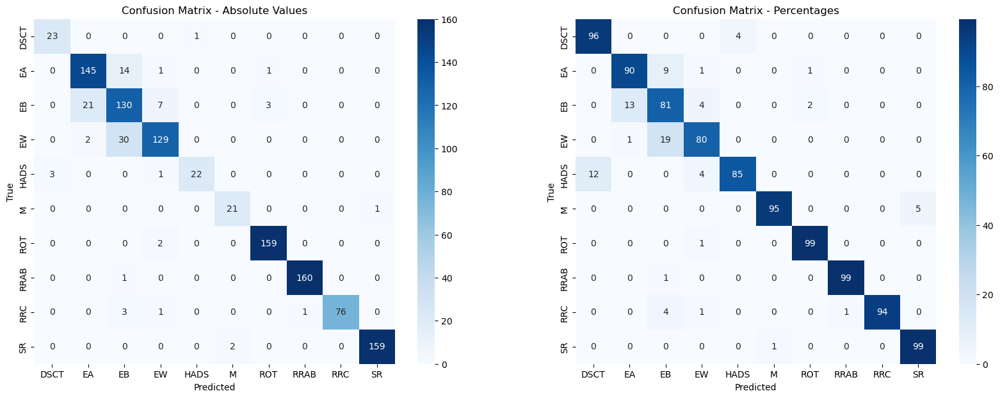

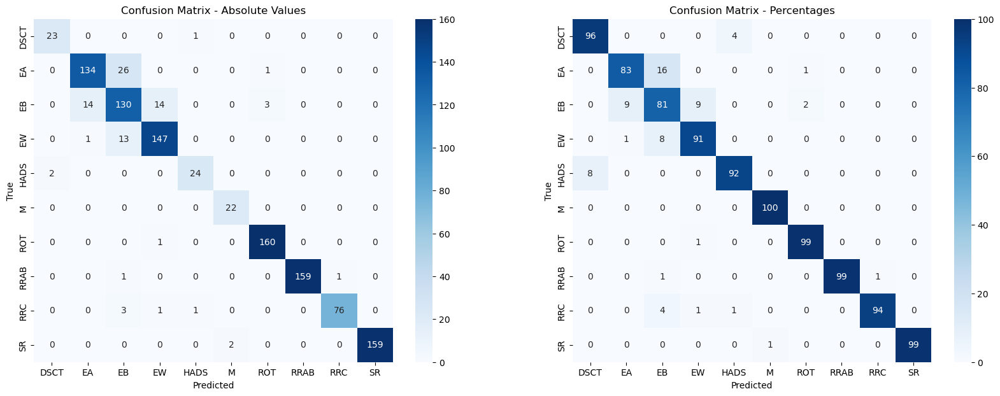

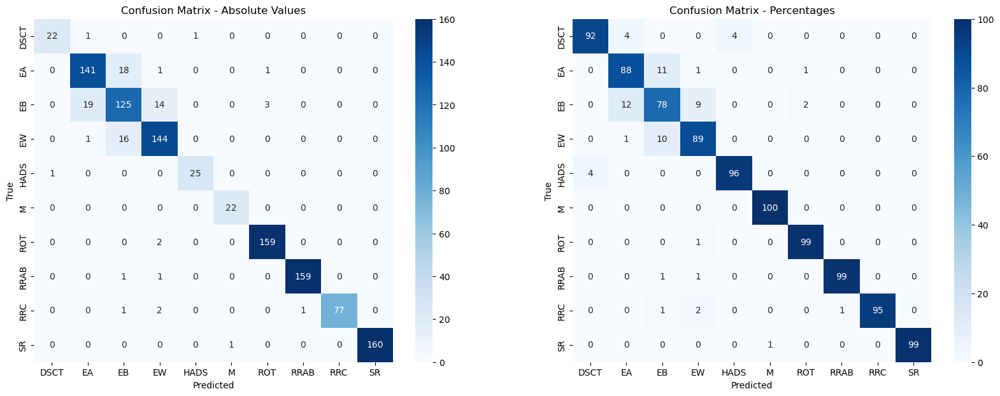

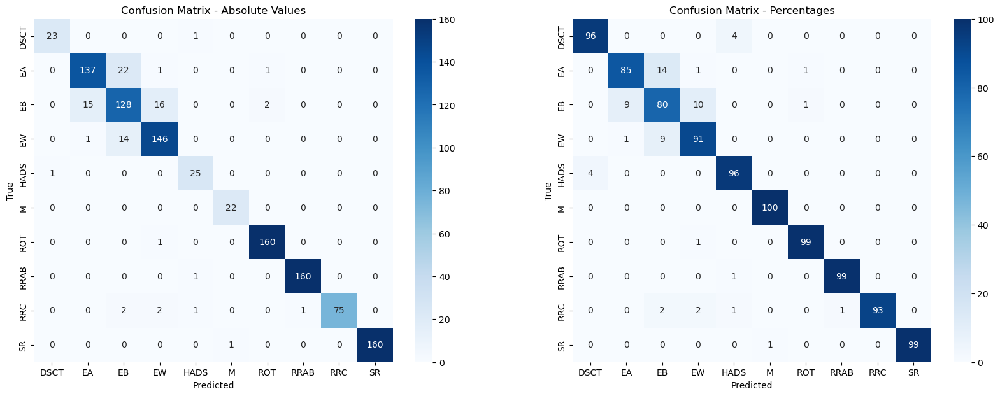

In [72]:
all_runs = ['mij7peij', 'nlvtlcrh', 'ofns7l1a', 'de8xb4l3', 'p7o9s9r7']
all_clip_runs = ['cobdhhxt', '2oaalk6g', 'y73wwcio', '4zucn3cg', 'ruj87rhl']

sub50_all_acc = []
sub50_all_clip_acc = []

for i in range(5):
    acc = calc_results('MeriDK/AstroCLIPResults/' + all_runs[i], 'best')
    sub50_all_acc.append(acc)

for i in range(5):
    acc = calc_results('MeriDK/AstroCLIPResults/' + all_clip_runs[i], 'best')
    sub50_all_clip_acc.append(acc)

In [73]:
np.mean(sub50_spectra_acc), np.std(sub50_spectra_acc)

(0.6863270777479892, 0.004075694102231052)

In [74]:
np.mean(sub50_spectra_clip_acc), np.std(sub50_spectra_clip_acc)

(0.7029490616621985, 0.004946685434530124)

In [75]:
np.mean(sub50_meta_acc), np.std(sub50_meta_acc)

(0.9018766756032172, 0.0031671215633010522)

In [76]:
np.mean(sub50_meta_clip_acc), np.std(sub50_meta_clip_acc)

(0.9054512957998213, 0.0041301948197645525)

In [77]:
np.mean(sub50_all_acc), np.std(sub50_all_acc)

(0.9199285075960679, 0.007864164432529037)

In [78]:
np.mean(sub50_all_clip_acc), np.std(sub50_all_clip_acc)

(0.9204647006255586, 0.005180116799352796)

# SUB25

100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:06<00:00,  3.49s/it]


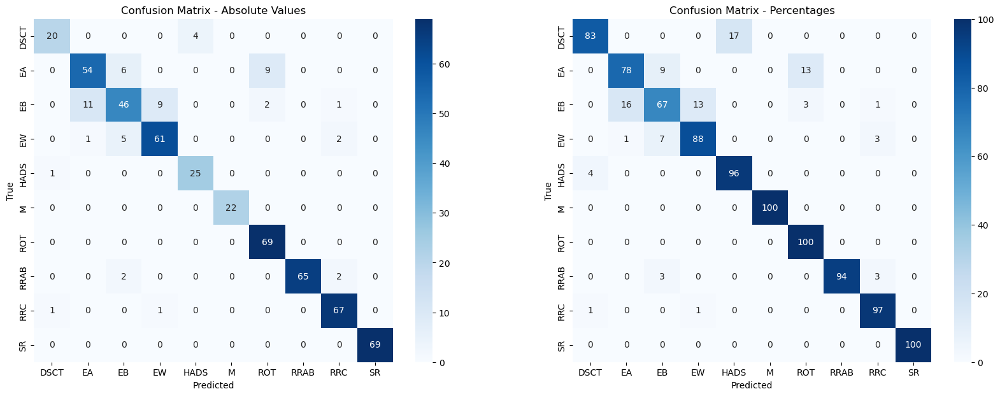

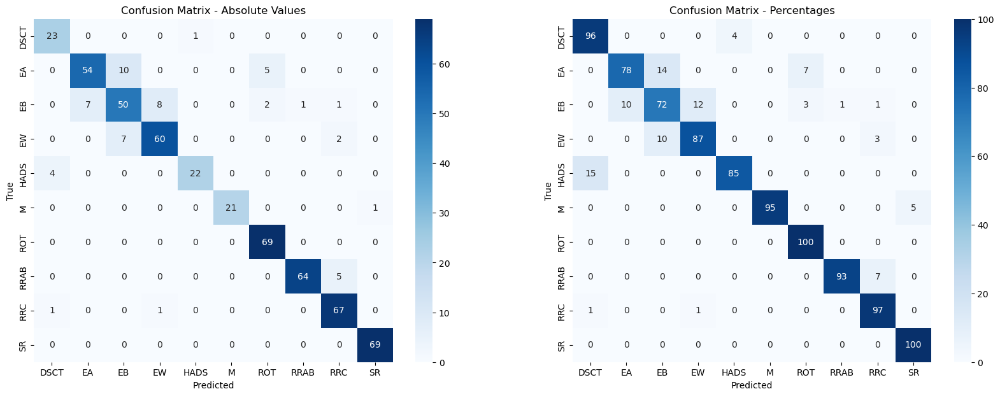

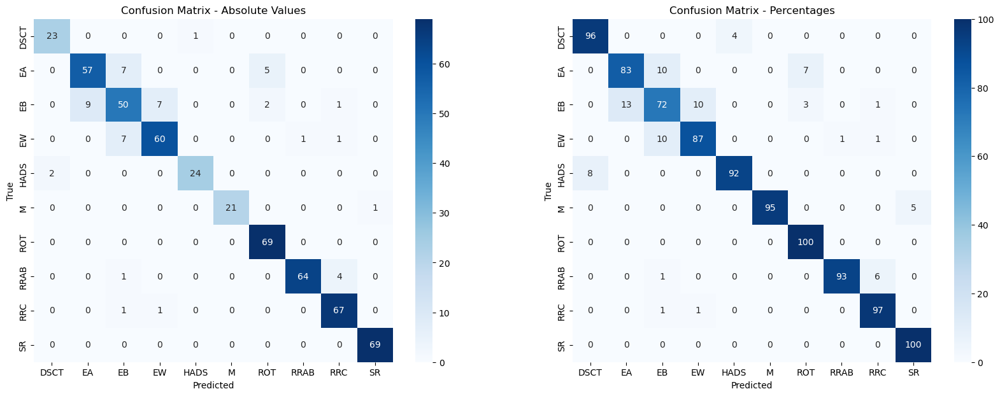

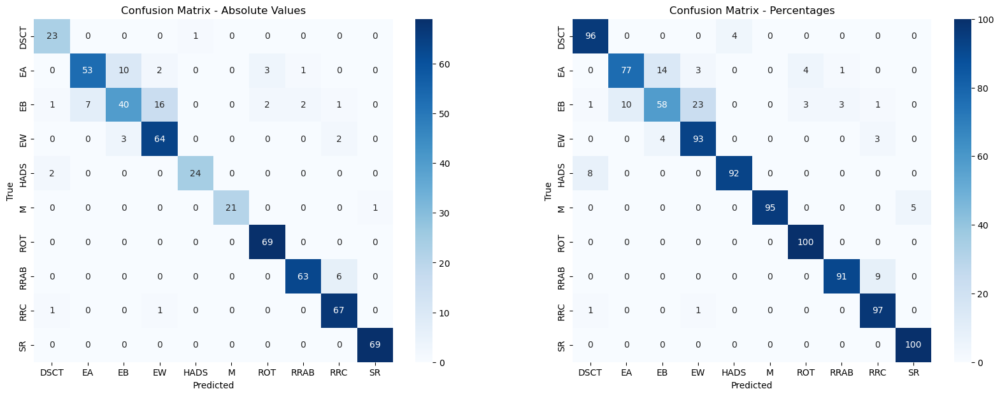

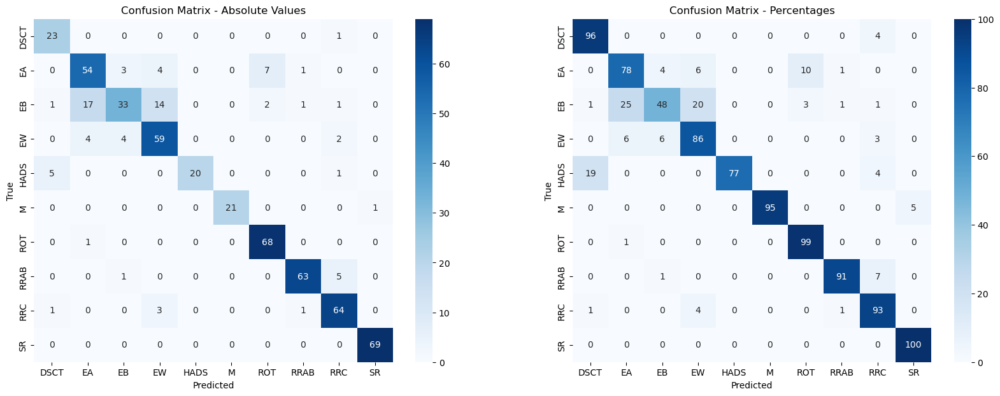

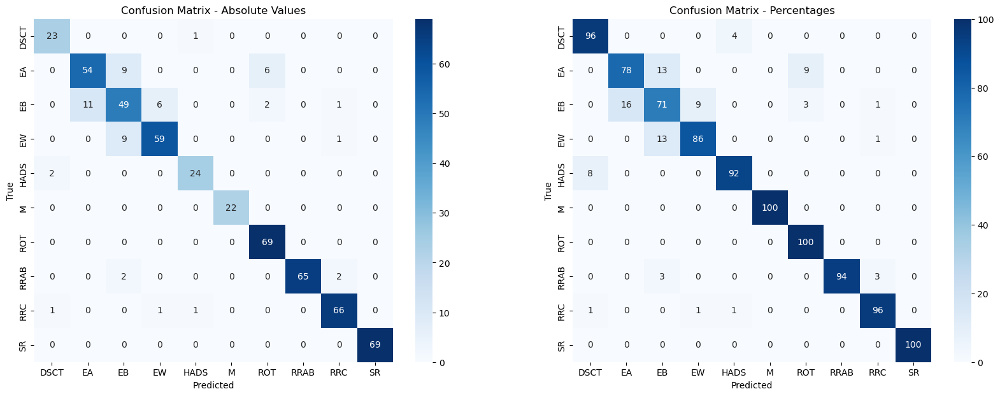

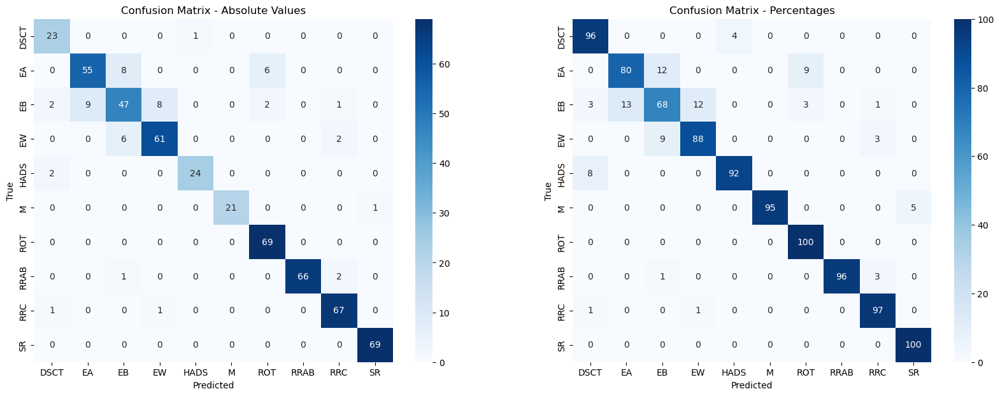

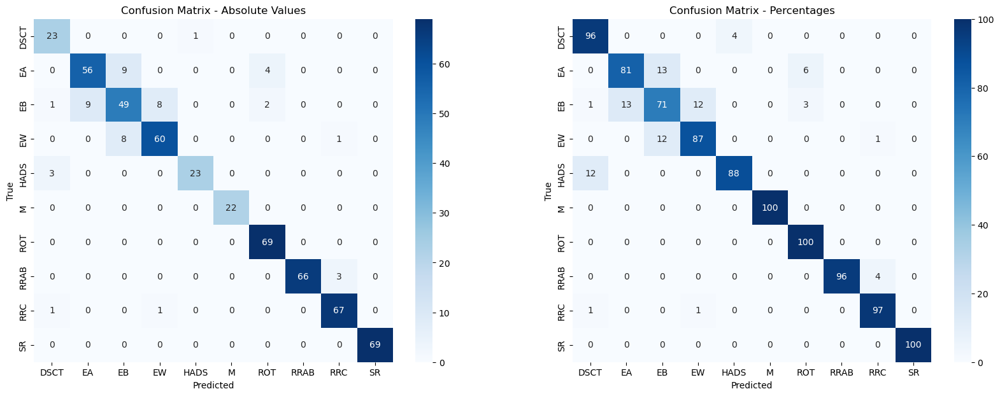

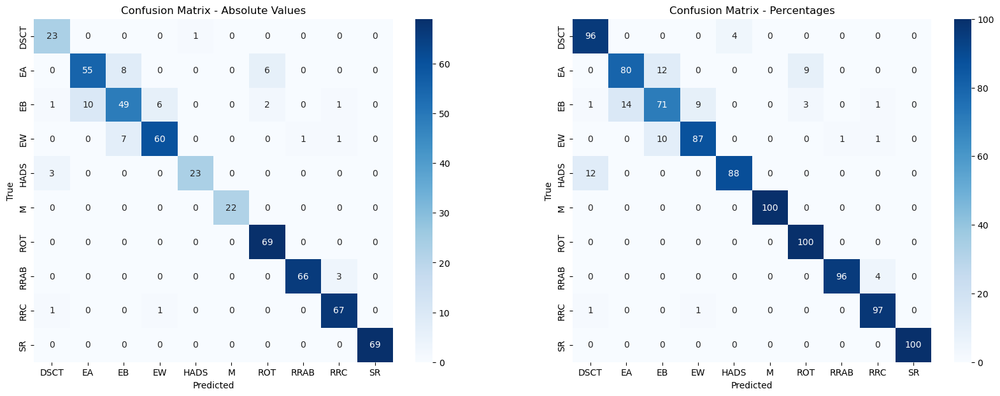

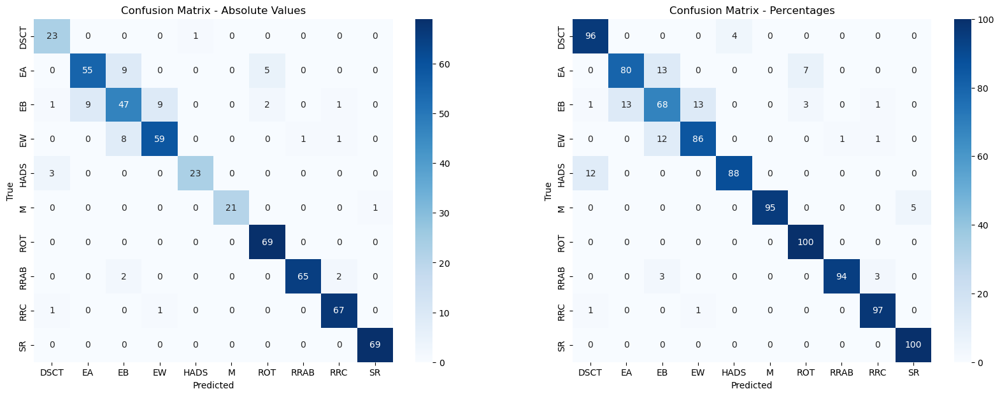

In [79]:
meta_runs = ['4558s3fu', 'tww92rn4', 'p8py0fnm', 'jblgk4yv', 'iwu6xzh6']
meta_clip_runs = ['7w0n8zip', 'epbd4guk', '6gd3w9jp', '4skte5nb', 'idcek48t']

sub25_meta_acc = []
sub25_meta_clip_acc = []

for i in range(5):
    acc = calc_results('MeriDK/AstroCLIPResults/' + meta_runs[i], 'best')
    sub25_meta_acc.append(acc)

for i in range(5):
    acc = calc_results('MeriDK/AstroCLIPResults/' + meta_clip_runs[i], 'best')
    sub25_meta_clip_acc.append(acc)

100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:07<00:00,  3.53s/it]


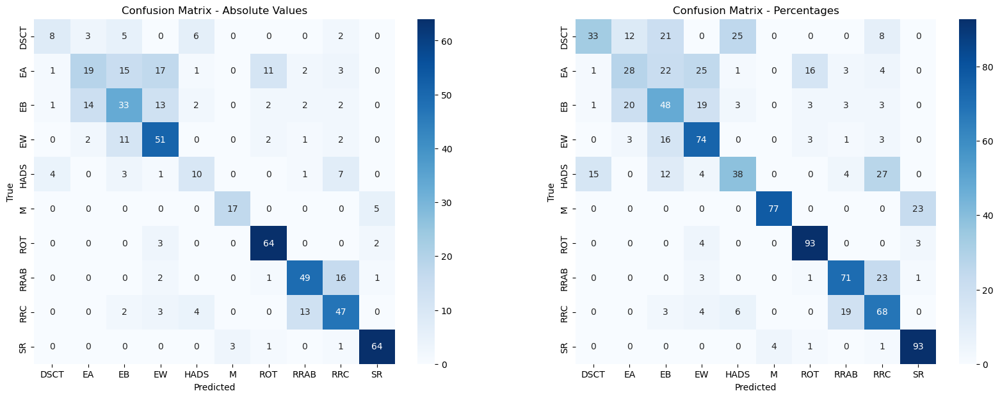

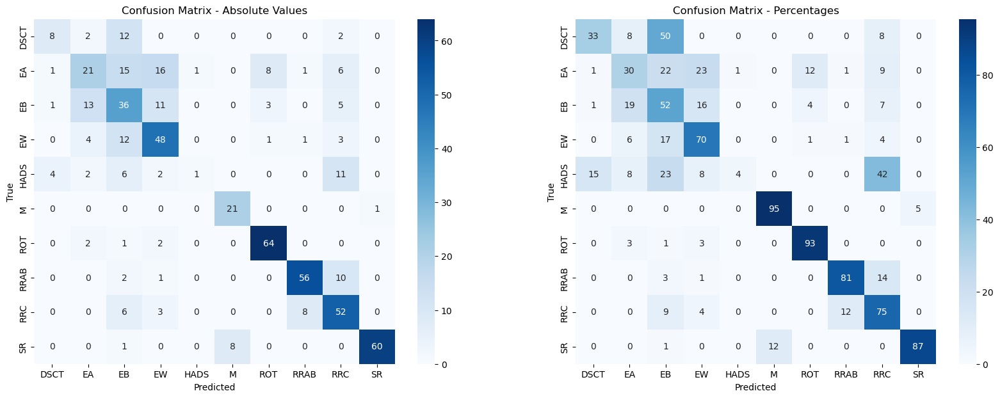

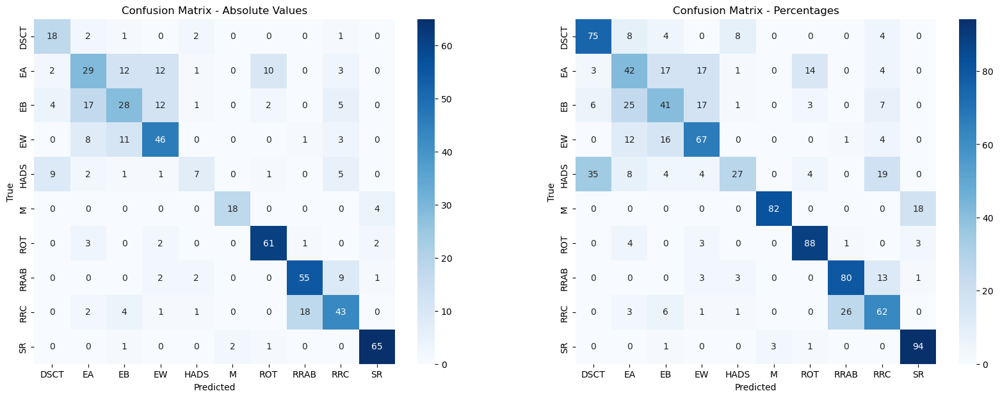

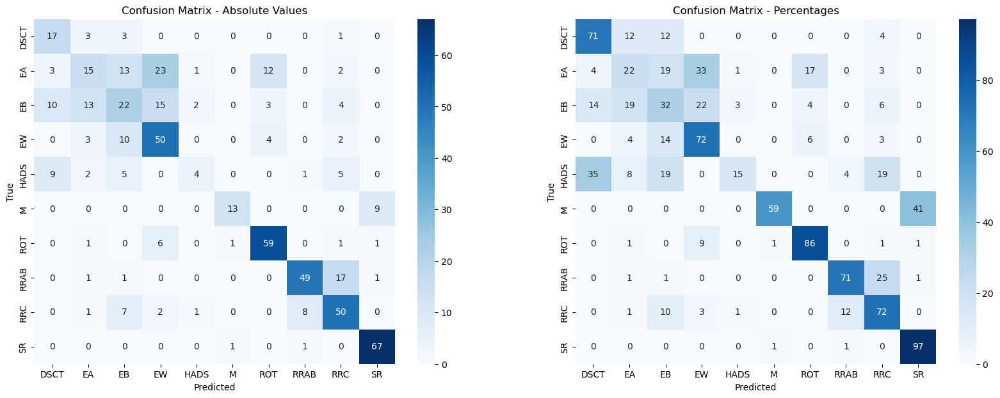

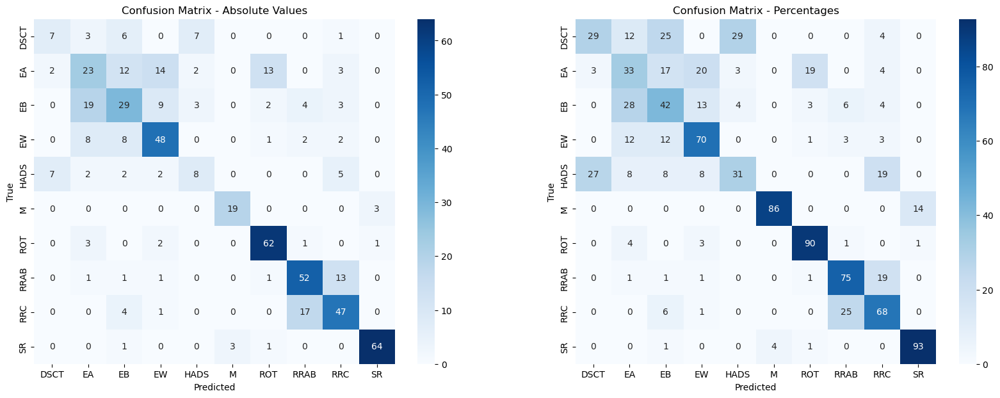

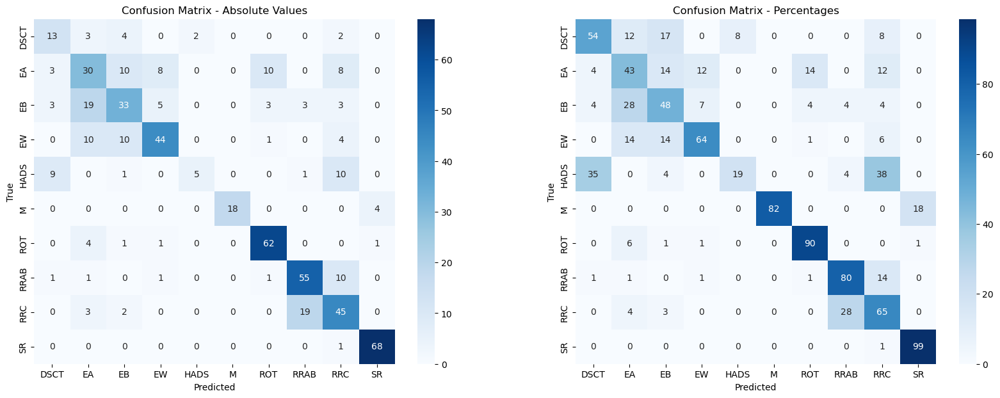

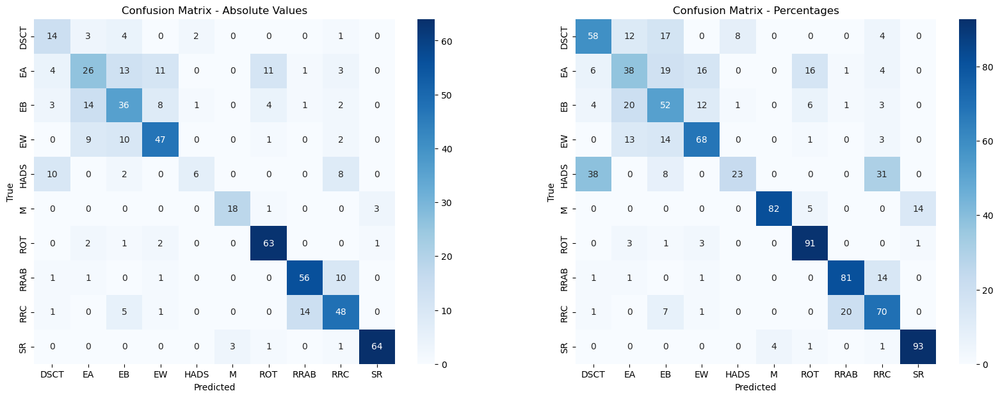

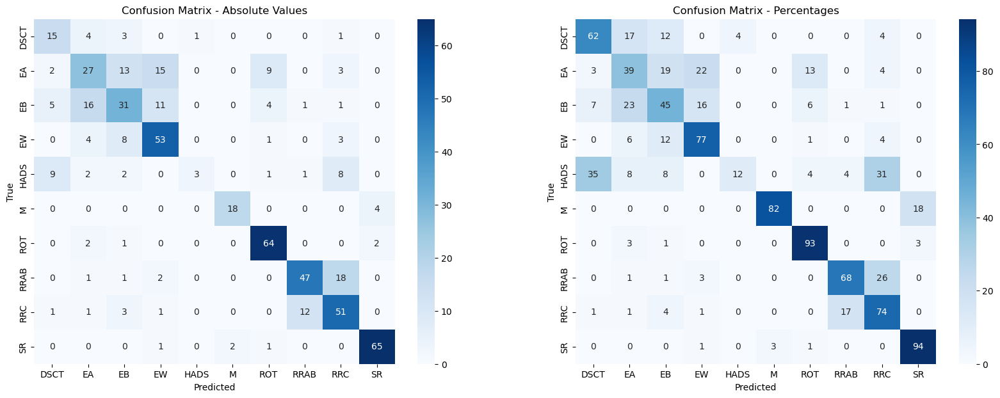

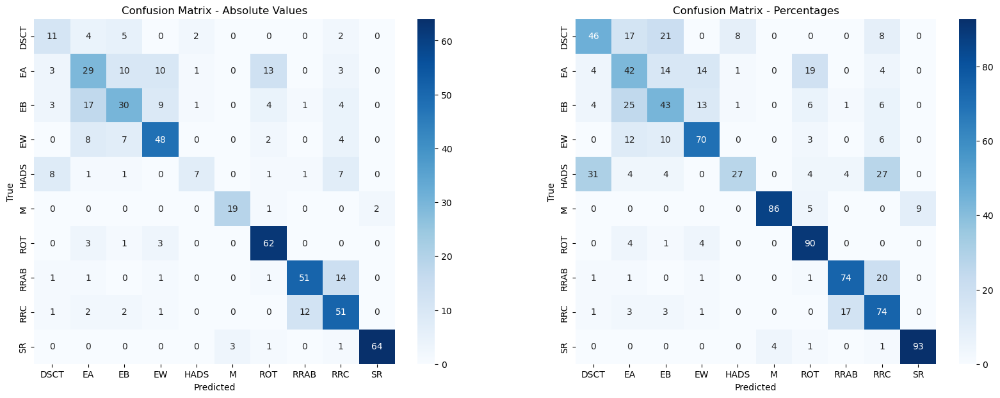

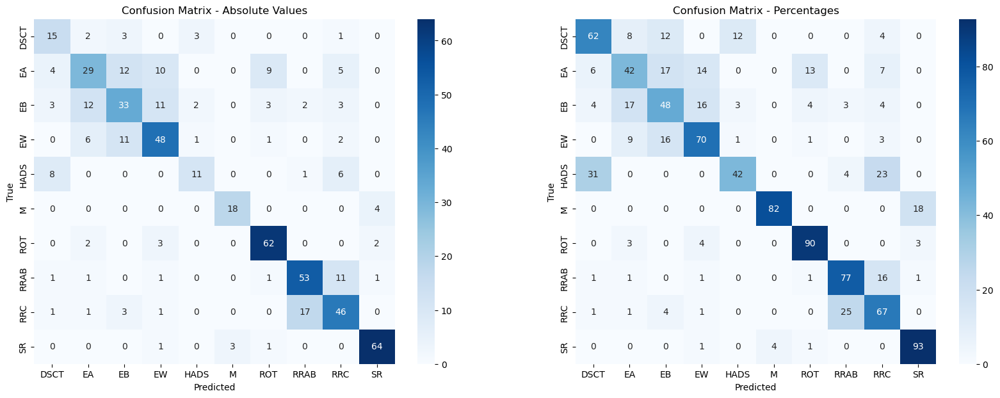

In [80]:
spectra_runs = ['iixgn9mp', 'eanyfw4a', '5pcq5ei3', 'kqgxs919', '9pa81z05']
spectra_clip_runs = ['2eev50hs', 't8pxbkn9', 'svqnzfh1', '3ulqu12b', 'tzlsx3g0']

sub25_spectra_acc = []
sub25_spectra_clip_acc = []

for i in range(5):
    acc = calc_results('MeriDK/AstroCLIPResults/' + spectra_runs[i], 'best')
    sub25_spectra_acc.append(acc)

for i in range(5):
    acc = calc_results('MeriDK/AstroCLIPResults/' + spectra_clip_runs[i], 'best')
    sub25_spectra_clip_acc.append(acc)

100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:09<00:00,  4.56s/it]


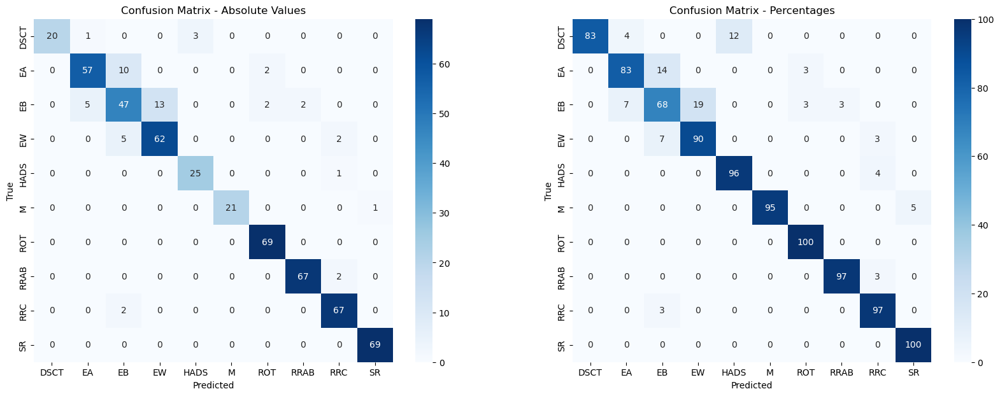

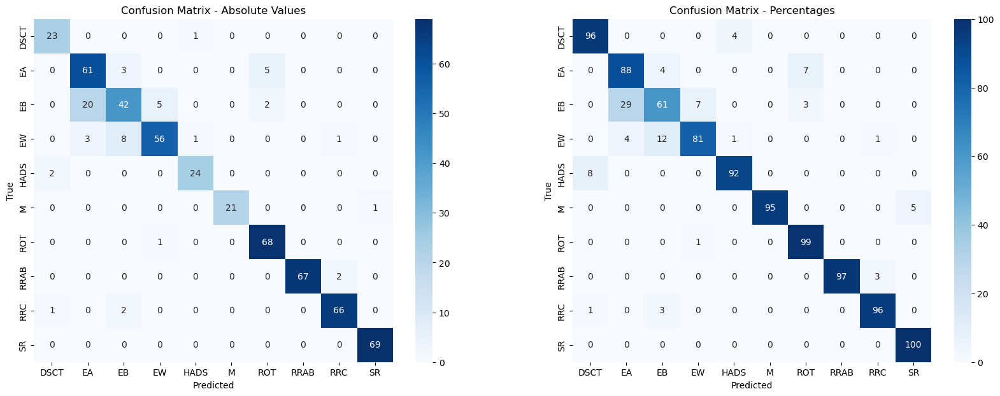

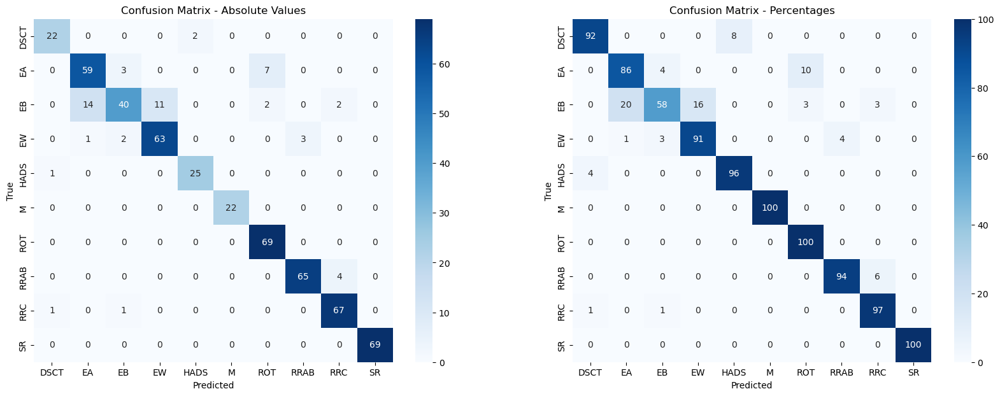

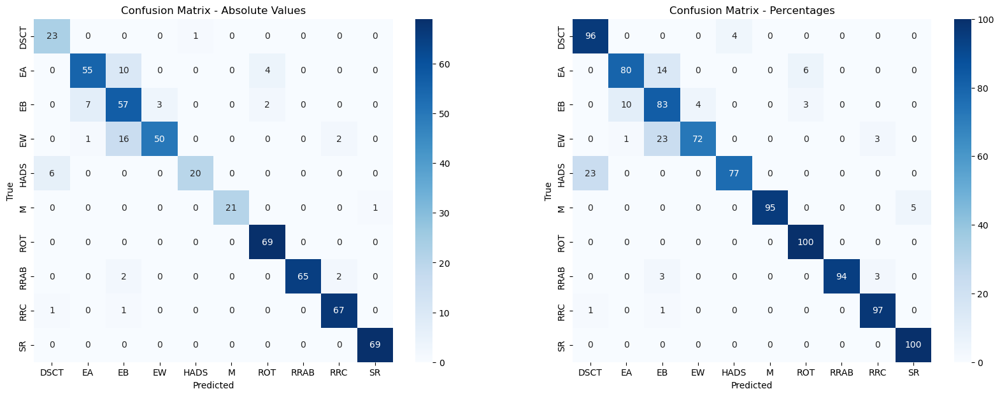

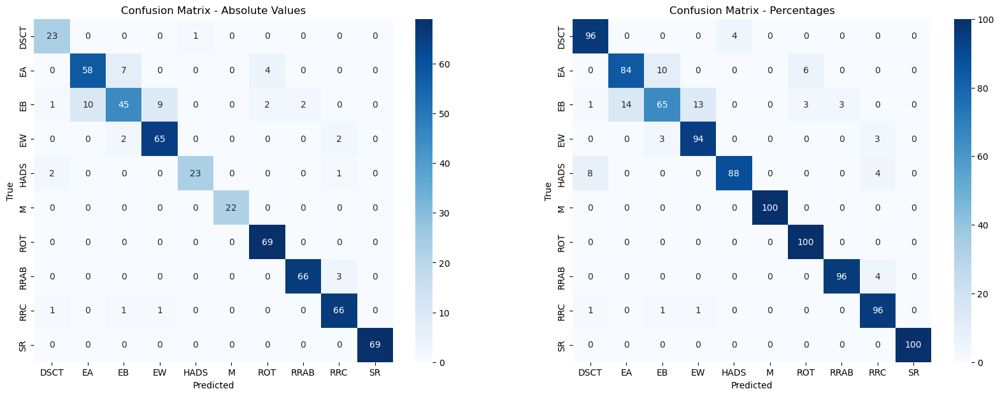

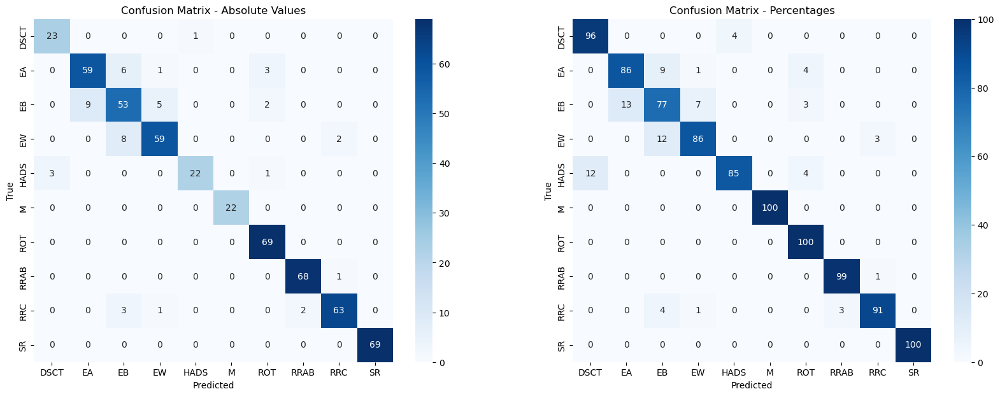

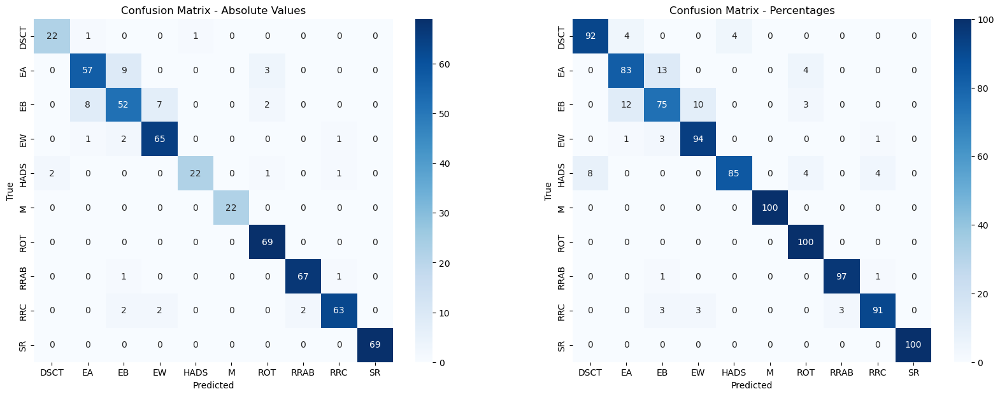

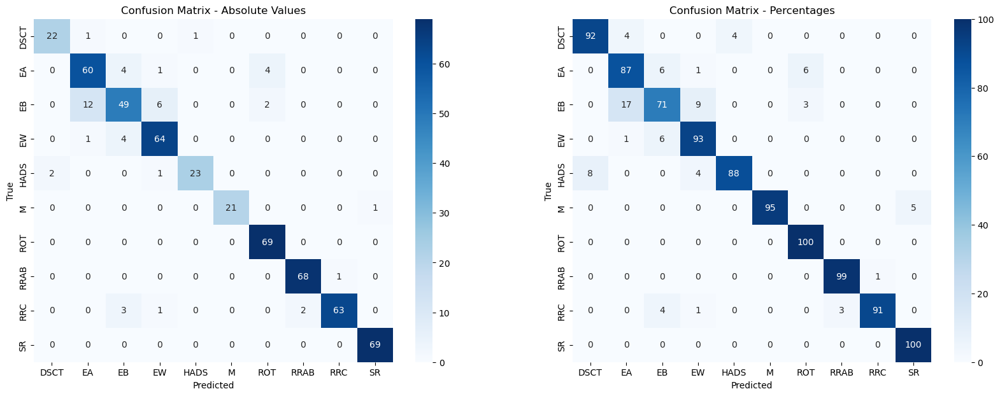

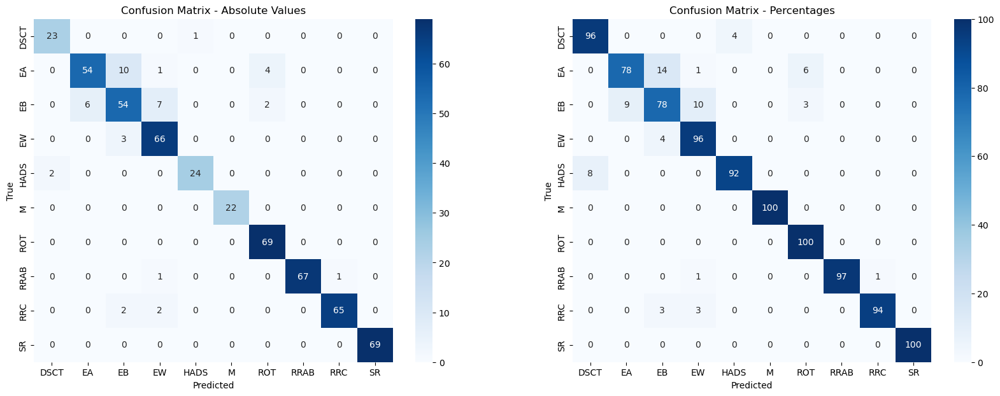

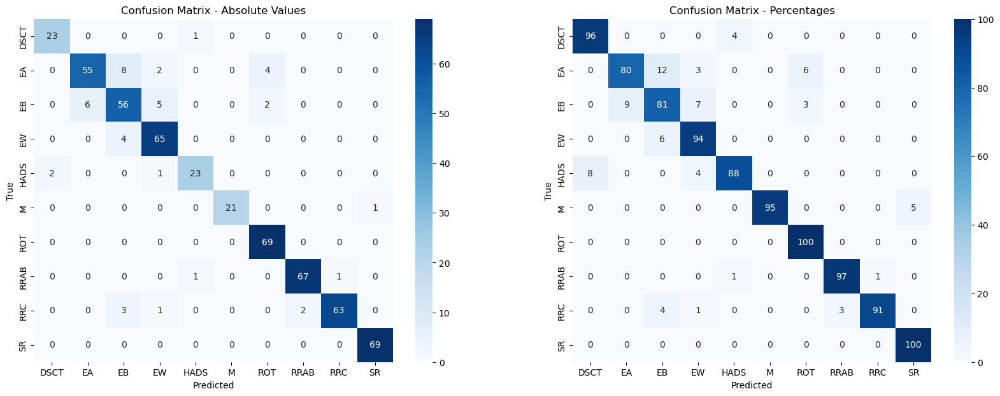

In [81]:
all_runs = ['0t6n9r5c', 'b6h1cyhi', '6iufn4mf', 'jj71jlmy', '29kgmlpu']
all_clip_runs = ['j7yco24k', '7gejd4m2', 'hgz3pen1', '3v78u0nh', 'axwprfz6']

sub25_all_acc = []
sub25_all_clip_acc = []

for i in range(5):
    acc = calc_results('MeriDK/AstroCLIPResults/' + all_runs[i], 'best')
    sub25_all_acc.append(acc)

for i in range(5):
    acc = calc_results('MeriDK/AstroCLIPResults/' + all_clip_runs[i], 'best')
    sub25_all_clip_acc.append(acc)

In [82]:
np.mean(sub25_meta_acc), np.std(sub25_meta_acc)

(0.8893693693693695, 0.018745667464706236)

In [83]:
np.mean(sub25_meta_clip_acc), np.std(sub25_meta_clip_acc)

(0.9034234234234233, 0.003881199860997828)

In [84]:
np.mean(sub25_spectra_acc), np.std(sub25_spectra_acc)

(0.65009009009009, 0.015005883108941997)

In [87]:
np.mean(sub25_spectra_clip_acc), np.std(sub25_spectra_clip_acc)

(0.6760360360360361, 0.005019239018805089)

In [88]:
np.mean(sub25_all_acc), np.std(sub25_all_acc)

(0.9023423423423423, 0.006969037695788753)

In [89]:
np.mean(sub25_all_clip_acc), np.std(sub25_all_clip_acc)

(0.9178378378378378, 0.004045035012728596)

# SUB10

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.97s/it]


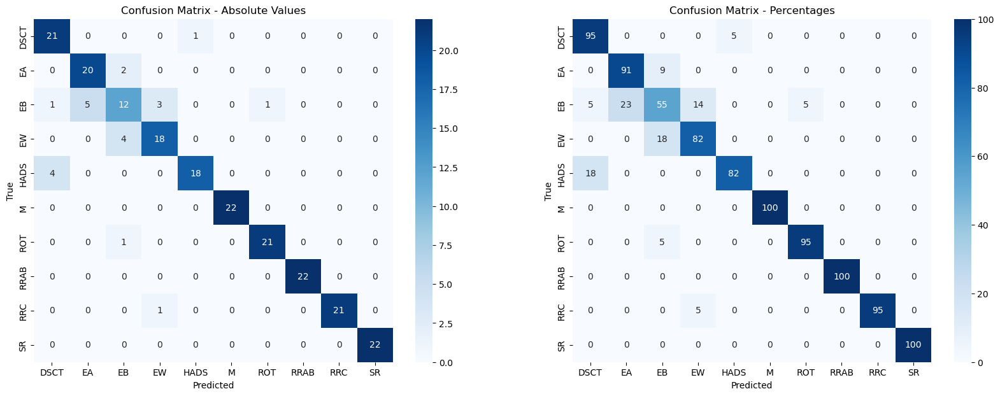

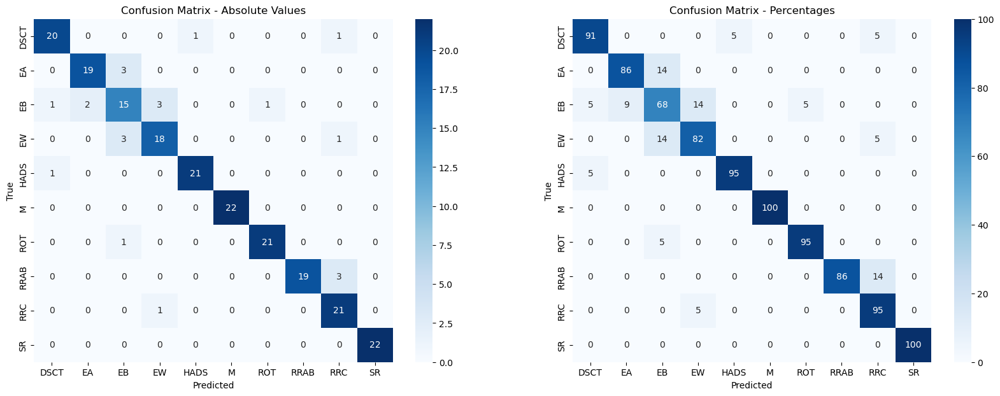

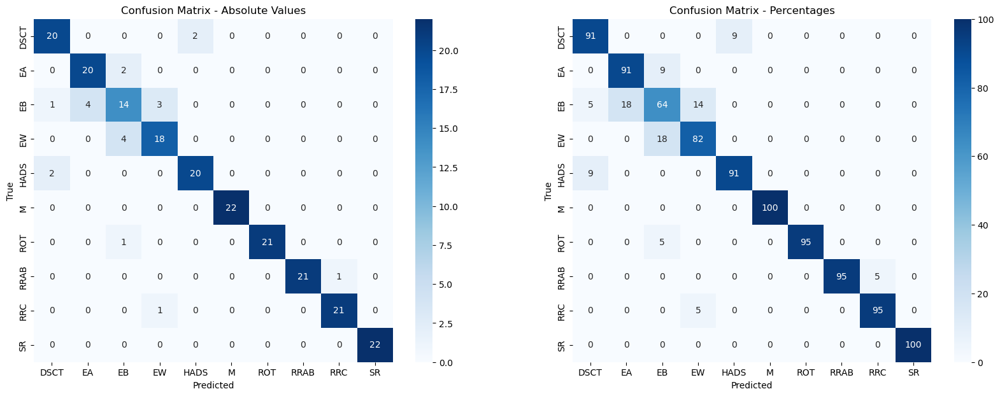

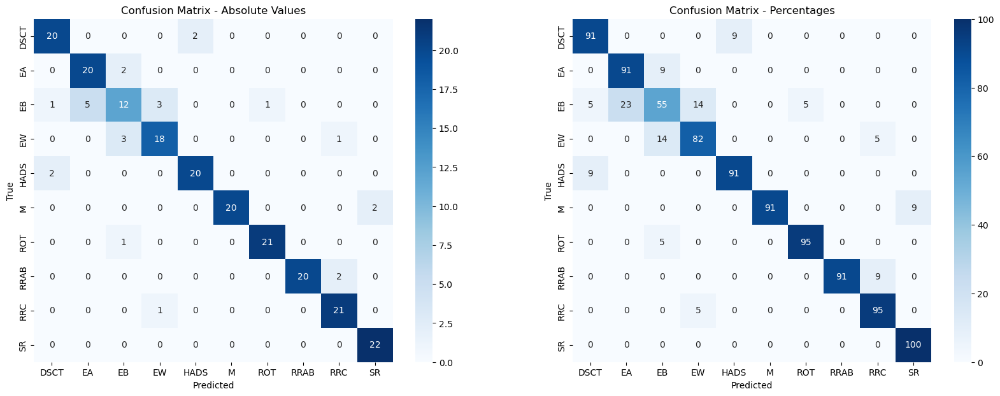

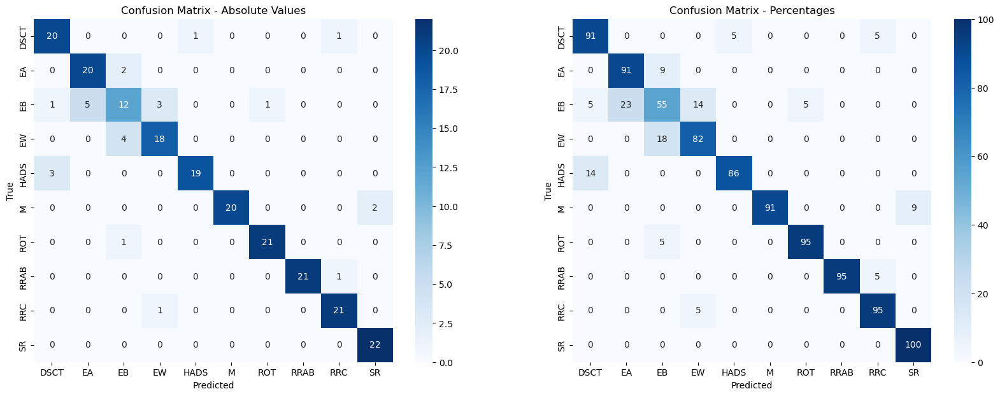

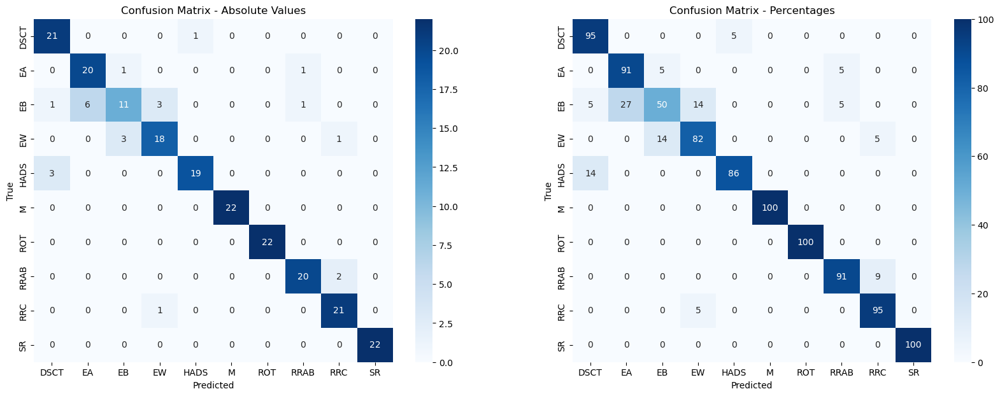

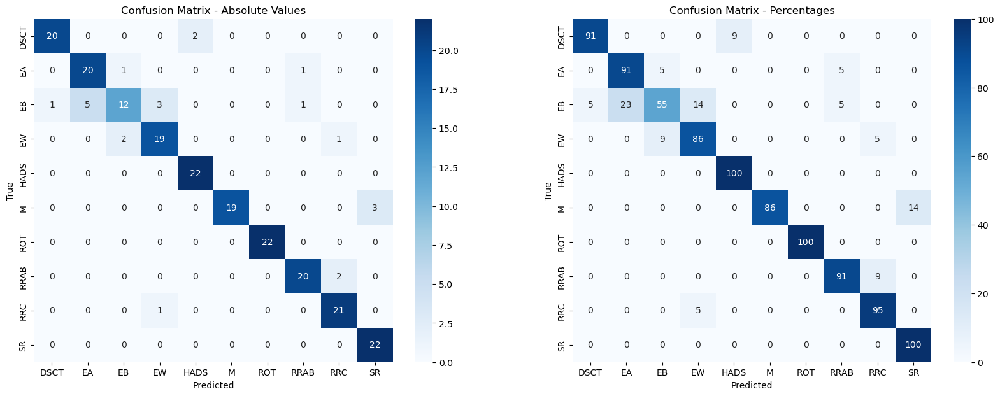

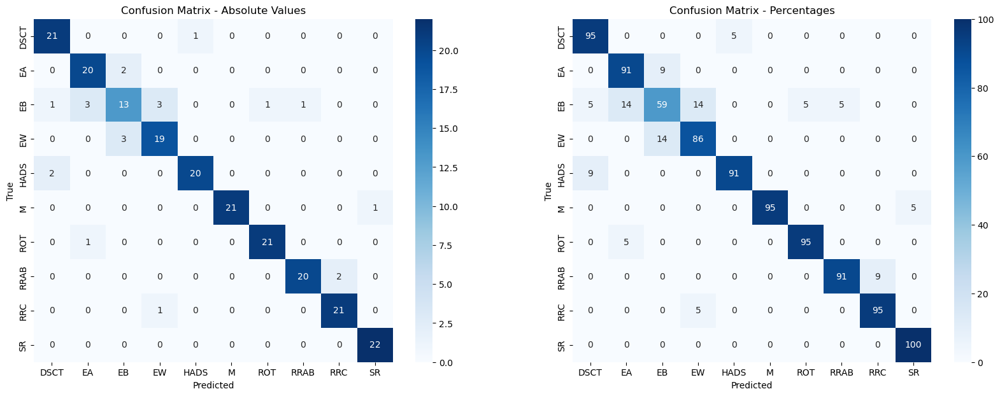

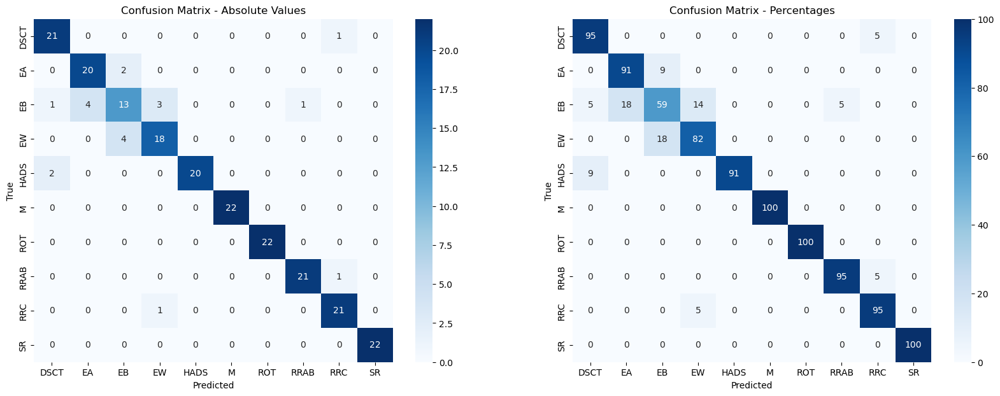

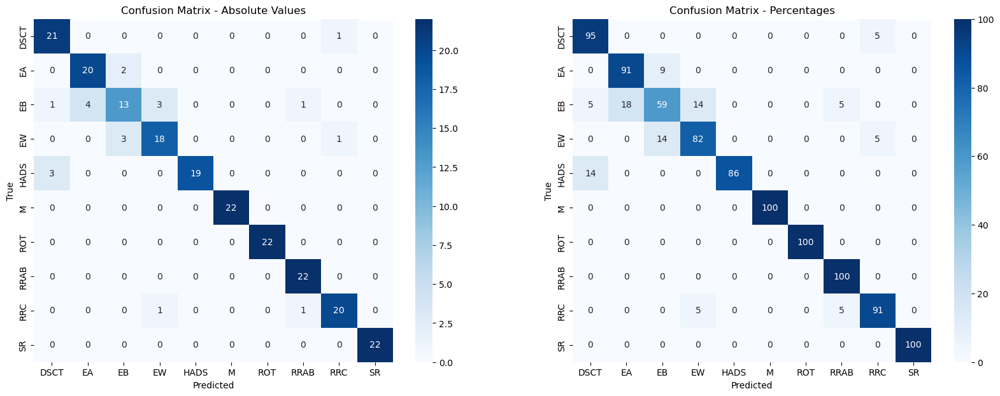

In [90]:
meta_runs = ['imopajxj', 'vfco6u0j', 'x41il6dj', 'mhgc2a5h', 'acnbvws8']
meta_clip_runs = ['yinqv7vd', 'qb2ze36v', 'nkmh5dk6', 'gwyz0xx6', 'mwmdx5m4']

sub10_meta_acc = []
sub10_meta_clip_acc = []

for i in range(5):
    acc = calc_results('MeriDK/AstroCLIPResults/' + meta_runs[i], 'best')
    sub10_meta_acc.append(acc)

for i in range(5):
    acc = calc_results('MeriDK/AstroCLIPResults/' + meta_clip_runs[i], 'best')
    sub10_meta_clip_acc.append(acc)

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:04<00:00,  4.12s/it]


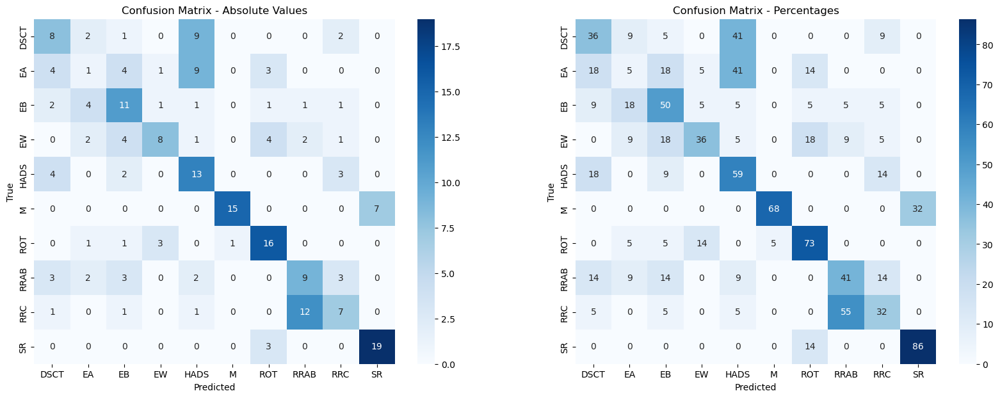

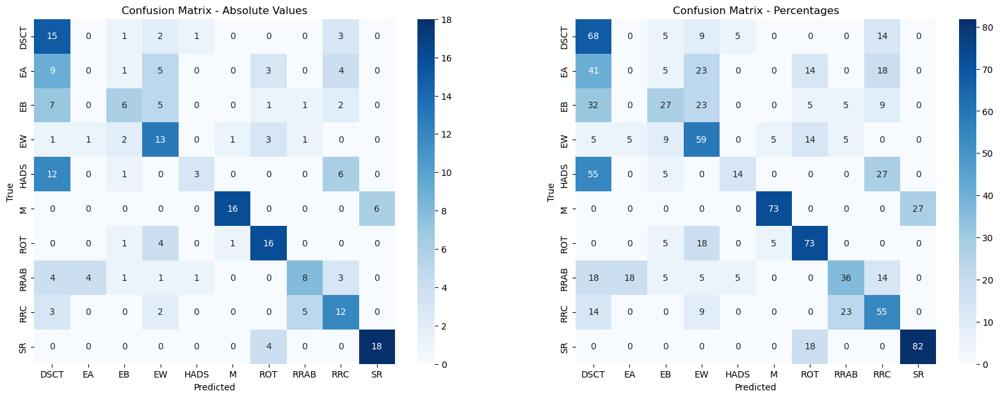

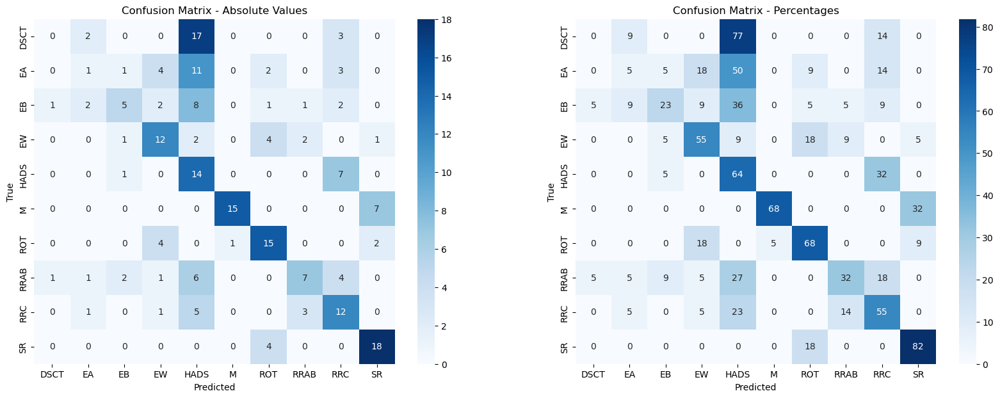

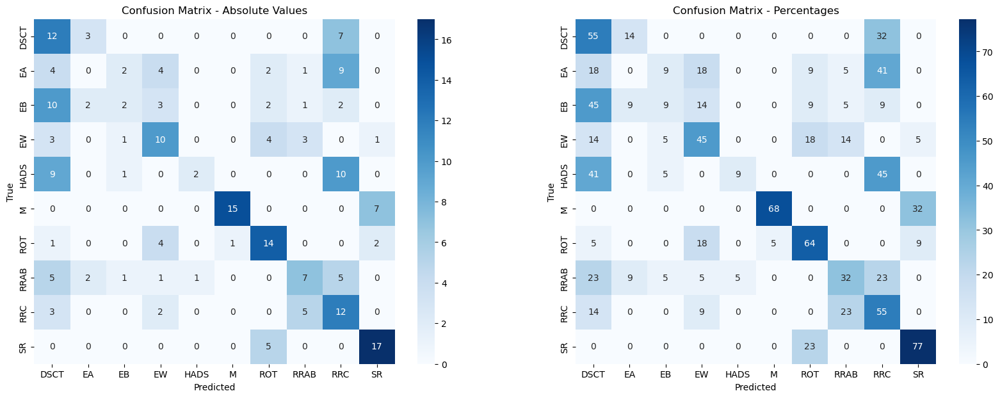

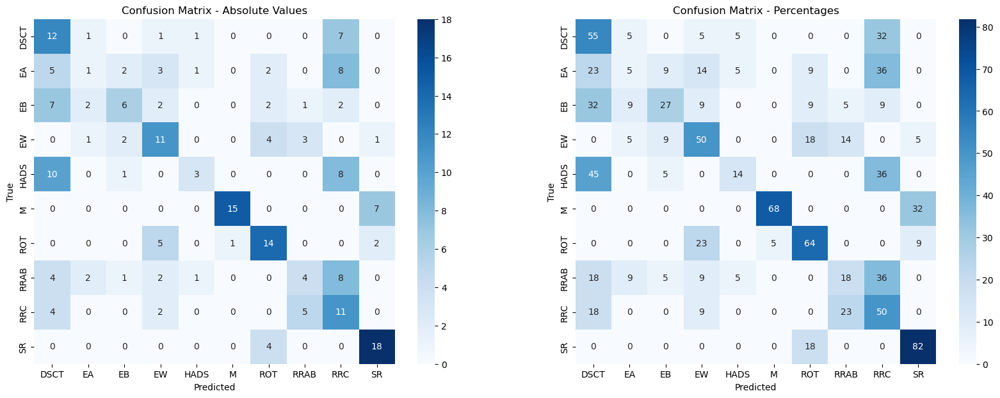

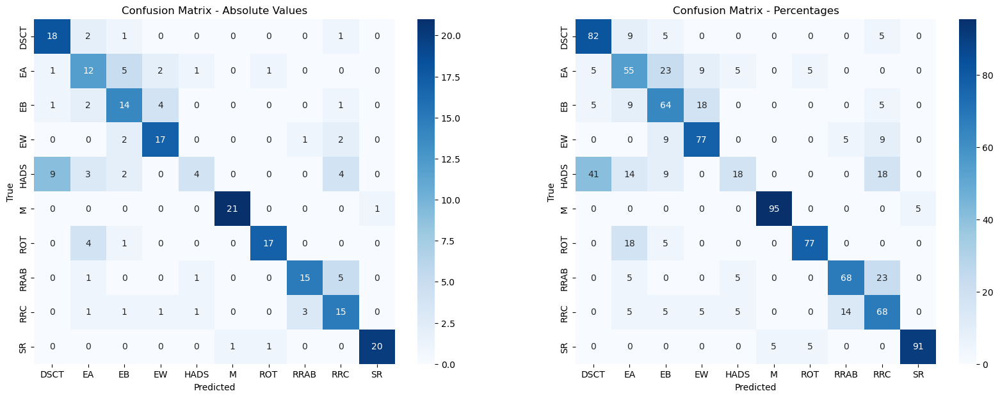

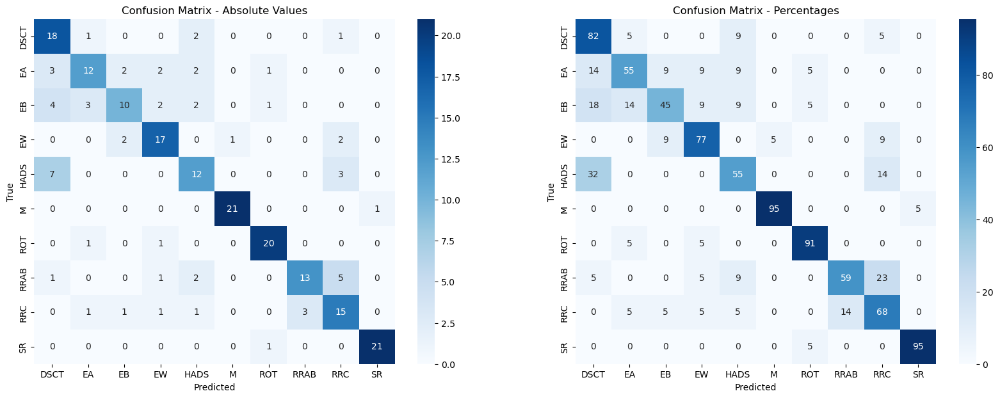

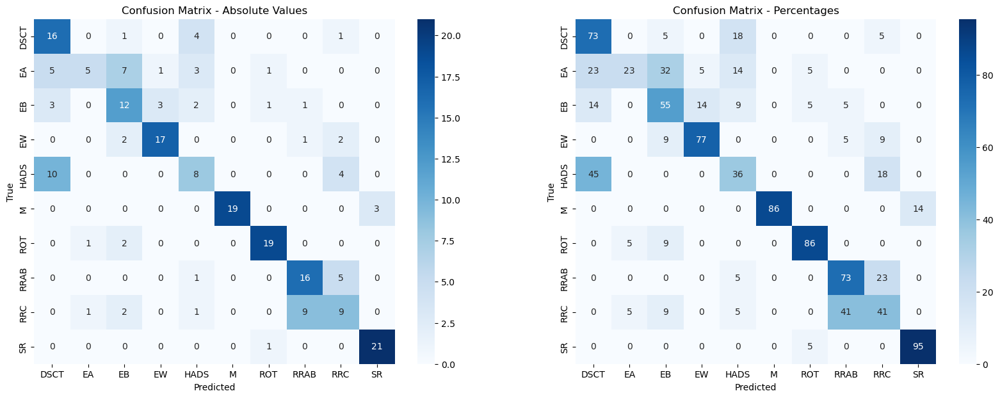

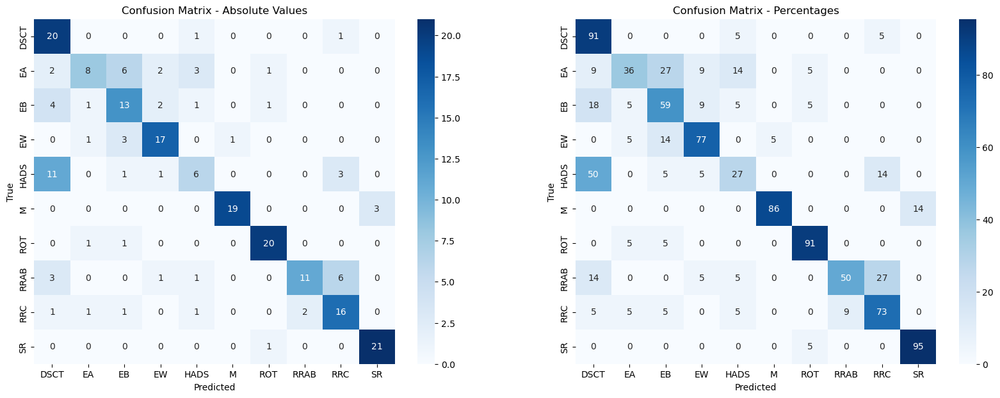

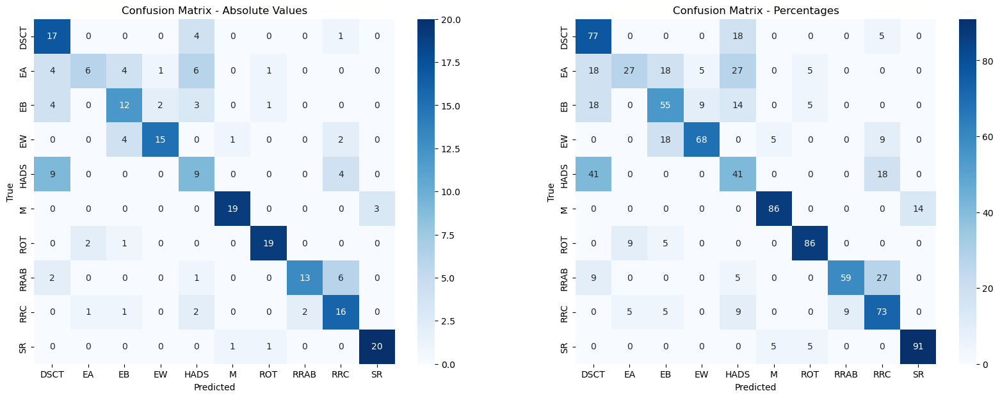

In [91]:
spectra_runs = ['2dtmrus6', 'nij8mon4', 'cx3mqbc6', 'fh1nkw5s', 'a1bx2ofc']
spectra_clip_runs = ['6jgskg99', 'qe9bmswk', 'rymnryy2', 'drqw3dtr', 'eugzkasi']

sub10_spectra_acc = []
sub10_spectra_clip_acc = []

for i in range(5):
    acc = calc_results('MeriDK/AstroCLIPResults/' + spectra_runs[i], 'best')
    sub10_spectra_acc.append(acc)

for i in range(5):
    acc = calc_results('MeriDK/AstroCLIPResults/' + spectra_clip_runs[i], 'best')
    sub10_spectra_clip_acc.append(acc)

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.01s/it]


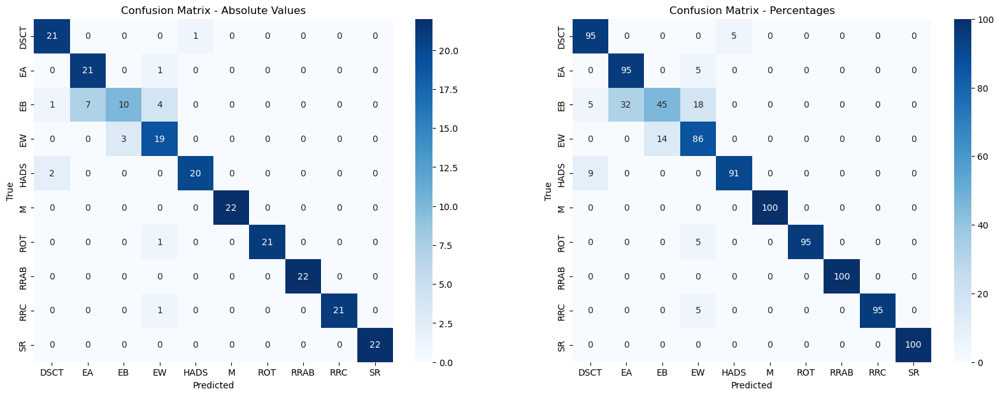

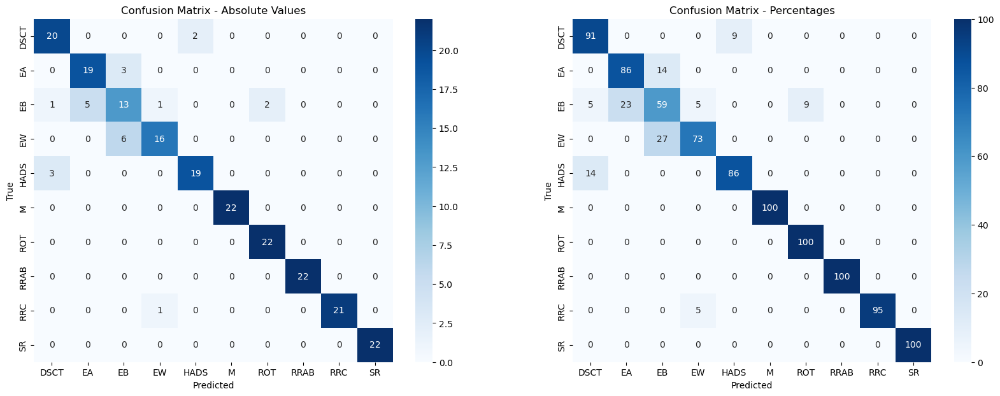

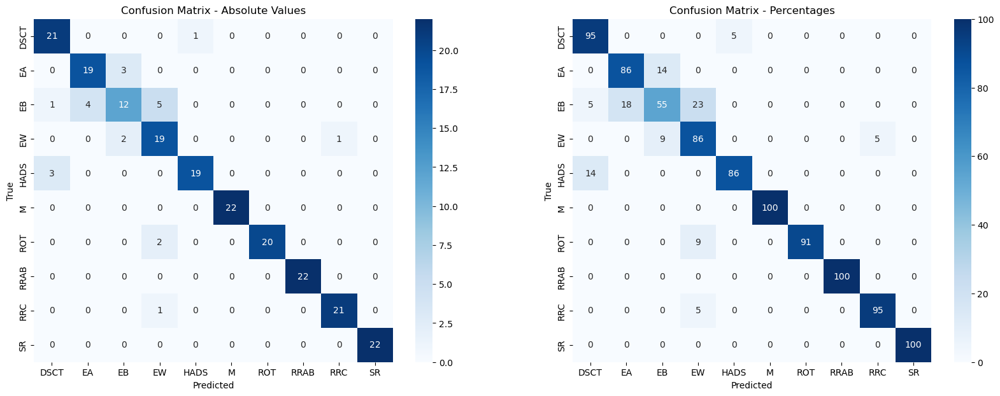

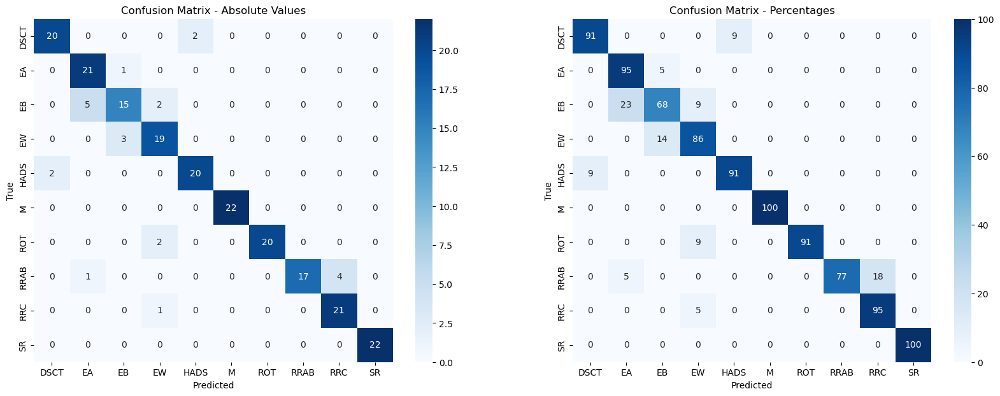

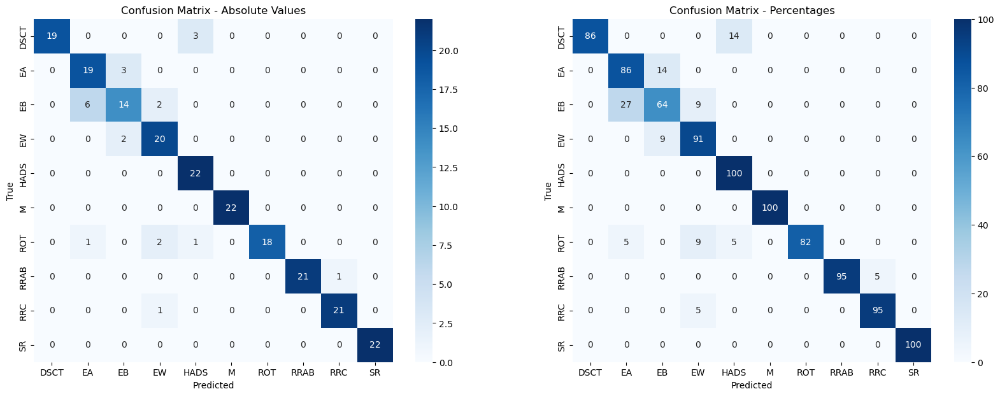

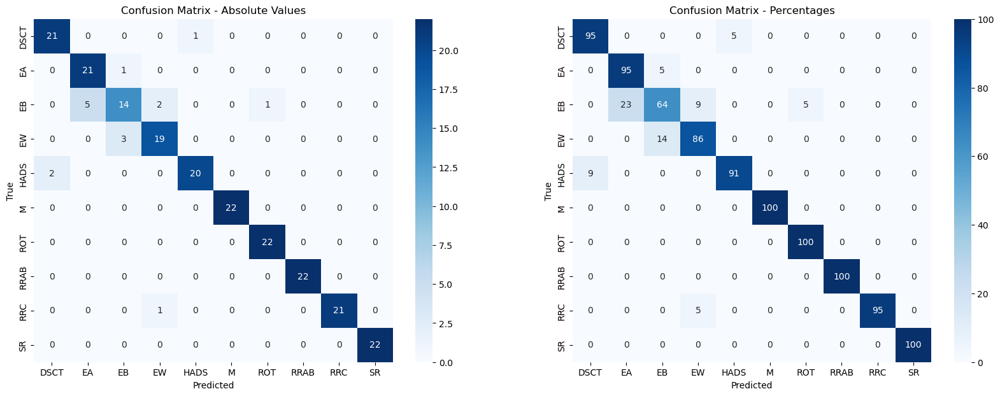

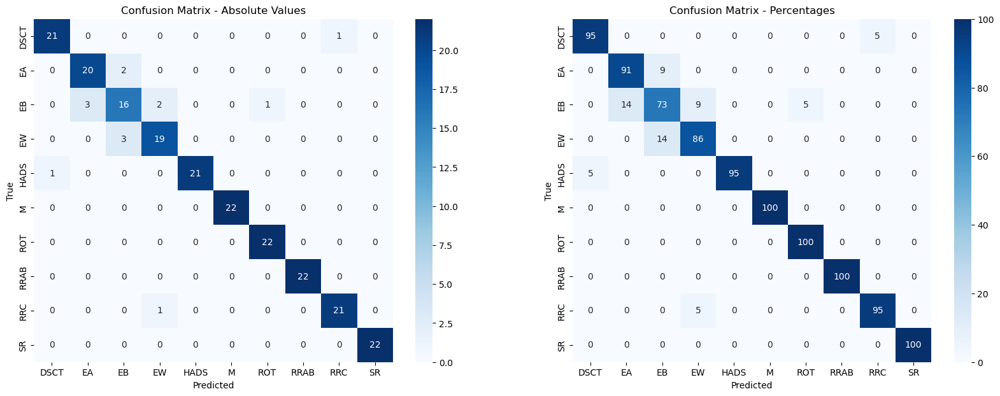

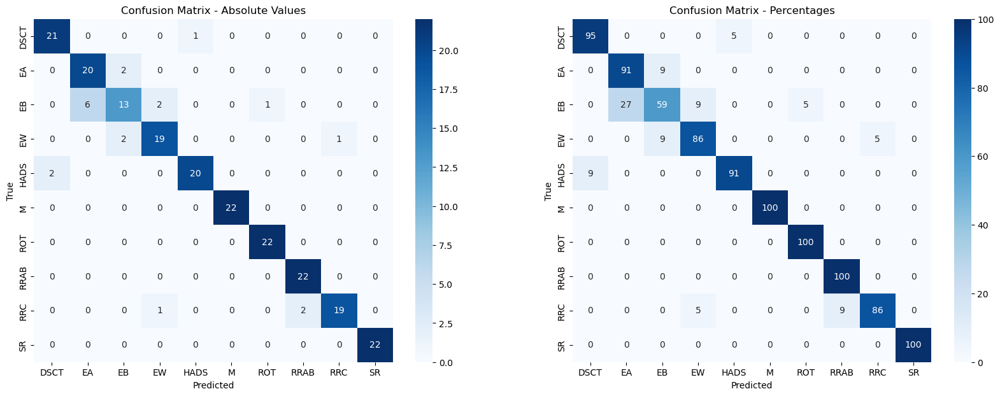

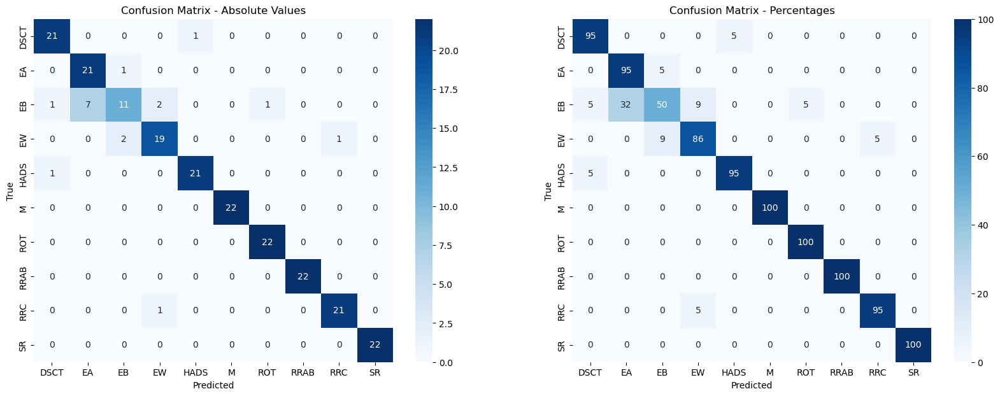

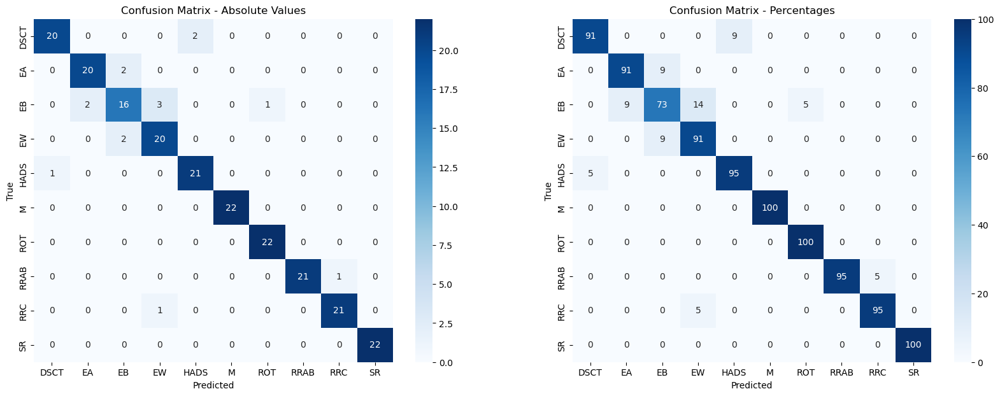

In [113]:
all_runs = ['v30dvi21', '8hwy4tme', '7dp08ff9', 'rizyat95', 'duw5pa07']
all_clip_runs = ['p6f8fjhi', 'fwco01c9', '1dz9vwk0', '78q4dq23', 'yhixosmo']

sub10_all_acc = []
sub10_all_clip_acc = []

for i in range(5):
    acc = calc_results('MeriDK/AstroCLIPResults/' + all_runs[i], 'best')
    sub10_all_acc.append(acc)

for i in range(5):
    acc = calc_results('MeriDK/AstroCLIPResults/' + all_clip_runs[i], 'best')
    sub10_all_clip_acc.append(acc)

In [92]:
np.mean(sub10_meta_acc), np.std(sub10_meta_acc)

(0.8927272727272728, 0.009359663764533635)

In [93]:
np.mean(sub10_meta_clip_acc), np.std(sub10_meta_clip_acc)

(0.9, 0.006428243465332244)

In [94]:
np.mean(sub10_spectra_acc), np.std(sub10_spectra_acc)

(0.4536363636363636, 0.0290909090909091)

In [95]:
np.mean(sub10_spectra_clip_acc), np.std(sub10_spectra_clip_acc)

(0.6827272727272727, 0.026566616720368096)

In [114]:
np.mean(sub10_all_acc), np.std(sub10_all_acc)

(0.8972727272727272, 0.0046354722850843535)

In [115]:
np.mean(sub10_all_clip_acc), np.std(sub10_all_clip_acc)

(0.9245454545454546, 0.00979120874024456)

# Summary

In [121]:
data_root = '/home/mariia/AstroML/data/asassn/preprocessed_data'
ds = {}

for sub in ('full', 'sub50', 'sub25', 'sub10'):
    for el in ('train', 'val', 'test'):
        df = pd.read_csv(f'{data_root}/{sub}/spectra_and_v_{el}_norm.csv')
        ds[f'{sub}_{el}'] = df['target'].value_counts()

In [ ]:
cl = {}

for el in ds:
    if 'train' in el:
        

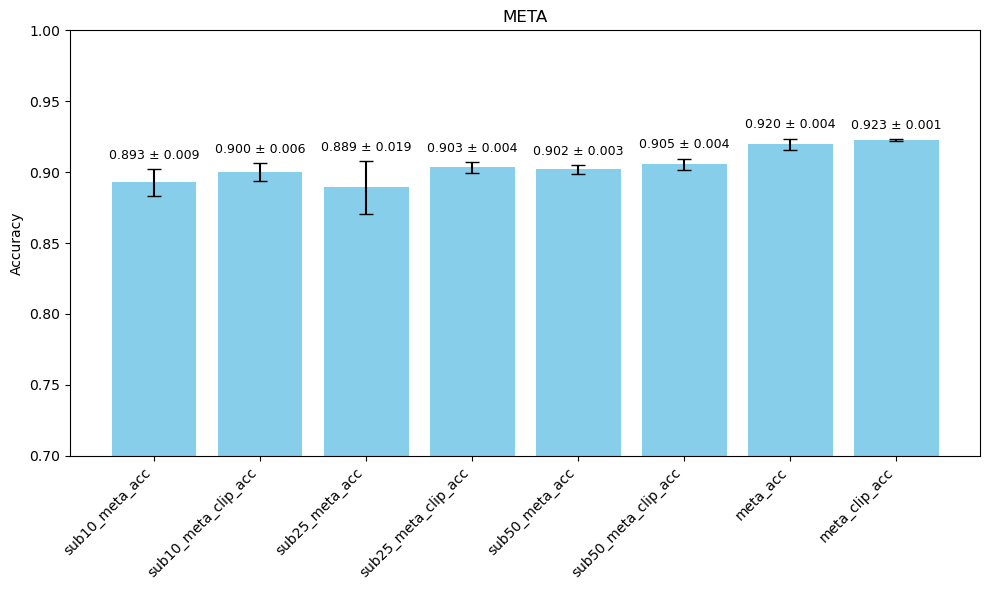

In [111]:
means = [
    np.mean(sub10_meta_acc), np.mean(sub10_meta_clip_acc),
    np.mean(sub25_meta_acc), np.mean(sub25_meta_clip_acc),
    np.mean(sub50_meta_acc), np.mean(sub50_meta_clip_acc),
    np.mean(meta_acc), np.mean(meta_clip_acc)
]

std_devs = [
    np.std(sub10_meta_acc), np.std(sub10_meta_clip_acc),
    np.std(sub25_meta_acc), np.std(sub25_meta_clip_acc),
    np.std(sub50_meta_acc), np.std(sub50_meta_clip_acc),
    np.std(meta_acc), np.std(meta_clip_acc)
]

labels = [
    'sub10_meta_acc', 'sub10_meta_clip_acc',
    'sub25_meta_acc', 'sub25_meta_clip_acc',
    'sub50_meta_acc', 'sub50_meta_clip_acc',
    'meta_acc', 'meta_clip_acc'
]

x_pos = np.arange(len(labels))

plt.figure(figsize=(10, 6))
bars = plt.bar(x_pos, means, yerr=std_devs, capsize=5, color='skyblue')
plt.xticks(x_pos, labels, rotation=45, ha='right')
plt.ylabel('Accuracy')
plt.ylim(0.7, 1.0)  # Adjust the y-axis to start at 0.7 as you prefer
plt.title('META')

for i in range(len(bars)):
    plt.text(bars[i].get_x() + bars[i].get_width() / 2, 
             bars[i].get_height() + std_devs[i] + 0.005, 
             f'{means[i]:.3f} ± {std_devs[i]:.3f}',
             ha='center', va='bottom', fontsize=9)
    
plt.tight_layout()
plt.show()

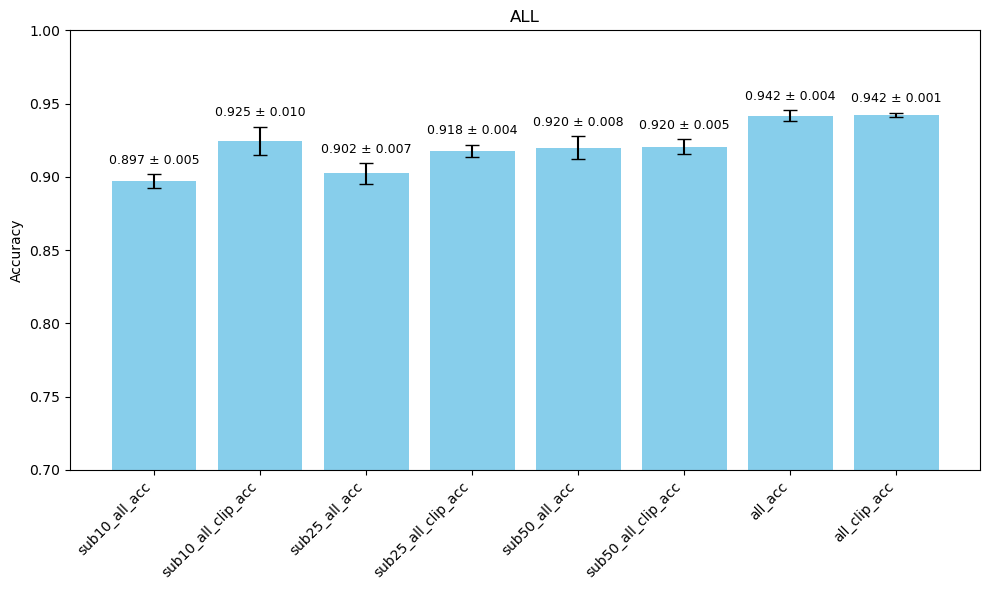

In [116]:
means = [
    np.mean(sub10_all_acc), np.mean(sub10_all_clip_acc),
    np.mean(sub25_all_acc), np.mean(sub25_all_clip_acc),
    np.mean(sub50_all_acc), np.mean(sub50_all_clip_acc),
    np.mean(all_acc), np.mean(all_clip_acc)
]

std_devs = [
    np.std(sub10_all_acc), np.std(sub10_all_clip_acc),
    np.std(sub25_all_acc), np.std(sub25_all_clip_acc),
    np.std(sub50_all_acc), np.std(sub50_all_clip_acc),
    np.std(all_acc), np.std(all_clip_acc)
]

labels = [
    'sub10_all_acc', 'sub10_all_clip_acc',
    'sub25_all_acc', 'sub25_all_clip_acc',
    'sub50_all_acc', 'sub50_all_clip_acc',
    'all_acc', 'all_clip_acc'
]

x_pos = np.arange(len(labels))

plt.figure(figsize=(10, 6))
bars = plt.bar(x_pos, means, yerr=std_devs, capsize=5, color='skyblue')
plt.xticks(x_pos, labels, rotation=45, ha='right')
plt.ylabel('Accuracy')
plt.ylim(0.7, 1.0)  # Adjust the y-axis to start at 0.7 as you prefer
plt.title('ALL')

for i in range(len(bars)):
    plt.text(bars[i].get_x() + bars[i].get_width() / 2, 
             bars[i].get_height() + std_devs[i] + 0.005, 
             f'{means[i]:.3f} ± {std_devs[i]:.3f}',
             ha='center', va='bottom', fontsize=9)


plt.tight_layout()
plt.show()

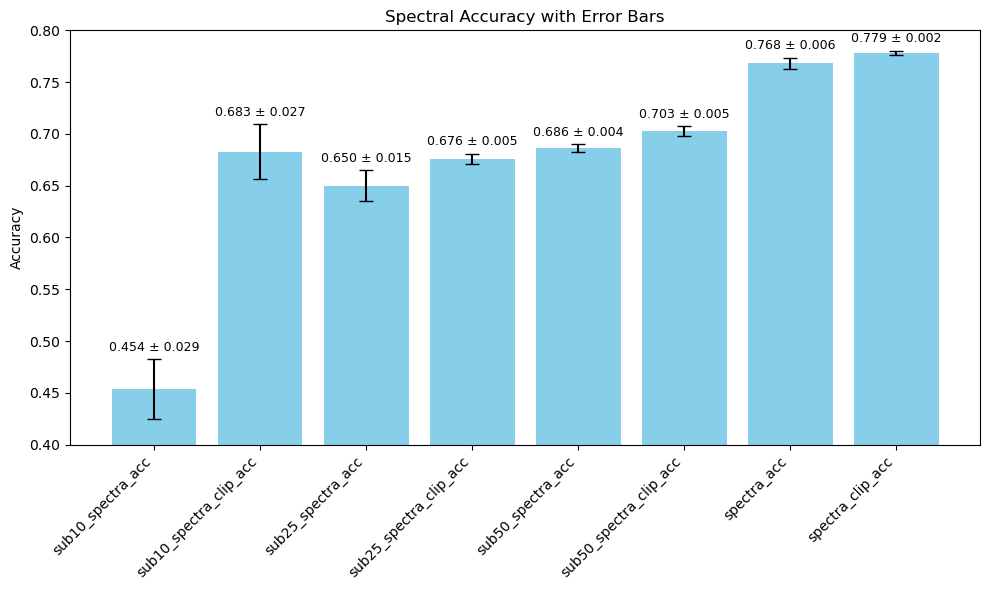

In [117]:
means = [
    np.mean(sub10_spectra_acc), np.mean(sub10_spectra_clip_acc),
    np.mean(sub25_spectra_acc), np.mean(sub25_spectra_clip_acc),
    np.mean(sub50_spectra_acc), np.mean(sub50_spectra_clip_acc),
    np.mean(spectra_acc), np.mean(spectra_clip_acc)
]

std_devs = [
    np.std(sub10_spectra_acc), np.std(sub10_spectra_clip_acc),
    np.std(sub25_spectra_acc), np.std(sub25_spectra_clip_acc),
    np.std(sub50_spectra_acc), np.std(sub50_spectra_clip_acc),
    np.std(spectra_acc), np.std(spectra_clip_acc)
]

labels = [
    'sub10_spectra_acc', 'sub10_spectra_clip_acc',
    'sub25_spectra_acc', 'sub25_spectra_clip_acc',
    'sub50_spectra_acc', 'sub50_spectra_clip_acc',
    'spectra_acc', 'spectra_clip_acc'
]

x_pos = np.arange(len(labels))

plt.figure(figsize=(10, 6))
bars = plt.bar(x_pos, means, yerr=std_devs, capsize=5, color='skyblue')
plt.xticks(x_pos, labels, rotation=45, ha='right')
plt.ylabel('Accuracy')
plt.ylim(0.4, 0.8)  # Adjust the y-axis to start at 0.7 as you prefer
plt.title('Spectral Accuracy with Error Bars')

for i in range(len(bars)):
    plt.text(bars[i].get_x() + bars[i].get_width() / 2, 
             bars[i].get_height() + std_devs[i] + 0.005, 
             f'{means[i]:.3f} ± {std_devs[i]:.3f}',
             ha='center', va='bottom', fontsize=9)
    
plt.tight_layout()
plt.show()

In [27]:
meta_acc = []

100%|███████████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:42<00:00,  8.58s/it]


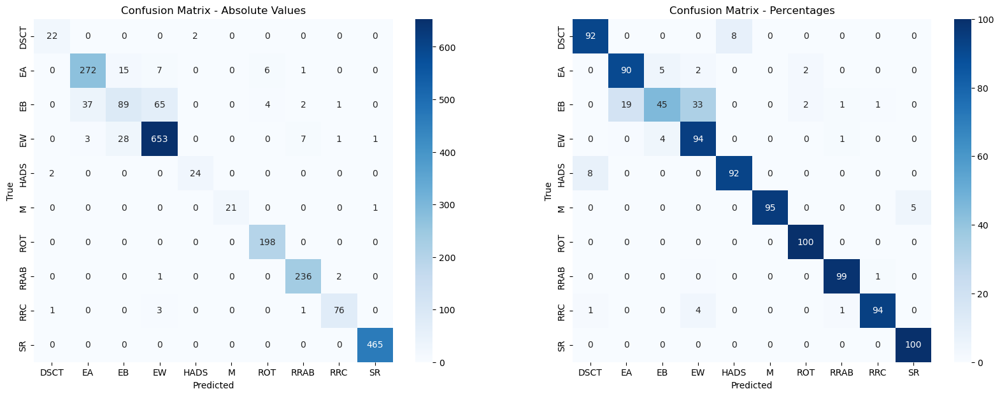

In [28]:
acc = calc_results('MeriDK/AstroCLIPResults/ie1v6sml', 49)
meta_acc.append(acc)

100%|███████████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:40<00:00,  8.07s/it]


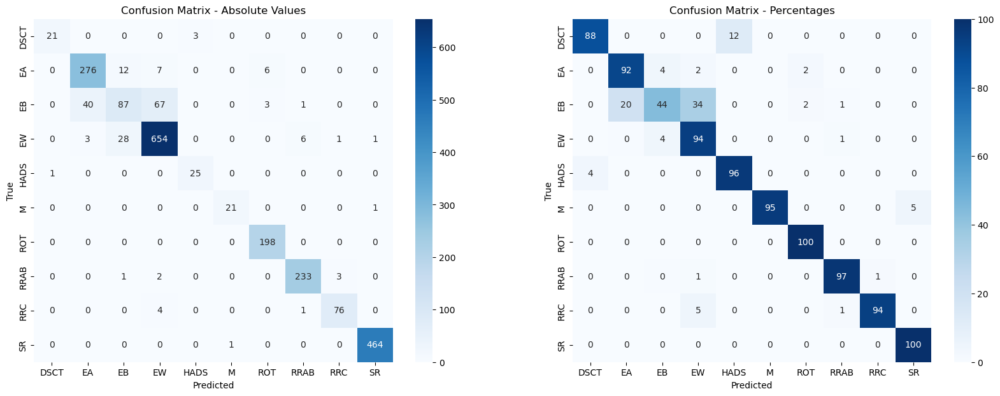

In [29]:
acc = calc_results('MeriDK/AstroCLIPResults/40ni87kv', 49)
meta_acc.append(acc)

100%|███████████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:36<00:00,  7.35s/it]


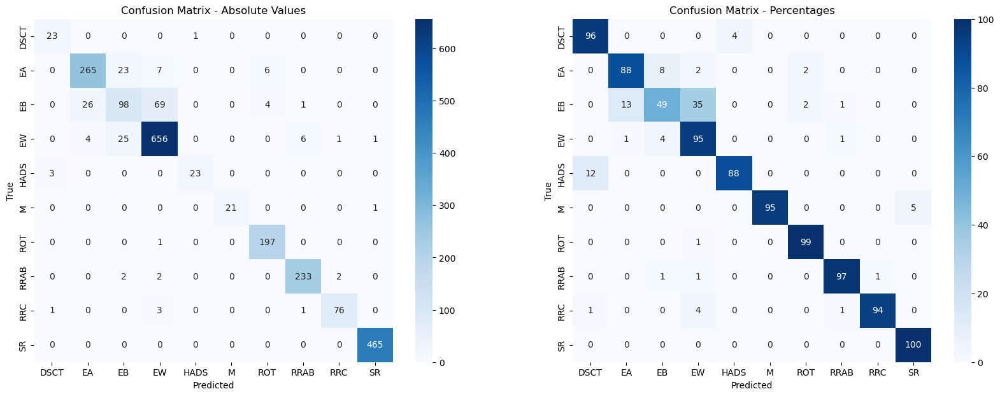

In [32]:
acc = calc_results('MeriDK/AstroCLIPResults/nhudyhng', 49)
meta_acc.append(acc)

100%|███████████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:39<00:00,  7.83s/it]


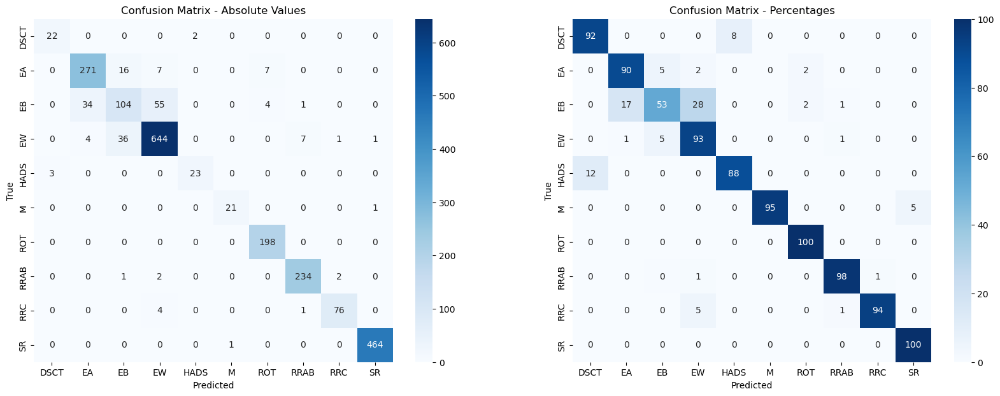

In [30]:
acc = calc_results('MeriDK/AstroCLIPResults/uz3p73ct', 49)
meta_acc.append(acc)

100%|███████████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:39<00:00,  7.94s/it]


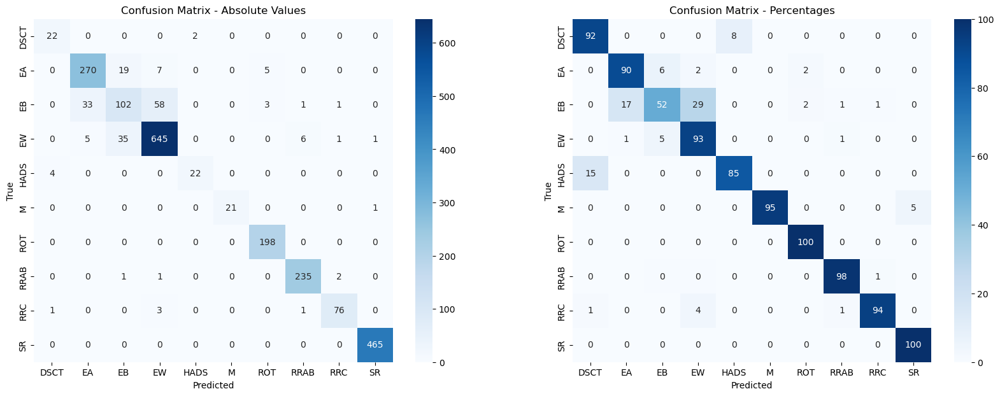

In [31]:
acc = calc_results('MeriDK/AstroCLIPResults/tebkmndy', 49)
meta_acc.append(acc)

In [34]:
np.mean(meta_acc), np.std(meta_acc)

(0.9150867823765021, 0.0003330358154672074)

In [33]:
spectra_acc = []

100%|███████████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:40<00:00,  8.01s/it]


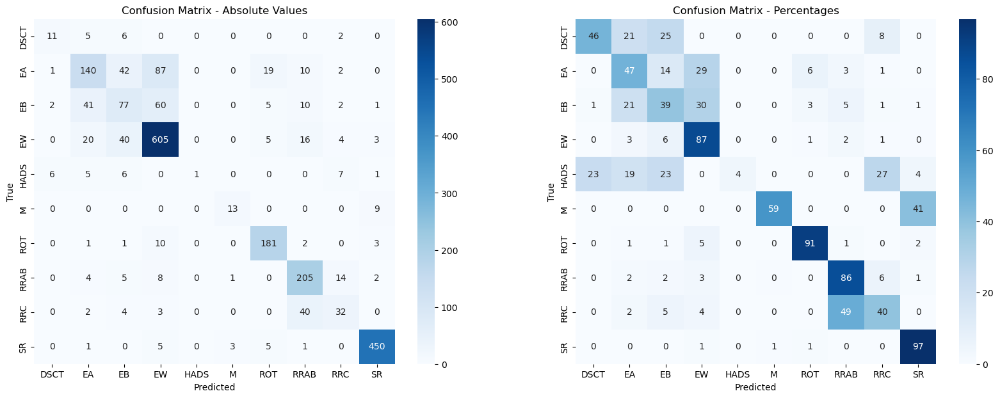

In [35]:
acc = calc_results('MeriDK/AstroCLIPResults/hwp28499', 49)
spectra_acc.append(acc)

100%|███████████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:36<00:00,  7.21s/it]


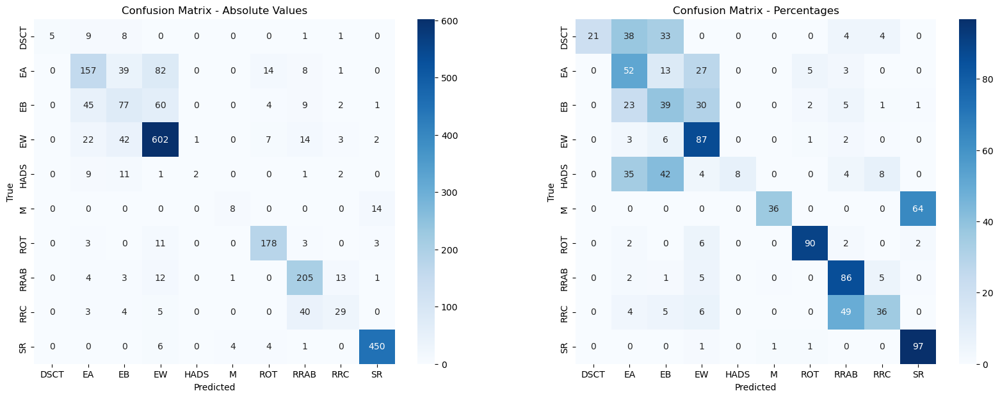

In [37]:
acc = calc_results('MeriDK/AstroCLIPResults/aqhru5yp', 49)
spectra_acc.append(acc)

100%|███████████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:39<00:00,  7.97s/it]


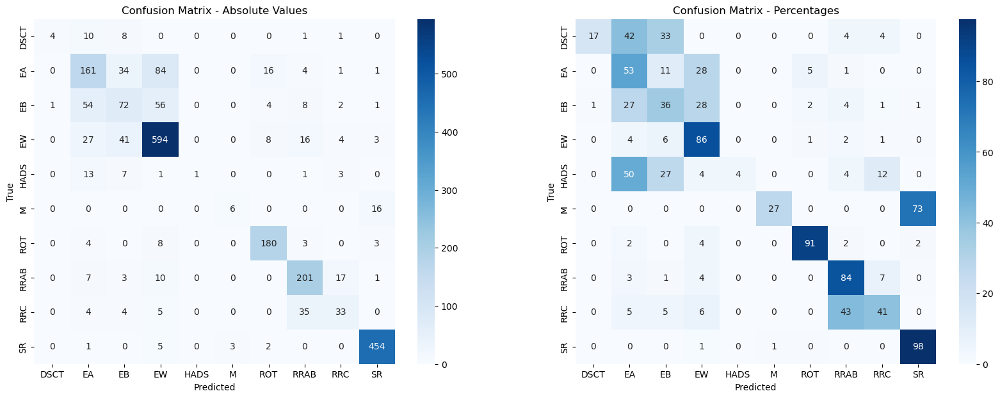

In [36]:
acc = calc_results('MeriDK/AstroCLIPResults/cd3bc24b', 49)
spectra_acc.append(acc)

100%|███████████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:38<00:00,  7.78s/it]


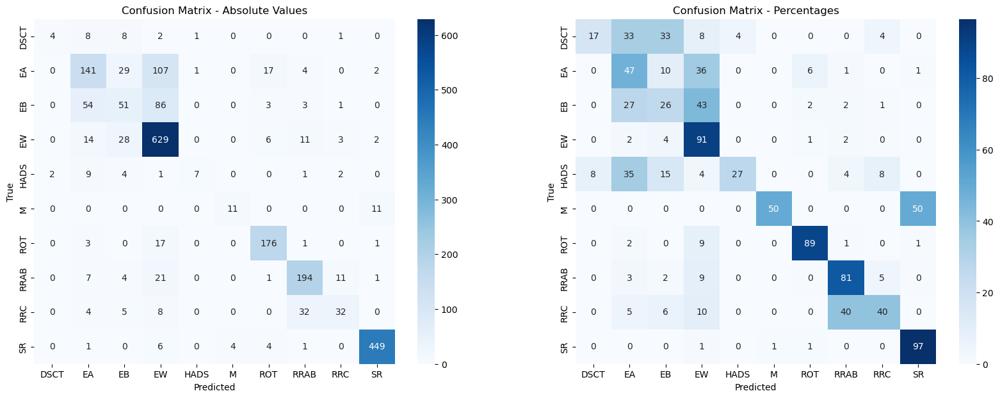

In [38]:
acc = calc_results('MeriDK/AstroCLIPResults/ugq8p42f', 49)
spectra_acc.append(acc)

100%|███████████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:28<00:00,  5.67s/it]


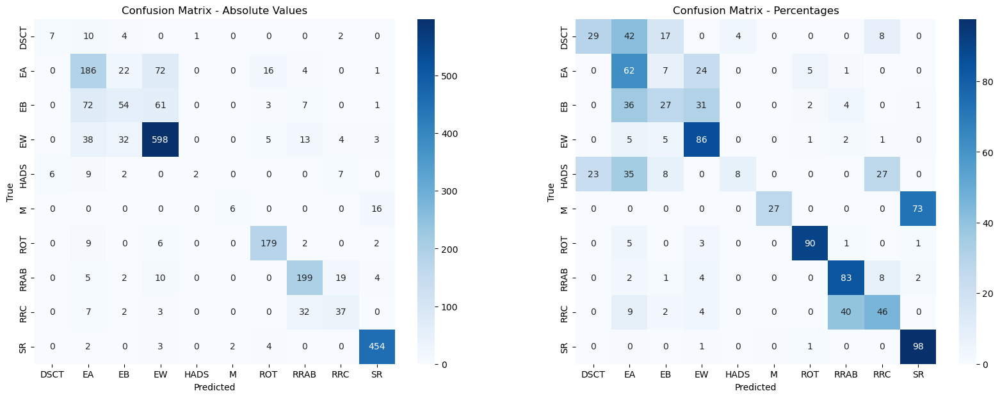

In [39]:
acc = calc_results('MeriDK/AstroCLIPResults/5bn5e4ym', 49)
spectra_acc.append(acc)

In [40]:
np.mean(spectra_acc), np.std(spectra_acc)

(0.7610146862483311, 0.00422199954628622)